# **Imports do Projeto**

In [551]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from scipy.stats import fisher_exact
import seaborn as sns
from colorama import init, Fore, Style
from tabulate import tabulate

# **Anos análisado**

In [552]:
anos = ['2019', '2020', '2021', '2022', '2023']

# **Funções para normalização**

## **Função para normalização (Min-Max Scaling)**

In [553]:
def normalizar_max_min(coluna, minimo, maximo):
    return (coluna - minimo) / (maximo - minimo)

## **Função para calcular os casos normalizados por 100 mil habitantes.**

In [554]:
def calcular_casos_normalizados(casos, populacao_total):
    return casos / (populacao_total / 100000)

# **Pré-processamento de Dados**


**Gera uma tabela consolidada a partir dos arquivos CSV na pasta especificada.**

***
    A função realiza as seguintes etapas:
    1. Lê todos os arquivos CSV na pasta fornecida.
    2. Extrai o total de casos notificados e as informações de ano e região de cada arquivo.
    3. Mapeia as siglas das regiões para seus nomes e códigos correspondentes.
    4. Cria um DataFrame consolidado com os dados extraídos.
    5. Salva o DataFrame consolidado em um arquivo CSV chamado 'tabela_consolidada.csv'.

    Parâmetros:
    pasta_csv (str): O caminho da pasta que contém os arquivos CSV.
***

In [555]:
def gerar_tabela_consolidada(pasta_csv):
   
    mapa_regioes = {
        'AR': {'cidade': 'Angra dos Reis', 'COD_CIDADE': 32},
        #'RJ': {'cidade': 'Rio de Janeiro', 'COD_CIDADE': 33},
        'CG': {'cidade': 'Campos de Goytacazes', 'COD_CIDADE': 34},
        # 'VA': {'cidade': 'Valença', 'COD_CIDADE': 35}
        'MA': {'cidade': 'Macaé', 'COD_CIDADE': 36},
        'AC': {'cidade': 'Arraial do Cabo', 'COD_CIDADE': 37}
    }

    consolidados = []

    for arquivo in os.listdir(pasta_csv):
        if arquivo.endswith(".csv"):
            caminho_arquivo = os.path.join(pasta_csv, arquivo)
            
            try:
                df = pd.read_csv(caminho_arquivo, encoding='latin1')
            except UnicodeDecodeError:
                df = pd.read_csv(caminho_arquivo, encoding='utf-8')
            
            total = df['Casos notificados'].iloc[-1]
            
            nome, _ = os.path.splitext(arquivo)
            partes = nome.split('_')
            ano = partes[0][-4:]
            sigla_regiao = partes[1]
            
            regiao_info = mapa_regioes.get(sigla_regiao)
            if regiao_info:
                cidade = regiao_info['cidade']
                cod_cidade = regiao_info['COD_CIDADE']
                
                consolidados.append({
                    'Nome do Arquivo': arquivo,
                    'Total': total,
                    'Ano': ano,
                    'Região': cidade,
                    'COD_CIDADE': cod_cidade
                })

    df_consolidado = pd.DataFrame(consolidados)

    df_consolidado.to_csv('tabela_consolidada.csv', index=False)

    print("Tabela consolidada salva como 'tabela_consolidada.csv'.")


In [556]:
gerar_tabela_consolidada('casos_dengue_rj')

Tabela consolidada salva como 'tabela_consolidada.csv'.


**Atualiza a tabela de saúde com os totais de casos de dengue da tabela consolidada.**
***
    Parâmetros:
    anos (list): Lista de anos a serem considerados para atualização.
***

In [557]:
def atualizar_tabela_saude(anos):
  
    df_consolidado = pd.read_csv('tabela_consolidada.csv')
    df_saude = pd.read_csv('df-rj-2019-2023-casos de dengue.csv')
    df_saude.columns = df_saude.columns.str.strip()
    df_saude.columns = df_saude.columns.astype(str)

    for ano in anos:
        if ano in df_saude.columns:
            df_saude[ano] = pd.to_numeric(df_saude[ano], errors='coerce')

    for _, row in df_consolidado.iterrows():
        ano = str(row['Ano'])
        total = row['Total']
        cod_cidade = row['COD_CIDADE']
        
        print(f"Processando COD_CIDADE: {cod_cidade}, Ano: {ano}, Total: {total}")

        if cod_cidade in df_saude['COD_CIDADE'].values:
            if ano in df_saude.columns:
                current_value = df_saude.loc[df_saude['COD_CIDADE'] == cod_cidade, ano].values[0]
                if pd.isna(current_value):
                    current_value = 0
                
                new_value = current_value + total
                df_saude.loc[df_saude['COD_CIDADE'] == cod_cidade, ano] = new_value
                
                print(f"Atualizando {ano} para COD_CIDADE {cod_cidade}: novo valor é {new_value}")
            else:
                print(f"Ano '{ano}' não encontrado nas colunas da tabela de saúde.")
        else:
            print(f"COD_CIDADE '{cod_cidade}' não encontrado na tabela de saúde.")

    df_saude.to_csv('tabela_saude_atualizada.csv', index=False)

    print("Tabela de saúde atualizada salva como 'tabela_saude_atualizada.csv'.")


In [558]:
atualizar_tabela_saude(anos)

Processando COD_CIDADE: 37, Ano: 2019, Total: 69
Atualizando 2019 para COD_CIDADE 37: novo valor é 69
Processando COD_CIDADE: 32, Ano: 2019, Total: 1764
Atualizando 2019 para COD_CIDADE 32: novo valor é 1764
Processando COD_CIDADE: 34, Ano: 2019, Total: 177
Atualizando 2019 para COD_CIDADE 34: novo valor é 177
Processando COD_CIDADE: 36, Ano: 2019, Total: 207
Atualizando 2019 para COD_CIDADE 36: novo valor é 207
Processando COD_CIDADE: 37, Ano: 2020, Total: 5
Atualizando 2020 para COD_CIDADE 37: novo valor é 5
Processando COD_CIDADE: 32, Ano: 2020, Total: 187
Atualizando 2020 para COD_CIDADE 32: novo valor é 187
Processando COD_CIDADE: 34, Ano: 2020, Total: 18
Atualizando 2020 para COD_CIDADE 34: novo valor é 18
Processando COD_CIDADE: 36, Ano: 2020, Total: 50
Atualizando 2020 para COD_CIDADE 36: novo valor é 50
Processando COD_CIDADE: 37, Ano: 2021, Total: 14
Atualizando 2021 para COD_CIDADE 37: novo valor é 14
Processando COD_CIDADE: 32, Ano: 2021, Total: 104
Atualizando 2021 para CO

**Este código tem como objetivo limpar e ajustar os dados de população de um arquivo CSV. Primeiro, ele remove quaisquer símbolos ou letras que possam estar misturados nos números da população. Depois, transforma esses valores em números e descarta os dados inválidos. Em seguida, o código encontra o valor mais baixo e o mais alto da população e ajusta todos os números para uma escala de 0 a 1, para facilitar comparações. No final, ele salva esses novos valores em um novo arquivo e mostra o resultado.**
**Lê um arquivo CSV com dados de população, normaliza a coluna 'População Total' e salva os dados normalizados em um novo arquivo CSV.**

***
    Parâmetros:
    - input_file (str): O caminho do arquivo CSV de entrada (padrão: 'habitantes-cidades.csv').
    - output_file (str): O caminho do arquivo CSV de saída (padrão: 'habitantes_normalizados.csv').
***

In [559]:

def normalizar_populacao(input_file='habitantes-cidades.csv', output_file='habitantes_normalizados.csv'):
    df = pd.read_csv(input_file)
    
    df = df[~df['COD_CIDADE'].isin([33, 35])]
    
    df['População Total'] = df['População Total'].astype(str).str.replace(r'\D', '', regex=True)
    df['População Total'] = pd.to_numeric(df['População Total'], errors='coerce')
    df = df.dropna(subset=['População Total'])
    
    min_pop = df['População Total'].min()
    max_pop = df['População Total'].max()
    df['População Normalizada'] = (df['População Total'] - min_pop) / (max_pop - min_pop)
    
    df.to_csv(output_file, index=False)

    print(f"\nDados normalizados salvos em '{output_file}'.")
    print(df)

In [560]:
normalizar_populacao()


Dados normalizados salvos em 'habitantes_normalizados.csv'.
    COD_CIDADE       Região de Saúde  População Total Estado  \
0            1              Cruzeiro          3151400     DF   
1            2            Lago Norte          3582100     DF   
2            3              Lago Sul          2937700     DF   
3            4          Plano Piloto         20618300     DF   
4            5    Sudoeste Octogonal          5003300     DF   
5            6                Varjão           879300     DF   
6            7        Candangolândia          1601900     DF   
7            8            Estrutural          3068700     DF   
8            9                 Guará         10784700     DF   
9           10    Núcleo Bandeirante          2313400     DF   
10          11              Park Way          2034500     DF   
11          12        Riacho Fundo I          3529100     DF   
12          13       Riacho Fundo II          3710800     DF   
13          14                   SIA       

**Pegado somente as colunas necessárias**

In [561]:
colunas_desejadas = [
    'Data', 
    'Hora UTC', 
    'PRECIPITAÇÃO TOTAL, HORÁRIO (mm)', 
    'TEMPERATURA MÁXIMA NA HORA ANT. (AUT) (°C)', 
    'TEMPERATURA MÍNIMA NA HORA ANT. (AUT) (°C)', 
    'UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)', 
    'UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)'
]

def processar_csv(diretorio, arquivo, diretorio_novo):
    caminho_arquivo = os.path.join(diretorio, arquivo)
    df = pd.read_csv(caminho_arquivo)

    df.columns = df.columns.str.strip()

    colunas_presentes = [coluna for coluna in colunas_desejadas if coluna in df.columns]
    df_filtrado = df[colunas_presentes]

    novo_caminho = os.path.join(diretorio_novo, arquivo)
    df_filtrado.to_csv(novo_caminho, index=False)

    print(f'Arquivo {arquivo} processado. Novo arquivo salvo como {novo_caminho}.')

for ano in anos:
    diretorio = str(ano)
    diretorio_novo = f'{ano}-formatado'
    
    os.makedirs(diretorio_novo, exist_ok=True)

    arquivos_csv = [
        f for f in os.listdir(diretorio) 
        if f.endswith('.csv') and not (f.startswith('9') or f.startswith('8'))
    ]

    for arquivo in arquivos_csv:
        processar_csv(diretorio, arquivo, diretorio_novo)


Arquivo 1-2019-BRAZLANDIA.csv processado. Novo arquivo salvo como 2019-formatado\1-2019-BRAZLANDIA.csv.
Arquivo 10-2019-MACAE.csv processado. Novo arquivo salvo como 2019-formatado\10-2019-MACAE.csv.
Arquivo 11-2019-ARRAIALDOCABO.csv processado. Novo arquivo salvo como 2019-formatado\11-2019-ARRAIALDOCABO.csv.
Arquivo 2-2019-AGUAS EMENDADAS.csv processado. Novo arquivo salvo como 2019-formatado\2-2019-AGUAS EMENDADAS.csv.
Arquivo 3-2019-BRASILIA.csv processado. Novo arquivo salvo como 2019-formatado\3-2019-BRASILIA.csv.
Arquivo 4-2019-GAMA.csv processado. Novo arquivo salvo como 2019-formatado\4-2019-GAMA.csv.
Arquivo 5-2019-PARANOA.csv processado. Novo arquivo salvo como 2019-formatado\5-2019-PARANOA.csv.
Arquivo 6-2019-CAMPOSDOSGOYTACAZES.csv processado. Novo arquivo salvo como 2019-formatado\6-2019-CAMPOSDOSGOYTACAZES.csv.
Arquivo 7-2019-ANGRADOSREIS.csv processado. Novo arquivo salvo como 2019-formatado\7-2019-ANGRADOSREIS.csv.
Arquivo 1-2020-BRAZLANDIA.csv processado. Novo arquivo

**Criando a média, os estremos e a normalização: O código processa dados climáticos de arquivos CSV organizados por ano. Ele define funções para calcular médias e extremos, normalizar os dados usando Min-Max Scaling e criar arquivos CSV com os resultados. Para cada ano, lê os arquivos, acumula as informações, calcula as estatísticas e salva os dados em arquivos separados para médias, extremos e normalização, finalizando com uma mensagem de conclusão do processamento.**

In [562]:
diretorios_anos = ['2019-formatado', '2020-formatado', '2021-formatado', '2022-formatado', '2023-formatado']

def calcular_medias(arquivo, diretorio):
    df = pd.read_csv(os.path.join(diretorio, arquivo))
    
    df.columns = df.columns.str.strip()
    df.replace(',', '.', regex=True, inplace=True)
    df['PRECIPITAÇÃO TOTAL, HORÁRIO (mm)'] = pd.to_numeric(df['PRECIPITAÇÃO TOTAL, HORÁRIO (mm)'], errors='coerce')
    df['TEMPERATURA MÁXIMA NA HORA ANT. (AUT) (°C)'] = pd.to_numeric(df['TEMPERATURA MÁXIMA NA HORA ANT. (AUT) (°C)'], errors='coerce')
    df['TEMPERATURA MÍNIMA NA HORA ANT. (AUT) (°C)'] = pd.to_numeric(df['TEMPERATURA MÍNIMA NA HORA ANT. (AUT) (°C)'], errors='coerce')
    df['UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)'] = pd.to_numeric(df['UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)'], errors='coerce')
    df['UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)'] = pd.to_numeric(df['UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)'], errors='coerce')

    # Calcula as médias
    medias = {
        'COD_REG': arquivo.split('-')[0],
        'Arquivo': arquivo,
        'Média de Precipitação': df['PRECIPITAÇÃO TOTAL, HORÁRIO (mm)'].mean(),
        'Média de Temperatura Máxima': df['TEMPERATURA MÁXIMA NA HORA ANT. (AUT) (°C)'].mean(),
        'Média de Temperatura Mínima': df['TEMPERATURA MÍNIMA NA HORA ANT. (AUT) (°C)'].mean(),
        'Média de Umidade Relativa Máxima': df['UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)'].mean(),
        'Média de Umidade Relativa Mínima': df['UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)'].mean(),
    }

    return medias

def processar_ano(diretorio):
    arquivos_csv = [f for f in os.listdir(diretorio) if f.endswith('.csv')]

    medias_data = []

    for arquivo in arquivos_csv:
        medias = calcular_medias(arquivo, diretorio)
        medias_data.append(medias)

    return medias_data

def criar_csv(csv_data, nome_arquivo):
    df_csv = pd.DataFrame(csv_data)
    df_csv.to_csv(nome_arquivo, index=False)

for diretorio in diretorios_anos:
    ano = diretorio.split('-')[0]
    medias_data = processar_ano(diretorio)
    
    criar_csv(medias_data, f'medias_{ano}.csv')

print("Processamento concluído para todos os anos.")

arquivos_medias = {
    '2019': 'medias_2019.csv',
    '2020': 'medias_2020.csv',
    '2021': 'medias_2021.csv',
    '2022': 'medias_2022.csv',
    '2023': 'medias_2023.csv'
}

def calcular_max_min(dfs):
    prec_min = min([df['Média de Precipitação'].min() for df in dfs])
    prec_max = max([df['Média de Precipitação'].max() for df in dfs])
    
    temp_max_min = min([df['Média de Temperatura Máxima'].min() for df in dfs])
    temp_max_max = max([df['Média de Temperatura Máxima'].max() for df in dfs])
    
    temp_min_min = min([df['Média de Temperatura Mínima'].min() for df in dfs])
    temp_min_max = max([df['Média de Temperatura Mínima'].max() for df in dfs])
    
    umidade_max_min = min([df['Média de Umidade Relativa Máxima'].min() for df in dfs])
    umidade_max_max = max([df['Média de Umidade Relativa Máxima'].max() for df in dfs])
    
    umidade_min_min = min([df['Média de Umidade Relativa Mínima'].min() for df in dfs])
    umidade_min_max = max([df['Média de Umidade Relativa Mínima'].max() for df in dfs])

    return {
        'prec_min': prec_min, 'prec_max': prec_max,
        'temp_max_min': temp_max_min, 'temp_max_max': temp_max_max,
        'temp_min_min': temp_min_min, 'temp_min_max': temp_min_max,
        'umidade_max_min': umidade_max_min, 'umidade_max_max': umidade_max_max,
        'umidade_min_min': umidade_min_min, 'umidade_min_max': umidade_min_max
    }

dfs = [pd.read_csv(arquivo) for arquivo in arquivos_medias.values()]
max_min = calcular_max_min(dfs)

for ano, arquivo in arquivos_medias.items():
    df = pd.read_csv(arquivo)
    
    # Normalizando as colunas
    df['PRECIPITAÇÃO NORMALIZADA'] = df['Média de Precipitação'].apply(normalizar_max_min, minimo=max_min['prec_min'], maximo=max_min['prec_max'])
    df['TEMP MAX NORMALIZADA'] = df['Média de Temperatura Máxima'].apply(normalizar_max_min, minimo=max_min['temp_max_min'], maximo=max_min['temp_max_max'])
    df['TEMP MIN NORMALIZADA'] = df['Média de Temperatura Mínima'].apply(normalizar_max_min, minimo=max_min['temp_min_min'], maximo=max_min['temp_min_max'])
    df['UMIDADE MAX NORMALIZADA'] = df['Média de Umidade Relativa Máxima'].apply(normalizar_max_min, minimo=max_min['umidade_max_min'], maximo=max_min['umidade_max_max'])
    df['UMIDADE MIN NORMALIZADA'] = df['Média de Umidade Relativa Mínima'].apply(normalizar_max_min, minimo=max_min['umidade_min_min'], maximo=max_min['umidade_min_max'])

    df_normalizado = pd.DataFrame({
        'COD_REG': df['COD_REG'], 
        'Arquivo': df['Arquivo'],
        'PRECIPITAÇÃO NORMALIZADA': df['PRECIPITAÇÃO NORMALIZADA'],
        'TEMP MAX NORMALIZADA': df['TEMP MAX NORMALIZADA'],
        'TEMP MIN NORMALIZADA': df['TEMP MIN NORMALIZADA'],
        'UMIDADE MAX NORMALIZADA': df['UMIDADE MAX NORMALIZADA'],
        'UMIDADE MIN NORMALIZADA': df['UMIDADE MIN NORMALIZADA']
    })

    nome_arquivo_normalizado = f'normalizacao_{ano}.csv'
    df_normalizado.to_csv(nome_arquivo_normalizado, index=False)
    print(f"Arquivo normalizado salvo: {nome_arquivo_normalizado}")

print("Processamento de normalização concluído para todos os anos.")


Processamento concluído para todos os anos.
Arquivo normalizado salvo: normalizacao_2019.csv
Arquivo normalizado salvo: normalizacao_2020.csv
Arquivo normalizado salvo: normalizacao_2021.csv
Arquivo normalizado salvo: normalizacao_2022.csv
Arquivo normalizado salvo: normalizacao_2023.csv
Processamento de normalização concluído para todos os anos.


**Gera tabelas de saúde por ano a partir dos arquivos CSV de saúde e população normalizada.**
***
    A função realiza as seguintes etapas:
    1. Carrega os arquivos CSV de saúde e população normalizada.
    2. Mescla os dados utilizando a coluna COD_CIDADE.
    3. Para cada ano especificado, seleciona as colunas desejadas e renomeia a coluna de casos.
    4. Salva os DataFrames resultantes em arquivos CSV separados para cada ano.

    Parâmetros:
    arquivo_saude (str): O caminho do arquivo CSV com os dados de saúde.
    arquivo_populacao (str): O caminho do arquivo CSV com os dados de população normalizada.
    anos (list): Uma lista de anos (ex: [2019, 2020, 2021]) para os quais as tabelas serão geradas.
 ***


In [563]:
def gerar_tabelas_por_ano(arquivo_saude, arquivo_populacao, anos):

    saude_df = pd.read_csv(arquivo_saude)
    pop_df = pd.read_csv(arquivo_populacao)

    merged_df = pd.merge(saude_df, pop_df[['COD_CIDADE', 'População Total', 'População Normalizada']], on='COD_CIDADE')

    tabelas_por_ano = {}

    for ano in anos:
        ano_df = merged_df[['COD_CIDADE', 'COD_REG', 'Região de Saúde', ano, 'População Total', 'População Normalizada']].copy()
        ano_df.rename(columns={ano: 'Casos'}, inplace=True)

        ano_df['casos_normalizados_cem_mil'] = ano_df.apply(
            lambda row: calcular_casos_normalizados(row['Casos'], row['População Total']), axis=1
        )

        tabelas_por_ano[ano] = ano_df

    todos_casos_normalizados = pd.concat([df['Casos'] for df in tabelas_por_ano.values()])
    minimo_global = todos_casos_normalizados.min()
    maximo_global = todos_casos_normalizados.max()

    for ano, ano_df in tabelas_por_ano.items():
        ano_df['casos_normalizados'] = ano_df['Casos'].apply(
            lambda x: normalizar_max_min(x, minimo_global, maximo_global)
        )

        ano_df.to_csv(f'tabela_saude_{ano}.csv', index=False)

    print("Arquivos CSV gerados com sucesso!")


In [564]:
gerar_tabelas_por_ano('tabela_saude_atualizada.csv', 'habitantes_normalizados.csv', anos)

Arquivos CSV gerados com sucesso!


**Gera tabelas de saúde com dados de normalização para cada ano fornecido.**
***
    Para cada ano na lista de anos, a função:
    1. Carrega os arquivos CSV de saúde e normalização correspondentes ao ano.
    2. Seleciona apenas as colunas relevantes da tabela de normalização.
    3. Mescla os dados de saúde com os dados de normalização usando a coluna COD_REG.
    4. Salva o resultado em um novo arquivo CSV, indicando que os dados de normalização foram adicionados.
    
    Parâmetros:
    anos (list): Uma lista de anos para os quais as tabelas serão geradas.
   ***

In [565]:
def gerar_tabelas_com_normalizacao(anos):
   
    for ano in anos:
        tabela_saude_path = f'tabela_saude_{ano}.csv'
        normalizacao_path = f'normalizacao_{ano}.csv'
        
        tabela_saude_df = pd.read_csv(tabela_saude_path)
        normalizacao_df = pd.read_csv(normalizacao_path)
        
        normalizacao_df = normalizacao_df[[
             'COD_REG', 
             'PRECIPITAÇÃO NORMALIZADA', 
             'TEMP MAX NORMALIZADA',         
             'TEMP MIN NORMALIZADA', 
             'UMIDADE MAX NORMALIZADA', 
             'UMIDADE MIN NORMALIZADA' 
        ]]
        
        tabela_completa_df = pd.merge(tabela_saude_df, normalizacao_df, on='COD_REG', how='left')
        
        tabela_completa_path = f'tabela_saude_com_normalizacao_{ano}.csv'
        tabela_completa_df.to_csv(tabela_completa_path, index=False)

        print(f"Arquivo gerado: {tabela_completa_path}")

**Processa os dados de saúde para um determinado ano, realizando análise descritiva,matriz de correlação e gráficos de dispersão.**
***
    Parâmetros:
    ano (int): O ano a ser processado.
***

In [566]:
gerar_tabelas_com_normalizacao(anos)

Arquivo gerado: tabela_saude_com_normalizacao_2019.csv
Arquivo gerado: tabela_saude_com_normalizacao_2020.csv
Arquivo gerado: tabela_saude_com_normalizacao_2021.csv
Arquivo gerado: tabela_saude_com_normalizacao_2022.csv
Arquivo gerado: tabela_saude_com_normalizacao_2023.csv


# **Análise Estátistica**

## **Funções**

**Realiza uma análise descritiva básica para o DataFrame fornecido e imprime as estatísticas descritivas.**

In [567]:
def analise_descritiva(df, regiao, ano):
    descricao = df.describe().round(2)

    def highlight_max(s):
        return ['background-color: yellow' if v == s.max() else '' for v in s]

    styled = descricao.style \
        .apply(highlight_max) \
        .set_properties(**{
            'background-color': '#f9f9f9',
            'color': '#333',
            'border-color': '#ddd',
            'border-width': '1px',
            'border-style': 'solid',
            'font-size': '14px',
            'text-align': 'center'
        }) \
        .set_table_styles([{
            'selector': 'th',
            'props': [('background-color', '#4CAF50'), ('color', 'white'), ('font-weight', 'bold')]
        }, {
            'selector': 'caption',
            'props': [('font-size', '16px'), ('font-weight', 'bold')]
        }]) \
        .set_caption(f"Análise Descritiva para {regiao} - Ano {ano}")
    
    return styled


**Calcula a matriz de correlação para as colunas numéricas do DataFrame e a visualiza como um gráfico de calor.**

In [568]:
def calcular_correlacao(df, regiao, ano):
    numerical_df = df.select_dtypes(include=[np.number])
    correlation_matrix = numerical_df.corr()

    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True)
    plt.title(f'Matriz de Correlação para {regiao} ({ano})', fontsize=16)
    plt.show()

**Gera gráficos de dispersão para as características especificadas em relação aos casos normalizados de dengue para o Distrito Federal e Rio de Janeiro.**

In [569]:
def gerar_graficos(df, features, ano, cidade):
    # Cria uma lista para armazenar os resultados de correlação
    correlacoes = []
    
    for feature in features:
        plt.figure(figsize=(10, 6))
        
        # Scatter plot
        sns.scatterplot(
            data=df,
            x=feature,
            y='casos_normalizados',
            label=cidade,
            color='blue' if cidade == 'Distrito Federal' else 'red',
            alpha=0.6,
            s=100
        )
        
        sns.regplot(
            data=df,
            x=feature,
            y='casos_normalizados',
            scatter=False,
            color='orange',
            ci=None, 
            line_kws={'linestyle': '--', 'linewidth': 2}
        )
        
        corr = df[[feature, 'casos_normalizados']].corr().iloc[0, 1]

        plt.title(f'Relação entre Casos de Dengue e {feature} em {cidade} ({ano})', fontsize=16)
        plt.xlabel(feature, fontsize=14) 
        plt.ylabel('Casos de Dengue Normalizados', fontsize=14)
        
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.7)

        plt.text(0.95, 0.05, f'Correlação: {corr:.2f}', transform=plt.gca().transAxes,
                 fontsize=12, verticalalignment='bottom', horizontalalignment='right',
                 bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

        plt.tight_layout()
        plt.show()

        # Armazena a correlação em uma lista
        correlacoes.append({'Feature': feature, 'Correlacao': corr})
    
    # Cria um DataFrame a partir das correlações
    df_correlacoes = pd.DataFrame(correlacoes)

    # Gera o gráfico de correlações
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Feature', y='Correlacao', data=df_correlacoes, color='teal')  # Define uma cor fixa para as barras
    plt.axhline(0, color='grey', linestyle='--')  # Linha horizontal em y=0
    plt.title('Correlação entre Casos de Dengue e Variáveis', fontsize=16)
    plt.xlabel('Variáveis', fontsize=14)
    plt.ylabel('Correlação', fontsize=14)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

**Processa os dados de um ano específico, realizando a leitura do arquivo CSV, separação dos dados do Rio de Janeiro e do Distrito Federal, e executando análises descritivas, cálculos de correlação e geração de gráficos.**

In [570]:
tabelas_dengue_df = []
tabelas_dengue_rio = []

def processar_ano_distintos(ano):
    file_path_resultados = f'tabela_saude_com_normalizacao_{ano}.csv'  # Ajusta para múltiplos anos
    df = pd.read_csv(file_path_resultados)

    df_relevante = df.drop(columns=['COD_CIDADE', 'COD_REG'])

    df_relevante.columns = df_relevante.columns.str.replace(' ', '_').str.replace('á', 'a').str.replace('é', 'e').str.replace('í', 'i').str.replace('ó', 'o').str.replace('ú', 'u')

     # df_rio = df_relevante.iloc[-4:].copy()  # Últimos 4 registros para Rio de Janeiro
    # df_df = df_relevante.iloc[:-4].copy()   # Todos os registros menos os últimos 4

    df_rio = df_relevante.iloc[-4:].copy()  # Últimos 2 registros para Rio de Janeiro
    df_df = df_relevante.iloc[:-4].copy()   # Todos os registros menos os últimos 2

    analise_descritiva(df_rio, "Rio de Janeiro", ano)
    analise_descritiva(df_df, "Distrito Federal", ano)

    calcular_correlacao(df_rio, "Rio de Janeiro", ano)
    calcular_correlacao(df_df, "Distrito Federal", ano)

    features = [
        'População_Normalizada',
        'PRECIPITAÇÃO_NORMALIZADA', 
        'TEMP_MAX_NORMALIZADA',
        'TEMP_MIN_NORMALIZADA', 
        'UMIDADE_MAX_NORMALIZADA',
        'UMIDADE_MIN_NORMALIZADA'
    ]

    gerar_graficos_df(df_df, features, ano)
    gerar_graficos_rio(df_rio, features, ano)

    df_df.loc[:, 'Ano'] = ano
    df_rio.loc[:, 'Ano'] = ano
    tabelas_dengue_df.append(df_df)
    tabelas_dengue_rio.append(df_rio)

In [571]:
# for ano in anos:
#     processar_ano_distintos(ano)

**Processa os dados de um ano específico, lendo o arquivo CSV, realizando análises descritivas, cálculos de correlação, e gerando gráficos de dispersão para as características relacionadas aos casos de dengue.**


In [572]:
tabelas_dengue = []

def processar_ano(ano):
    file_path_resultados = f'tabela_saude_com_normalizacao_{ano}.csv'  # Ajusta para múltiplos anos
    df = pd.read_csv(file_path_resultados)

    df_relevante = df.drop(columns=['COD_CIDADE', 'COD_REG'])

    df_relevante.columns = df_relevante.columns.str.replace(' ', '_').str.replace('á', 'a').str.replace('é', 'e').str.replace('í', 'i').str.replace('ó', 'o').str.replace('ú', 'u')

    numerical_df = df_relevante.select_dtypes(include=[np.number])

    # Separa os dados do Rio de Janeiro e do restante do DF
    # df_rio = df_relevante.iloc[-4:].copy()  # Últimos 4 registros para Rio de Janeiro
    # df_df = df_relevante.iloc[:-4].copy()   # Todos os registros menos os últimos 4

    df_rio = df_relevante.iloc[-4:].copy()  # Últimos 2 registros para Rio de Janeiro
    df_df = df_relevante.iloc[:-4].copy()   # Todos os registros menos os últimos 2

    df_relevante['Ano'] = ano
    tabelas_dengue.append(df_relevante)

In [573]:
for ano in anos:
    processar_ano(ano)

# **Análise Estátistica de 2019** 

In [574]:
    file_path_resultados = f'tabela_saude_com_normalizacao_2019.csv'
    df = pd.read_csv(file_path_resultados)
    ano = '2019'

    df_relevante = df.drop(columns=['COD_CIDADE', 'COD_REG'])

    df_relevante.columns = df_relevante.columns.str.replace(' ', '_').str.replace('á', 'a').str.replace('é', 'e').str.replace('í', 'i').str.replace('ó', 'o').str.replace('ú', 'u')

     # df_rio = df_relevante.iloc[-4:].copy()  # Últimos 4 registros para Rio de Janeiro
    # df_df = df_relevante.iloc[:-4].copy()   # Todos os registros menos os últimos 4

    df_rio = df_relevante.iloc[-4:].copy()  # Últimos 2 registros para Rio de Janeiro
    df_df = df_relevante.iloc[:-4].copy()   # Todos os registros menos os últimos 2

    features = [
        'População_Normalizada',
        'PRECIPITAÇÃO_NORMALIZADA', 
        'TEMP_MAX_NORMALIZADA',
        'TEMP_MIN_NORMALIZADA', 
        'UMIDADE_MAX_NORMALIZADA',
        'UMIDADE_MIN_NORMALIZADA'
    ]

## **Distrito Federal(DF)**

In [575]:
analise_descritiva(df_df, "Distrito Federal", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados_cem_mil,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000
mean,1386.770000,8350006.450000,0.200000,21.360000,0.120000,0.360000,0.310000,0.280000,0.170000,0.150000
std,1313.200000,8444581.370000,0.210000,18.220000,0.110000,0.040000,0.080000,0.050000,0.070000,0.060000
min,6.000000,435600.000000,0.000000,1.380000,0.000000,0.300000,0.240000,0.200000,0.030000,0.030000
25%,403.000000,3110050.000000,0.070000,9.150000,0.030000,0.320000,0.260000,0.260000,0.130000,0.130000
50%,862.000000,5208900.000000,0.120000,13.760000,0.070000,0.380000,0.260000,0.260000,0.130000,0.130000
75%,1973.000000,11376900.000000,0.270000,25.450000,0.170000,0.380000,0.380000,0.320000,0.210000,0.180000
max,5667.000000,40593200.000000,1.000000,75.290000,0.490000,0.440000,0.430000,0.370000,0.310000,0.270000


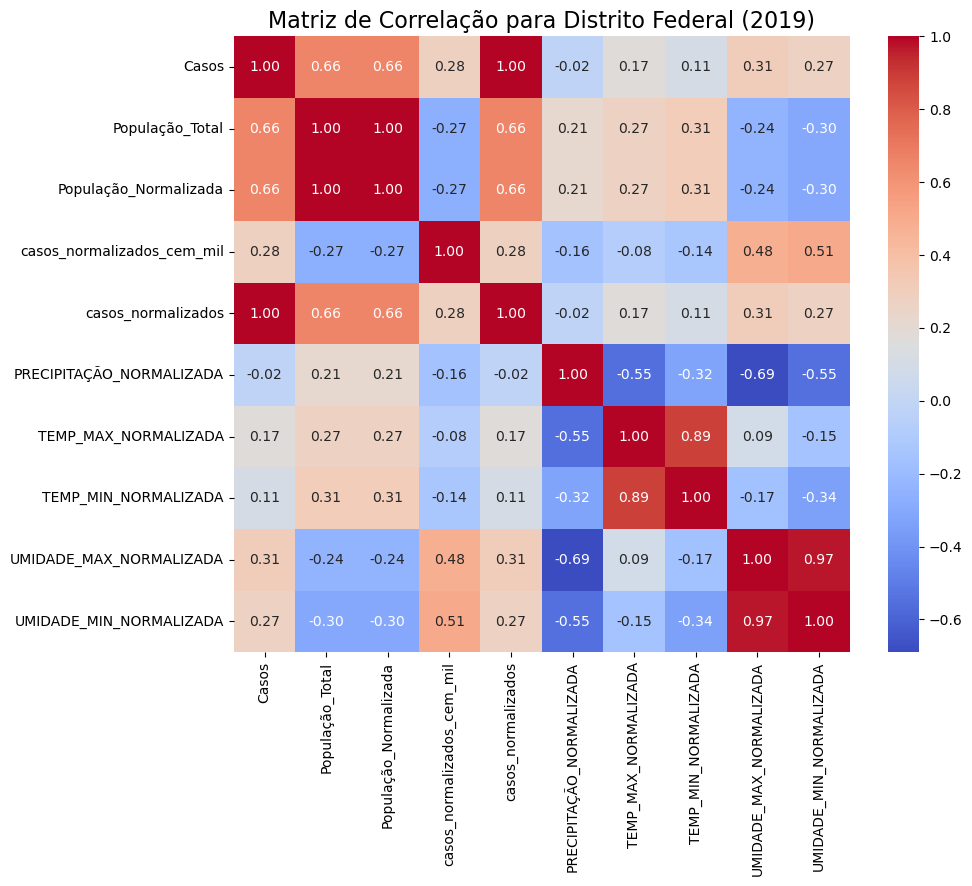

In [576]:
calcular_correlacao(df_df, "Distrito Federal", ano)

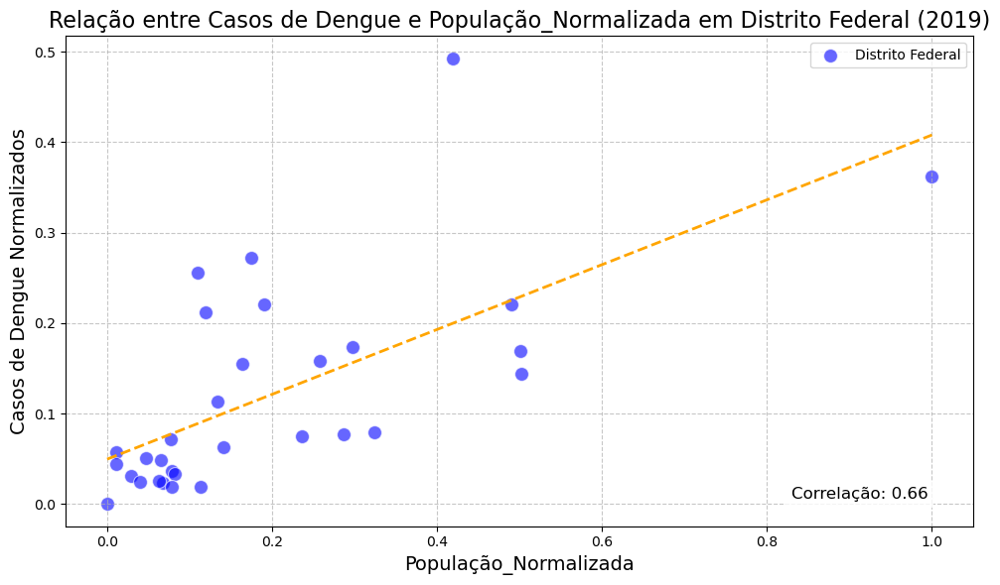

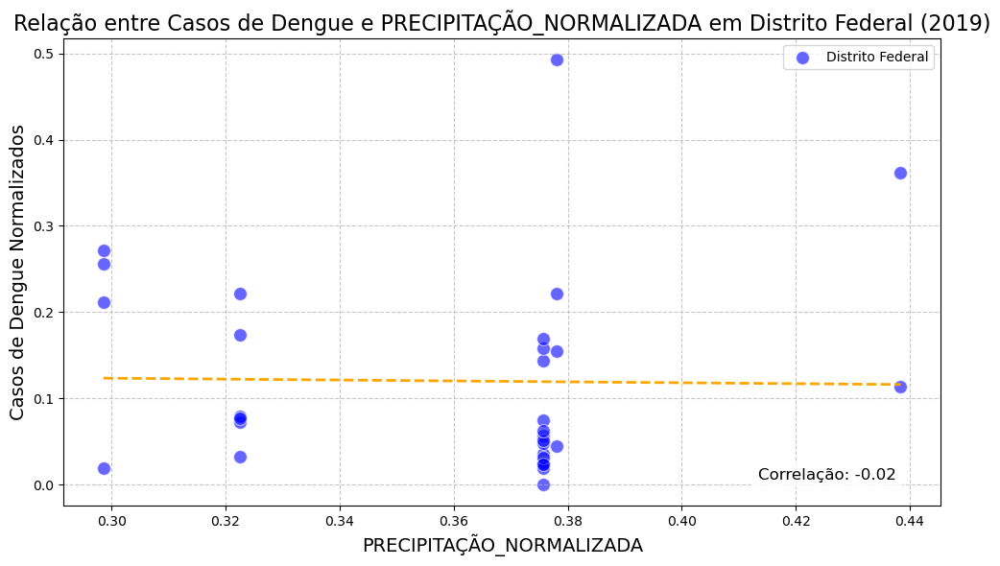

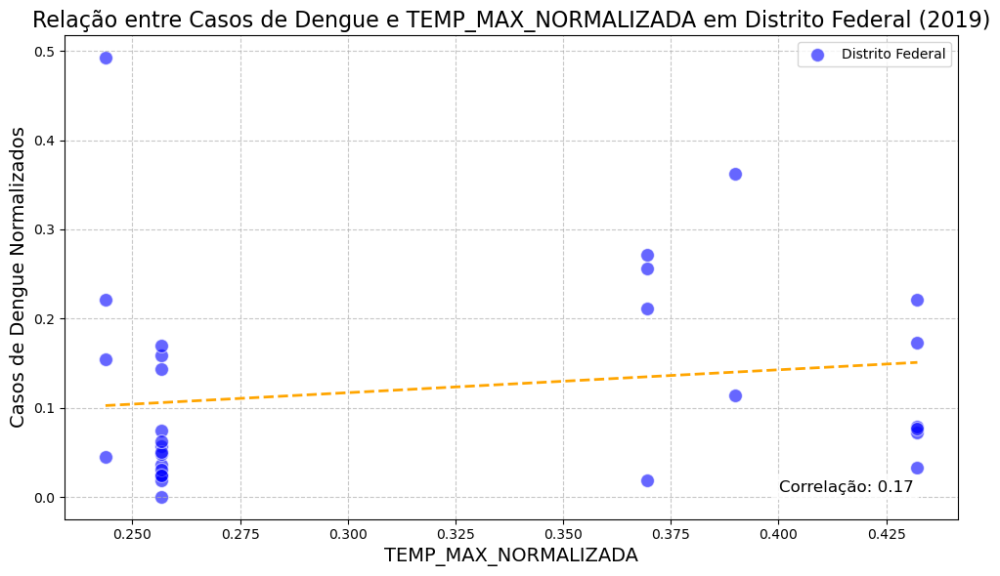

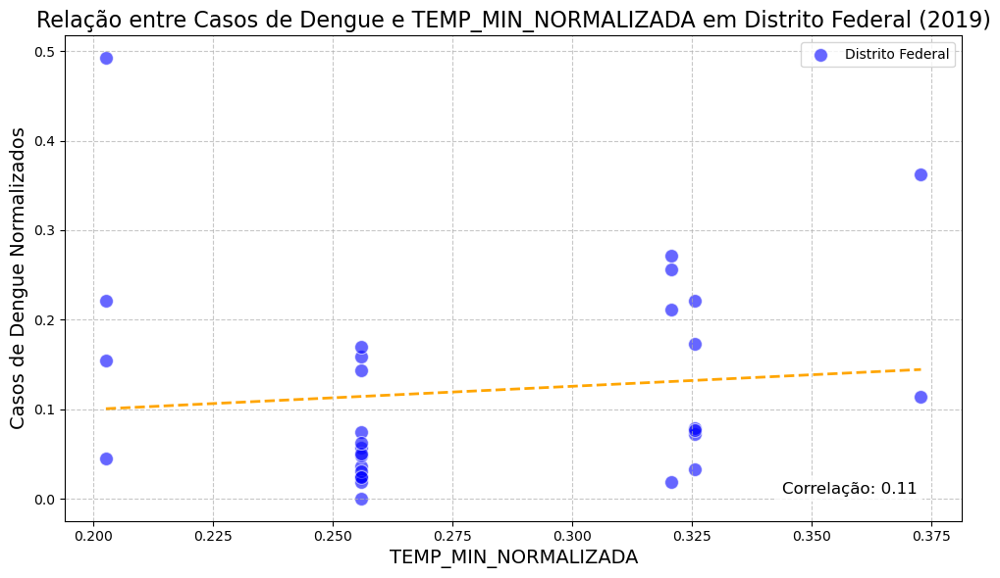

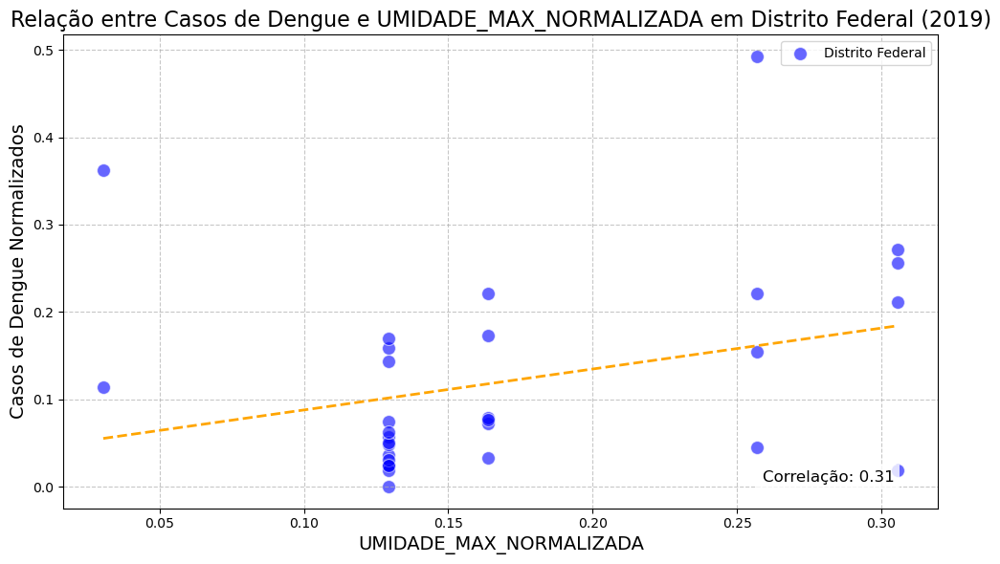

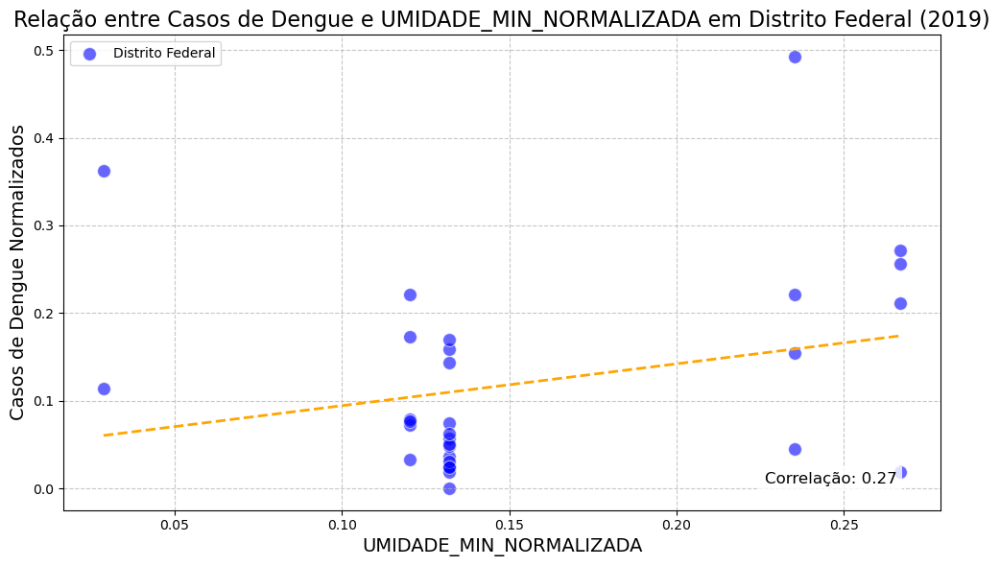

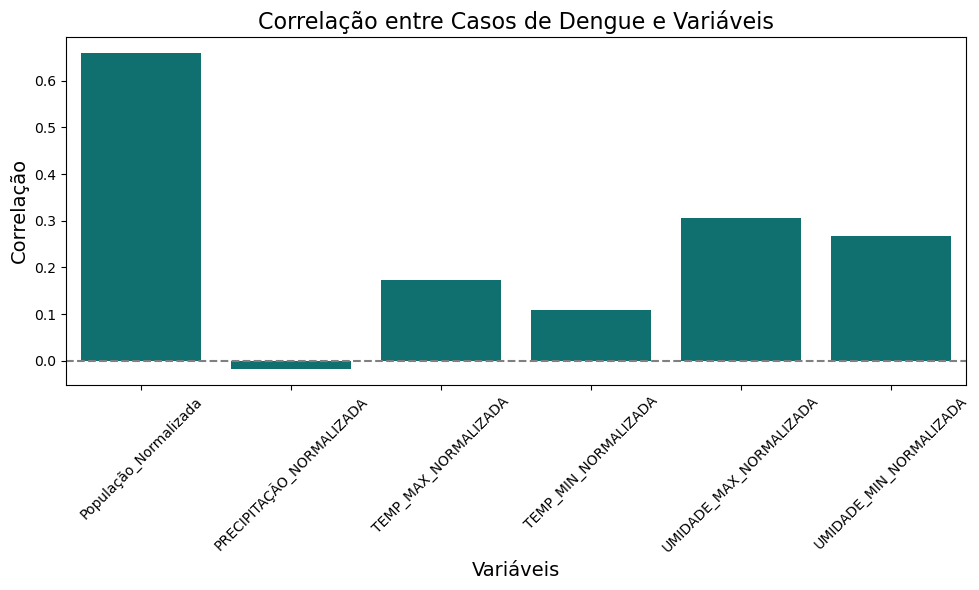

In [577]:
gerar_graficos(df_df, features, ano, 'Distrito Federal')

## **Rio de Janeiro(RJ)**

In [578]:
analise_descritiva(df_rio, "Rio de Janeiro", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados_cem_mil,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000
mean,554.250000,12329125.000000,0.300000,4.320000,0.050000,0.430000,0.840000,0.870000,0.810000,0.840000
std,808.670000,10204244.450000,0.250000,4.300000,0.070000,0.280000,0.100000,0.100000,0.150000,0.150000
min,69.000000,3098600.000000,0.070000,0.840000,0.010000,0.220000,0.740000,0.770000,0.590000,0.620000
25%,150.000000,4401200.000000,0.100000,1.880000,0.010000,0.240000,0.780000,0.790000,0.760000,0.790000
50%,192.000000,10789400.000000,0.260000,2.940000,0.020000,0.350000,0.820000,0.870000,0.840000,0.890000
75%,596.250000,18717325.000000,0.460000,5.380000,0.050000,0.540000,0.890000,0.950000,0.890000,0.940000
max,1764.000000,24639100.000000,0.600000,10.540000,0.150000,0.830000,0.980000,0.960000,0.960000,0.950000


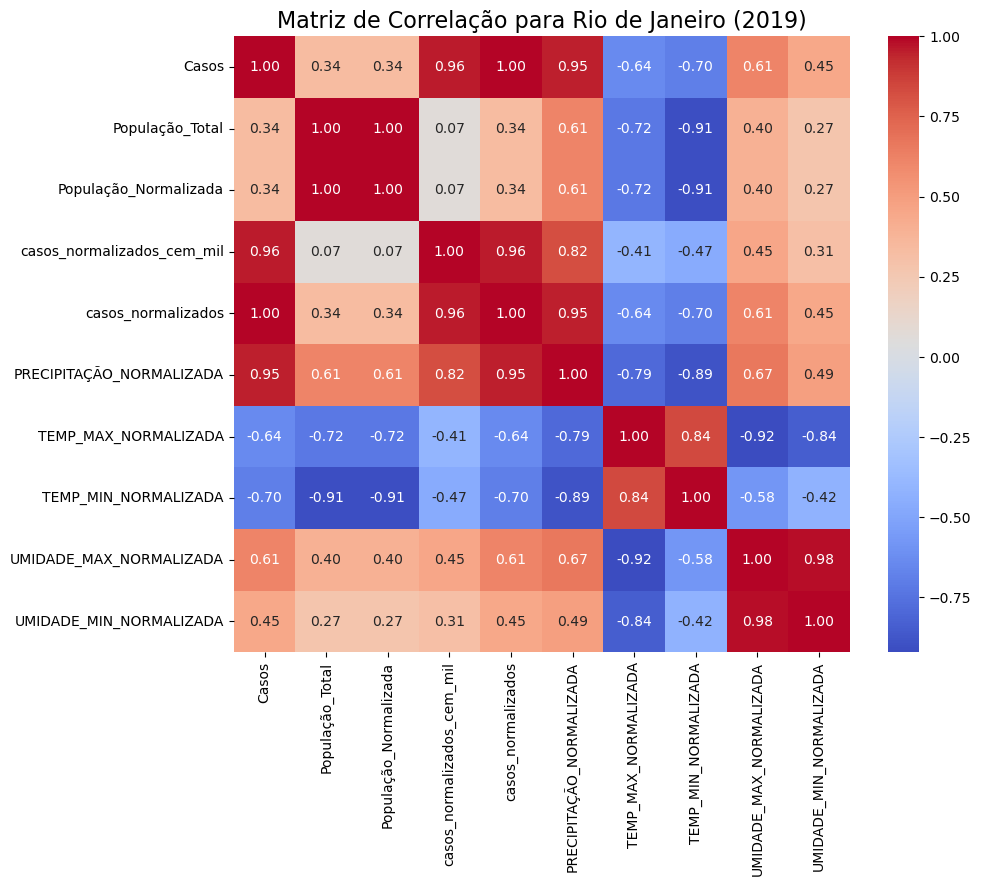

In [579]:
calcular_correlacao(df_rio, "Rio de Janeiro", ano)

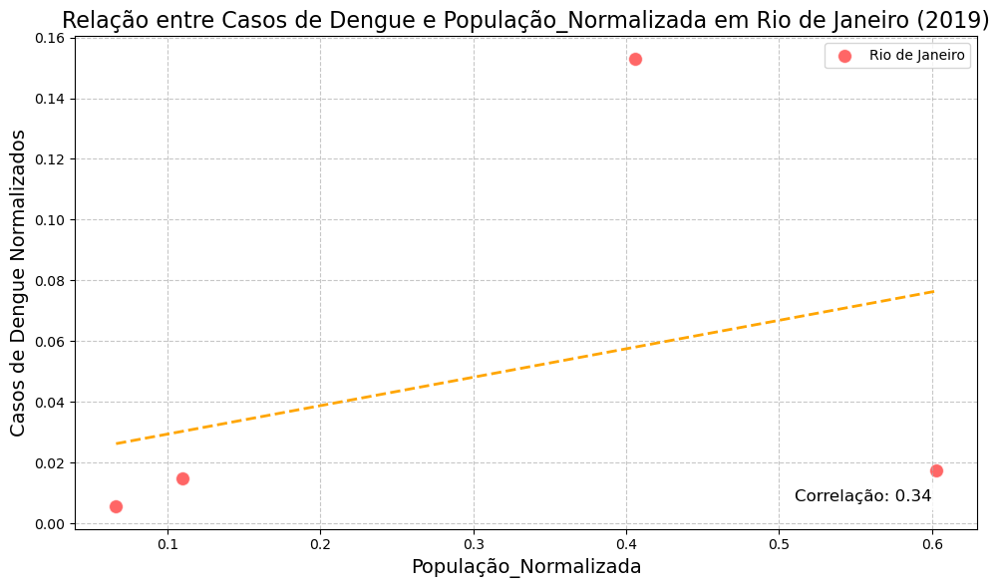

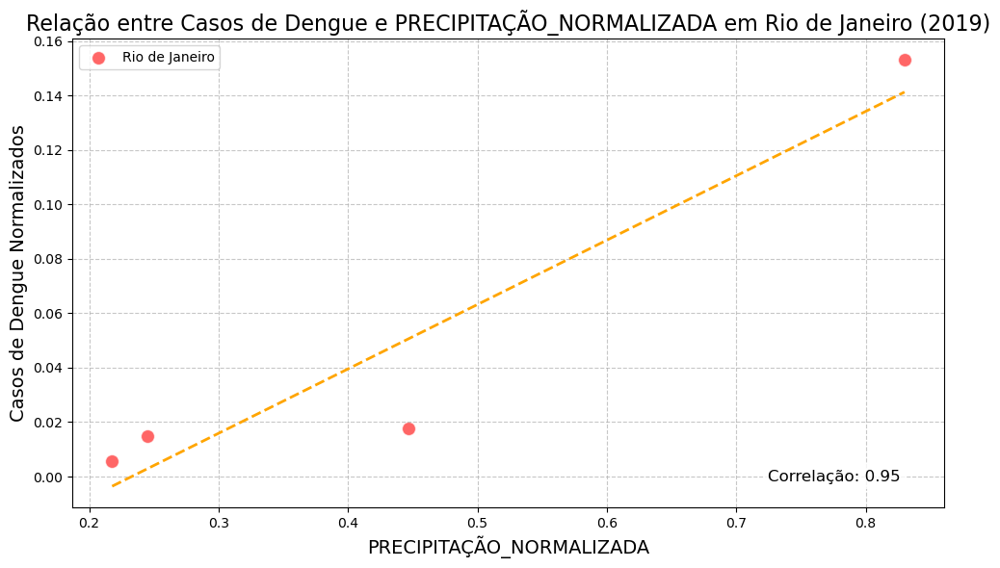

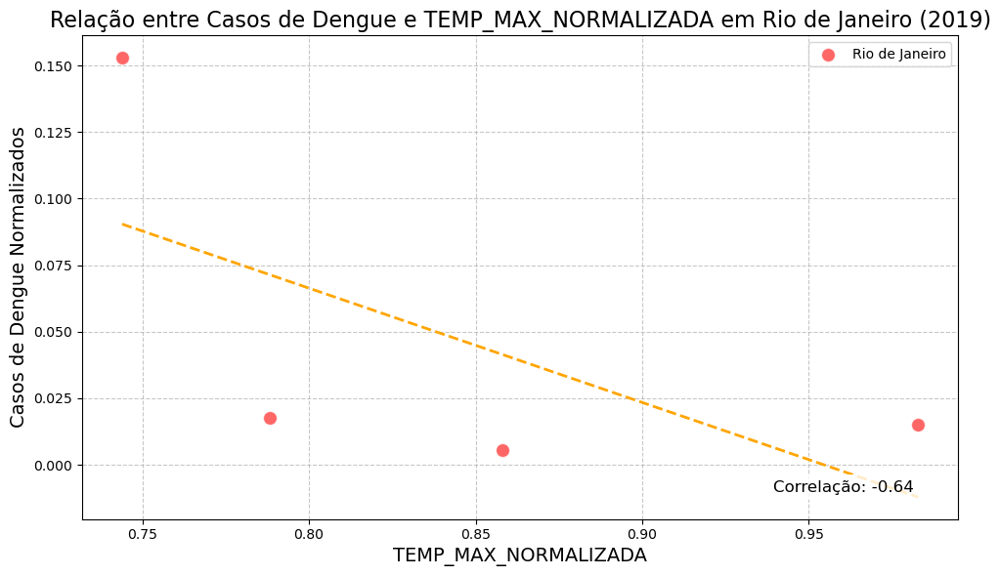

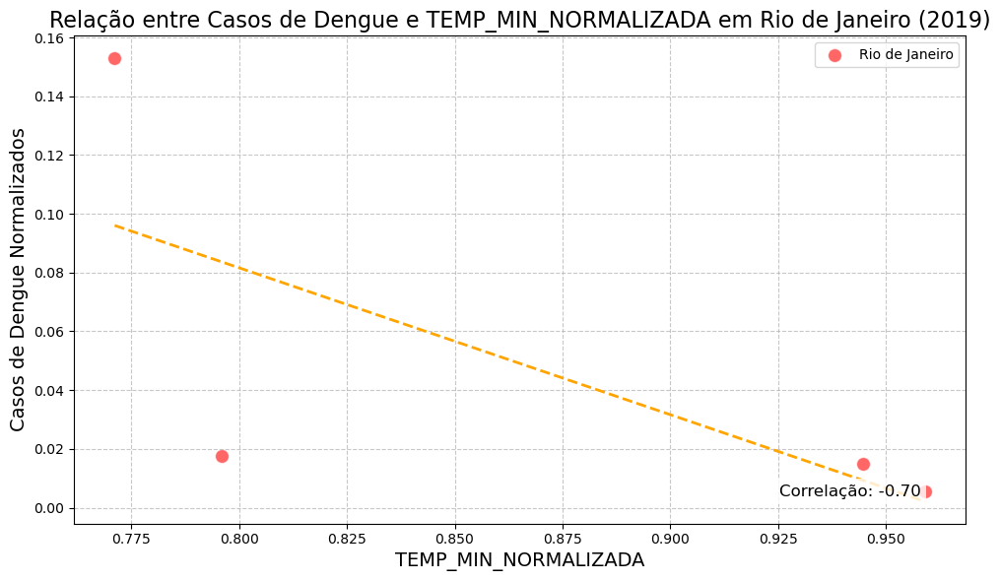

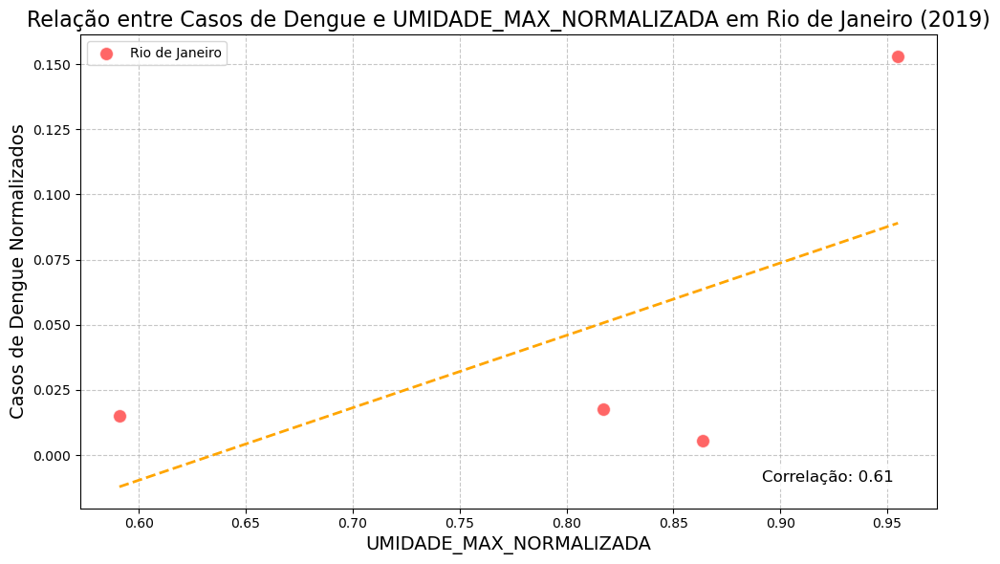

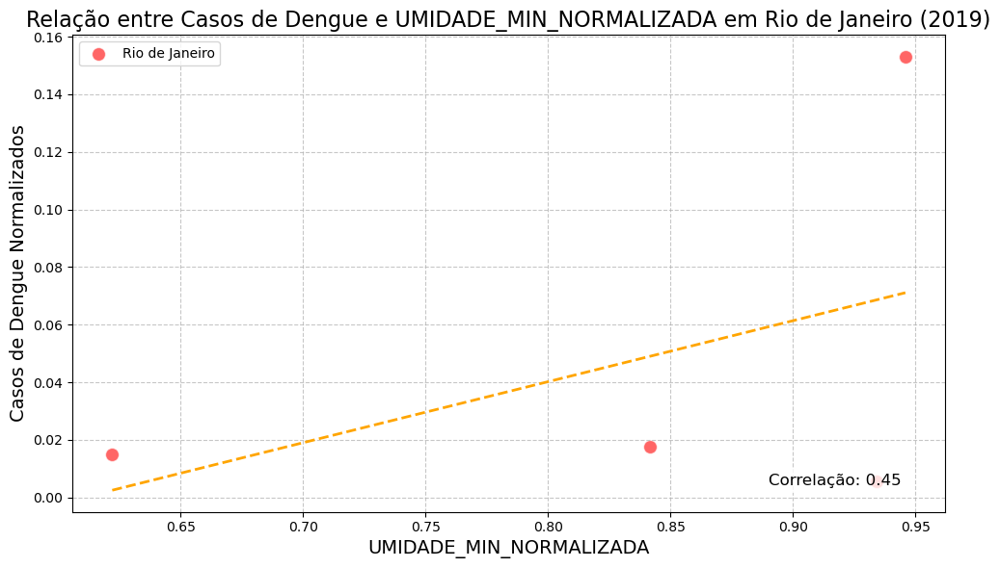

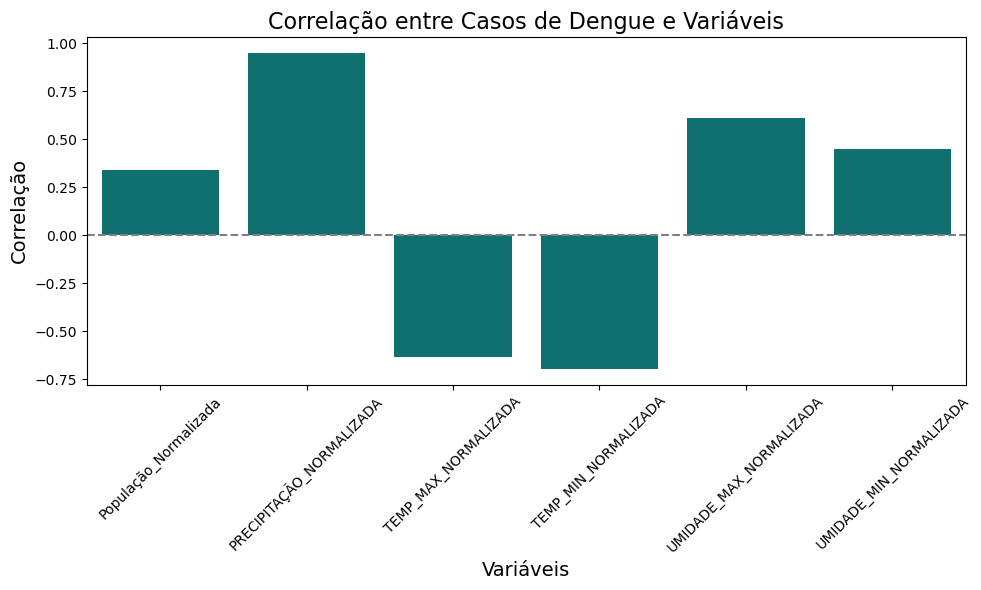

In [580]:
gerar_graficos(df_rio, features, ano, 'Rio de Janeiro')

## **Rio de Janeiro(RJ) e Distrito Federal(DF)**

In [581]:
analise_descritiva(df_relevante, "Rio de Janeiro(RJ) e Distrito Federal(DF)", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados_cem_mil,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000
mean,1291.630000,8804762.860000,0.210000,19.410000,0.110000,0.370000,0.370000,0.350000,0.240000,0.230000
std,1285.120000,8588302.350000,0.210000,18.030000,0.110000,0.090000,0.190000,0.200000,0.220000,0.230000
min,6.000000,435600.000000,0.000000,0.840000,0.000000,0.220000,0.240000,0.200000,0.030000,0.030000
25%,332.500000,3125000.000000,0.070000,8.380000,0.030000,0.320000,0.260000,0.260000,0.130000,0.130000
50%,834.000000,5208900.000000,0.120000,11.810000,0.070000,0.380000,0.260000,0.260000,0.160000,0.130000
75%,1889.500000,12165300.000000,0.290000,24.490000,0.160000,0.380000,0.430000,0.330000,0.260000,0.240000
max,5667.000000,40593200.000000,1.000000,75.290000,0.490000,0.830000,0.980000,0.960000,0.960000,0.950000


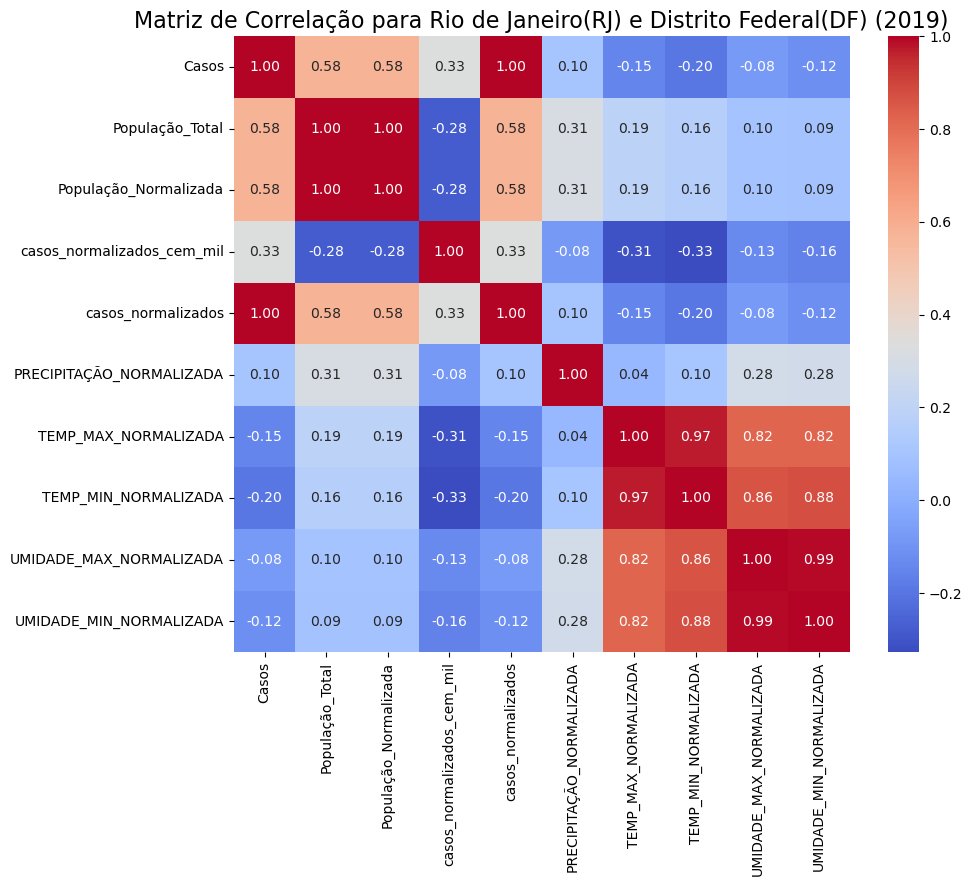

In [582]:
calcular_correlacao(df_relevante, "Rio de Janeiro(RJ) e Distrito Federal(DF)", ano)

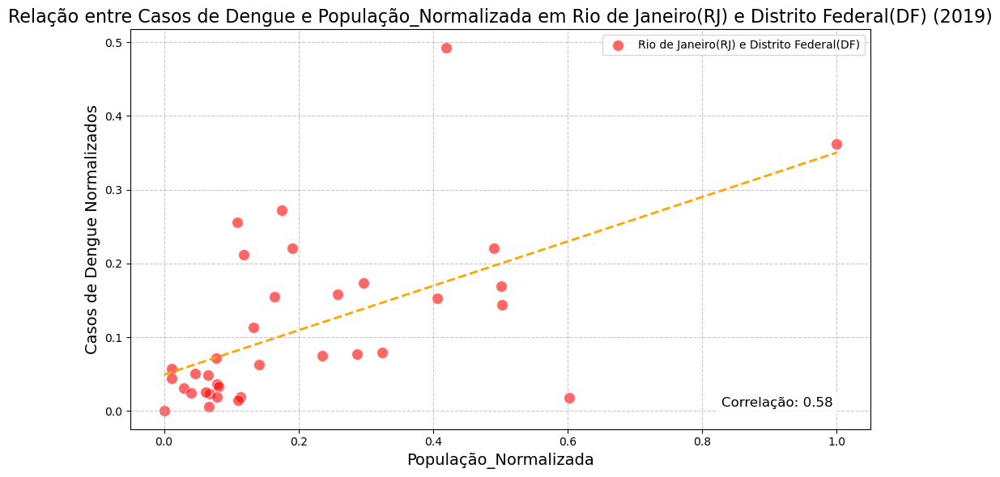

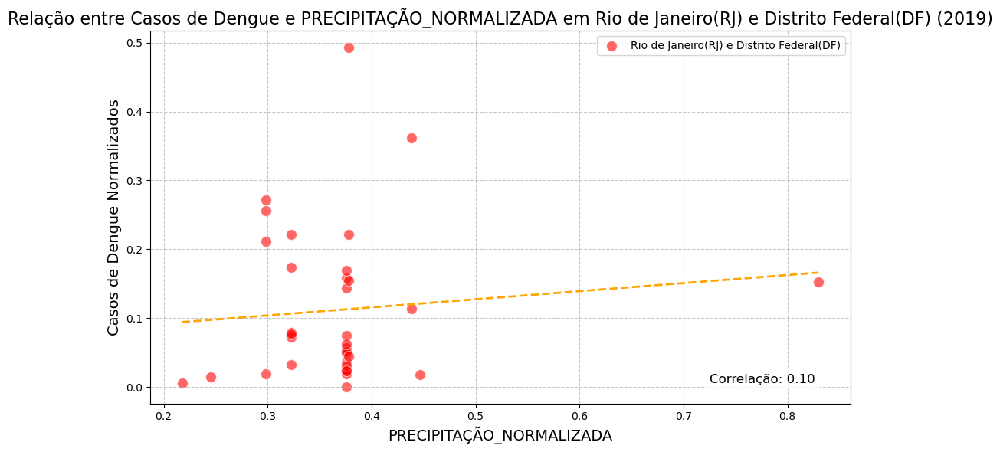

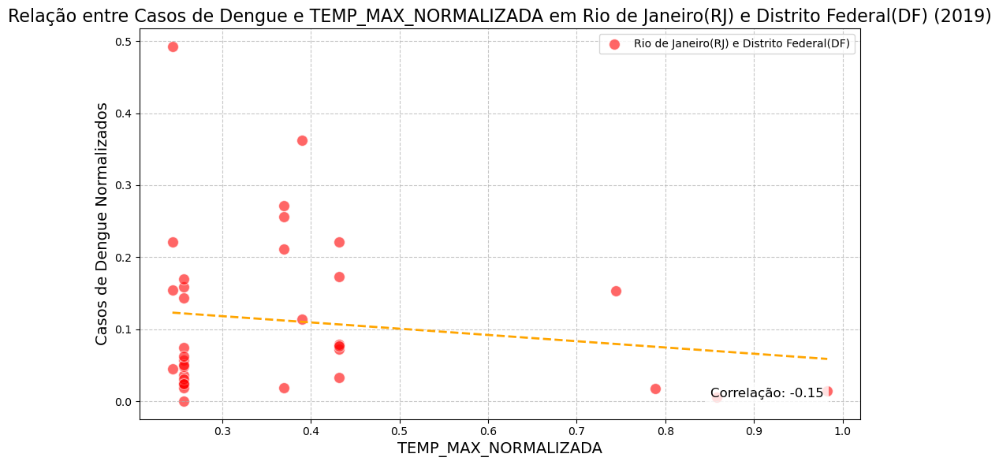

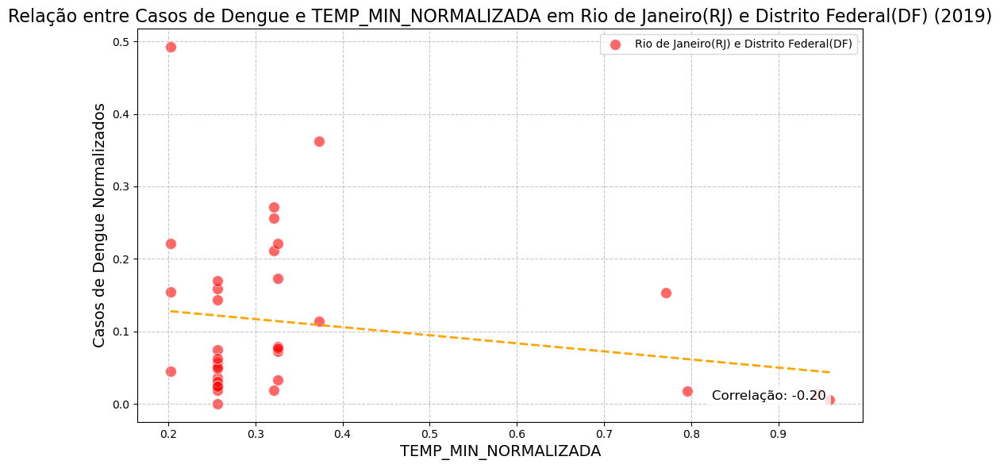

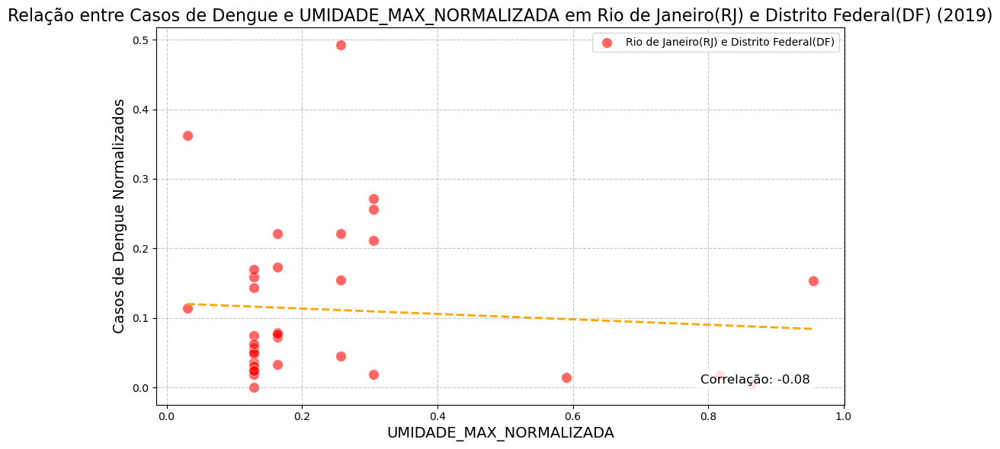

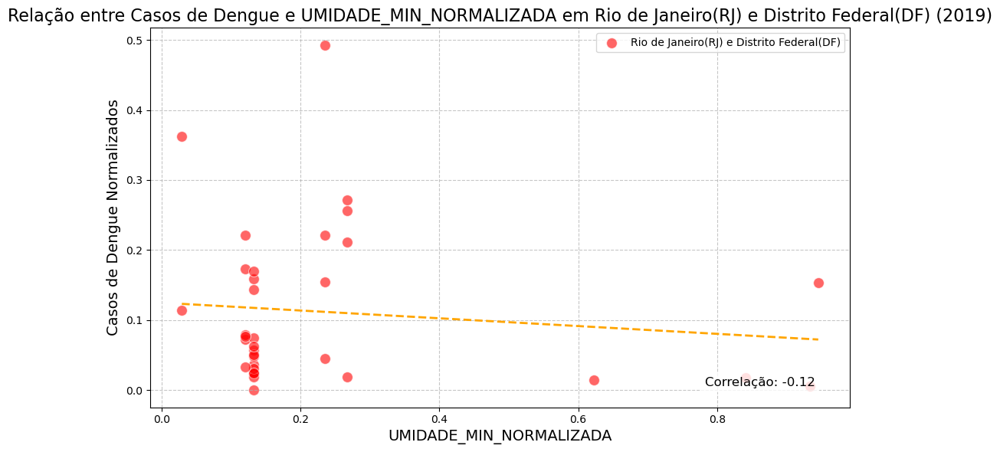

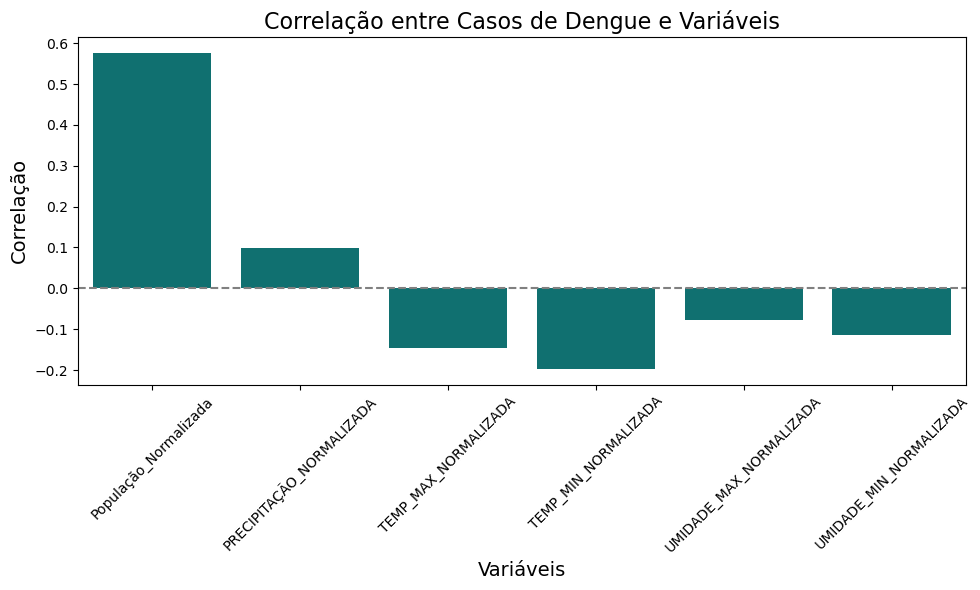

In [583]:
gerar_graficos(df_relevante, features, ano, 'Rio de Janeiro(RJ) e Distrito Federal(DF)')

# **Análise Estátistica de 2020**

In [584]:
    file_path_resultados = f'tabela_saude_com_normalizacao_2020.csv'
    df = pd.read_csv(file_path_resultados)
    ano = '2020'

    df_relevante = df.drop(columns=['COD_CIDADE', 'COD_REG'])

    df_relevante.columns = df_relevante.columns.str.replace(' ', '_').str.replace('á', 'a').str.replace('é', 'e').str.replace('í', 'i').str.replace('ó', 'o').str.replace('ú', 'u')

     # df_rio = df_relevante.iloc[-4:].copy()  # Últimos 4 registros para Rio de Janeiro
    # df_df = df_relevante.iloc[:-4].copy()   # Todos os registros menos os últimos 4

    df_rio = df_relevante.iloc[-4:].copy()  # Últimos 2 registros para Rio de Janeiro
    df_df = df_relevante.iloc[:-4].copy()   # Todos os registros menos os últimos 2

    features = [
        'População_Normalizada',
        'PRECIPITAÇÃO_NORMALIZADA', 
        'TEMP_MAX_NORMALIZADA',
        'TEMP_MIN_NORMALIZADA', 
        'UMIDADE_MAX_NORMALIZADA',
        'UMIDADE_MIN_NORMALIZADA'
    ]

## **Distrito Federal(DF)**

In [585]:
analise_descritiva(df_df, "Distrito Federal", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados_cem_mil,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000
mean,1515.290000,8350006.450000,0.200000,17.500000,0.130000,0.550000,0.110000,0.140000,0.280000,0.270000
std,1500.410000,8444581.370000,0.210000,9.880000,0.130000,0.110000,0.110000,0.070000,0.100000,0.090000
min,14.000000,435600.000000,0.000000,3.210000,0.000000,0.460000,0.030000,0.050000,0.170000,0.160000
25%,310.000000,3110050.000000,0.070000,11.190000,0.030000,0.460000,0.040000,0.100000,0.220000,0.220000
50%,648.000000,5208900.000000,0.120000,14.290000,0.060000,0.480000,0.040000,0.100000,0.260000,0.260000
75%,2656.000000,11376900.000000,0.270000,21.890000,0.230000,0.630000,0.140000,0.180000,0.320000,0.310000
max,5249.000000,40593200.000000,1.000000,36.690000,0.460000,0.740000,0.320000,0.250000,0.490000,0.450000


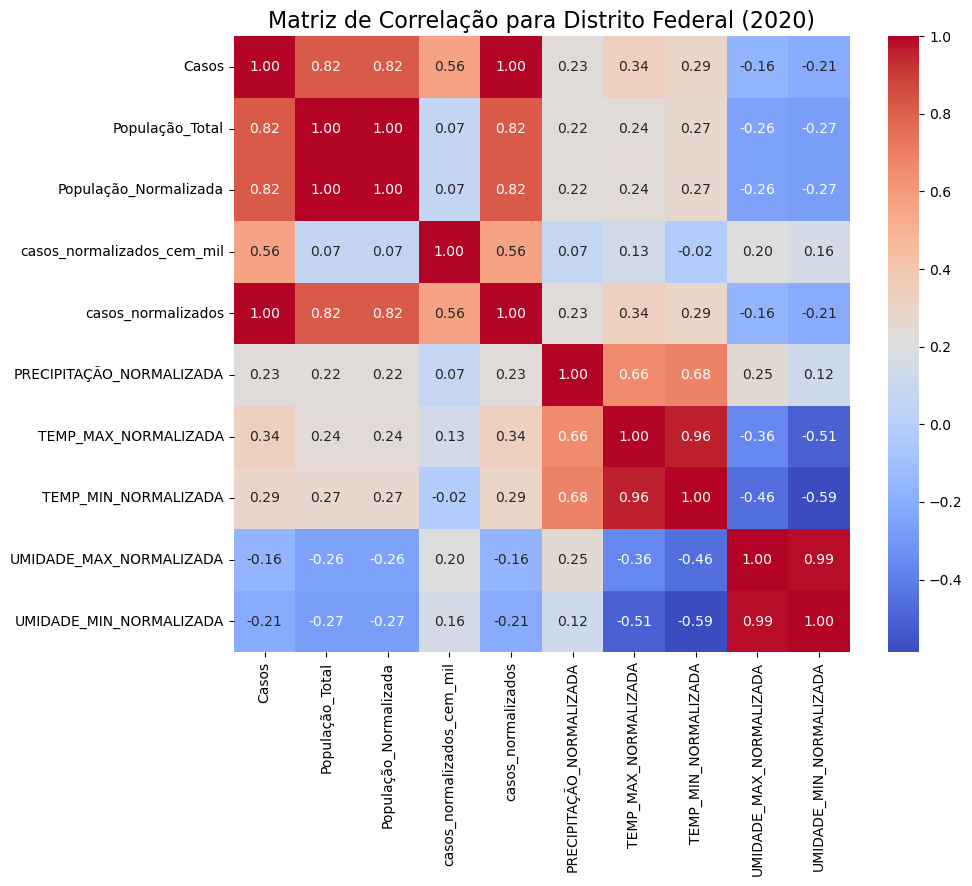

In [586]:
calcular_correlacao(df_df, "Distrito Federal", ano)

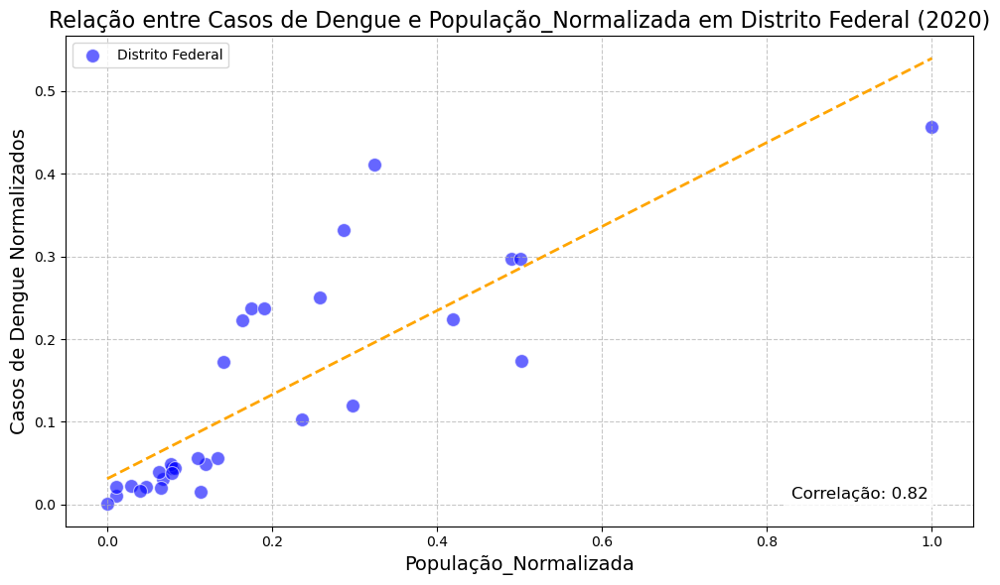

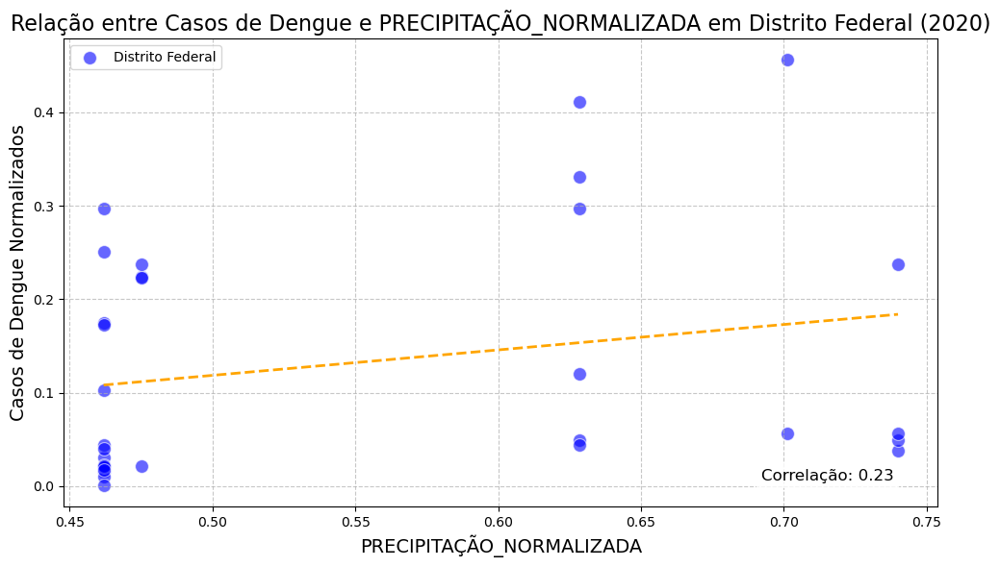

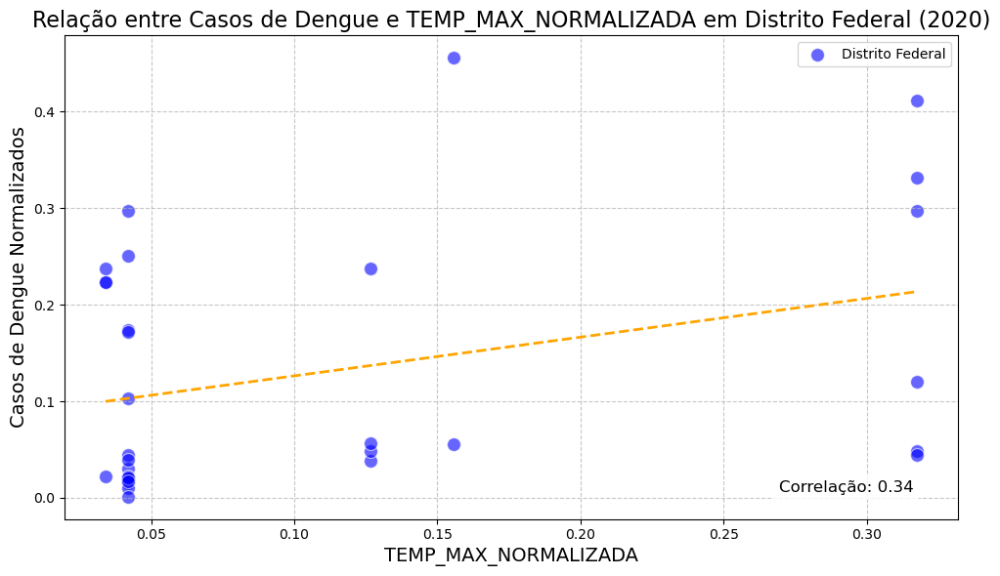

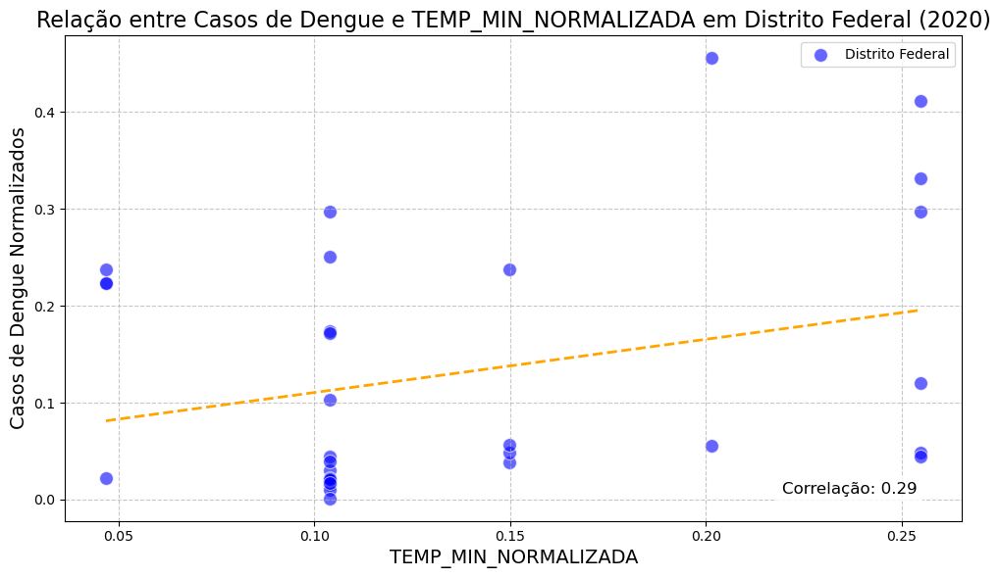

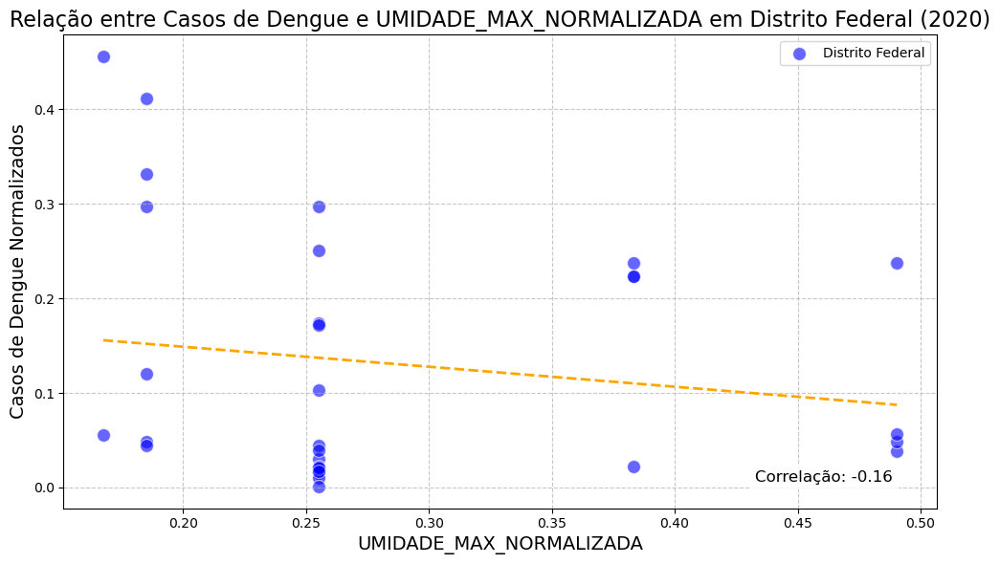

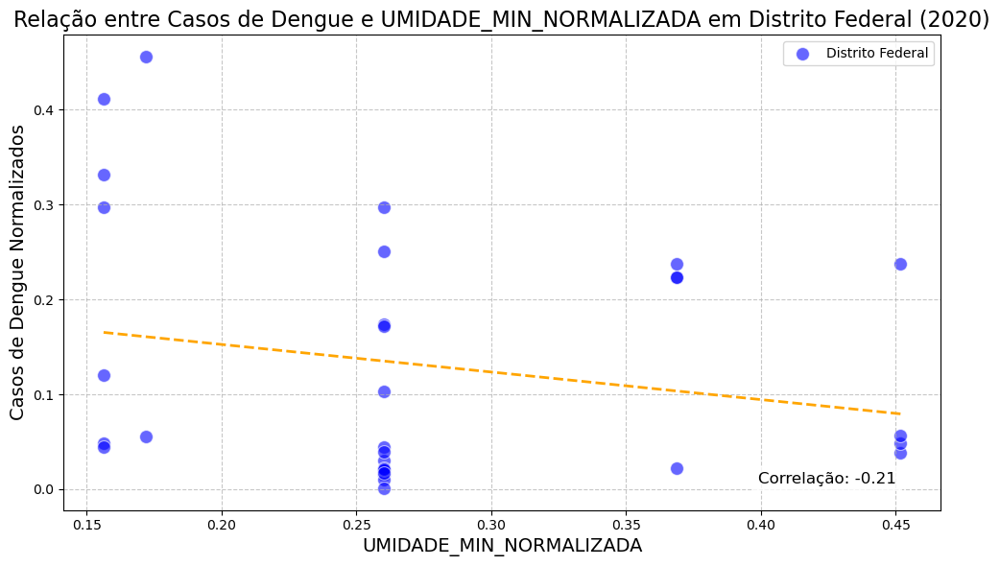

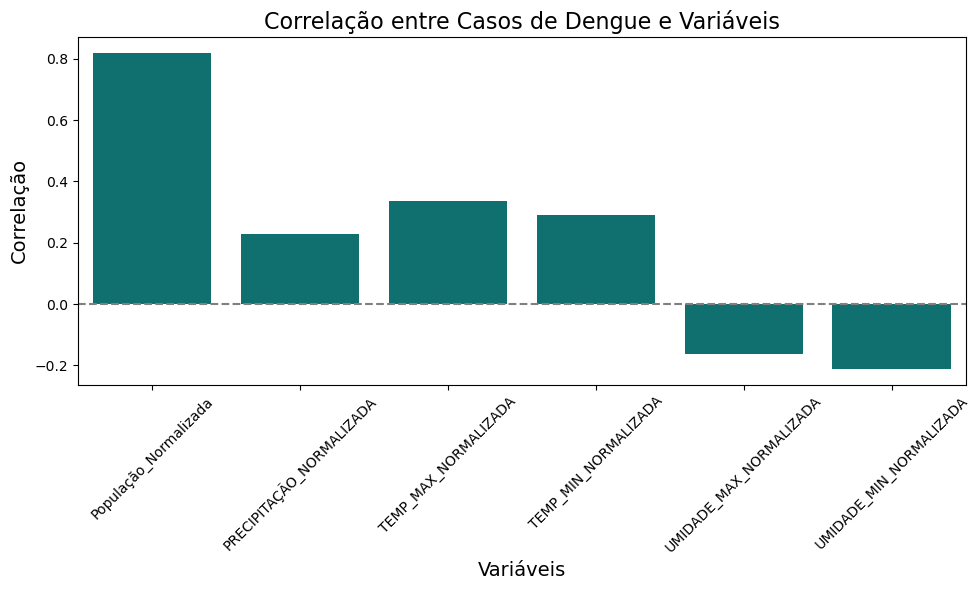

In [587]:
gerar_graficos(df_df, features, ano, 'Distrito Federal')

## **Rio de Janeiro(RJ)**

In [588]:
analise_descritiva(df_rio, "Rio de Janeiro", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados_cem_mil,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000
mean,65.000000,12329125.000000,0.300000,0.460000,0.010000,0.530000,0.770000,0.820000,0.860000,0.880000
std,83.500000,10204244.450000,0.250000,0.450000,0.010000,0.320000,0.160000,0.140000,0.140000,0.130000
min,5.000000,3098600.000000,0.070000,0.160000,0.000000,0.310000,0.620000,0.670000,0.670000,0.700000
25%,14.750000,4401200.000000,0.100000,0.190000,0.000000,0.330000,0.690000,0.740000,0.810000,0.840000
50%,34.000000,10789400.000000,0.260000,0.290000,0.000000,0.410000,0.730000,0.800000,0.890000,0.910000
75%,84.250000,18717325.000000,0.460000,0.560000,0.010000,0.620000,0.820000,0.880000,0.950000,0.950000
max,187.000000,24639100.000000,0.600000,1.120000,0.020000,1.000000,1.000000,1.000000,1.000000,1.000000


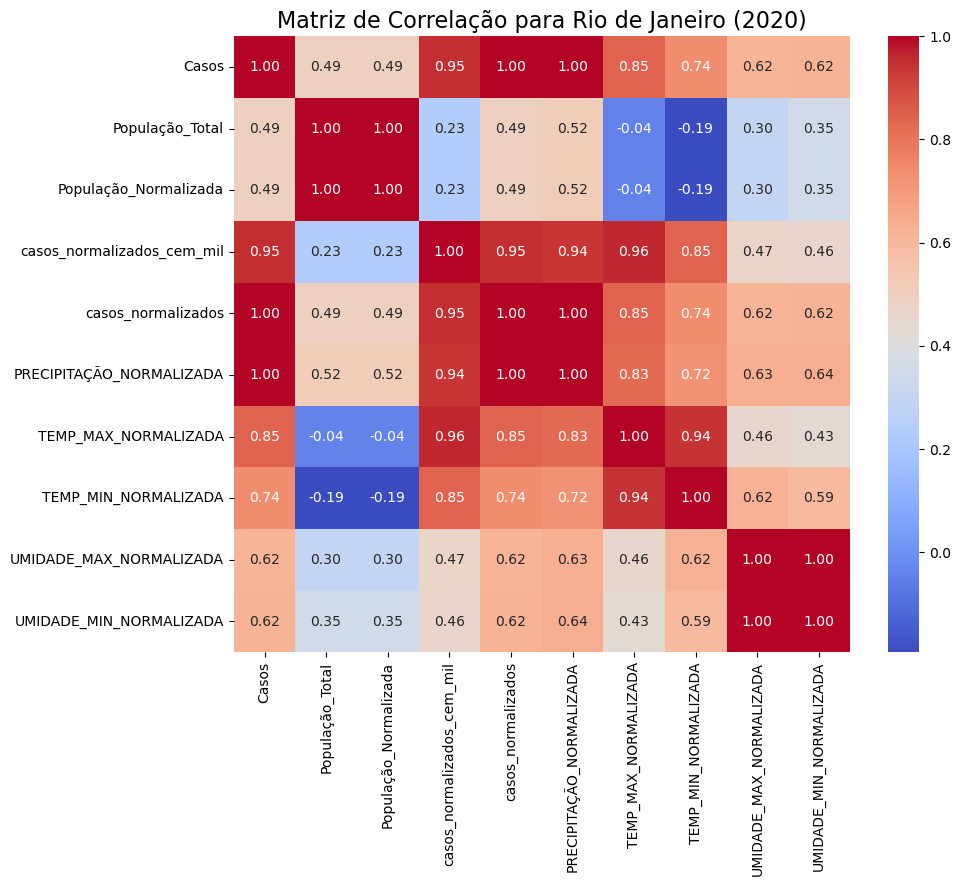

In [589]:
calcular_correlacao(df_rio, "Rio de Janeiro", ano)

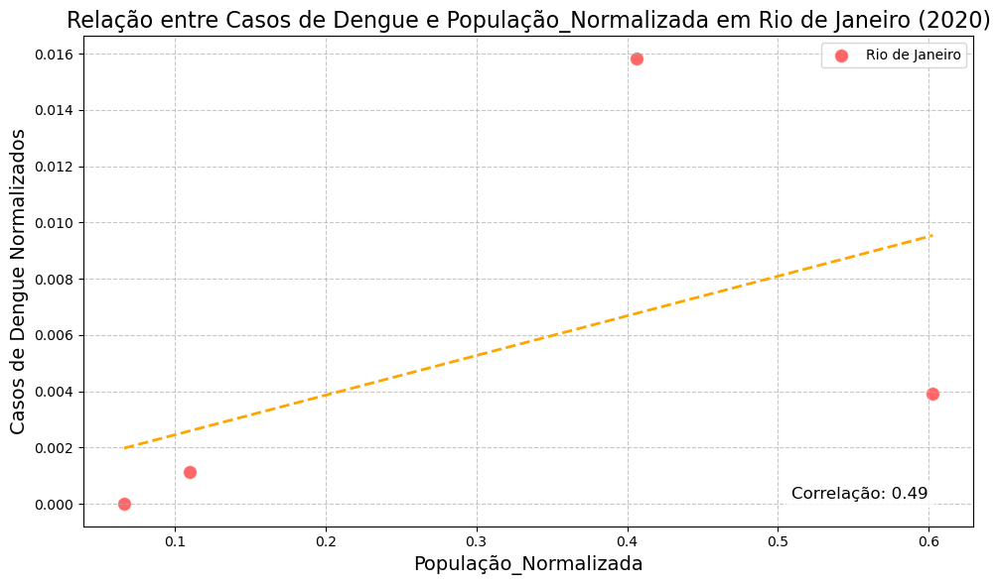

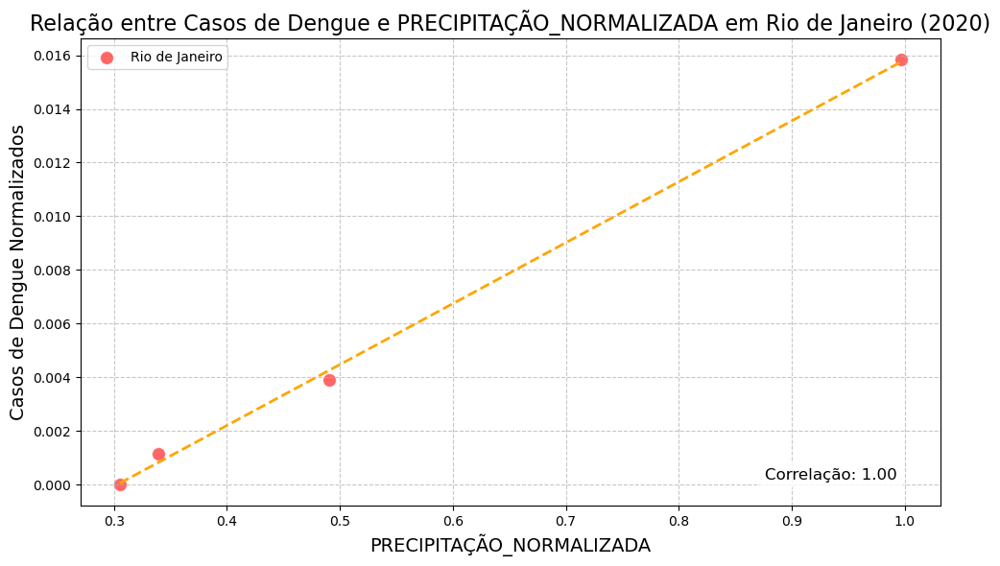

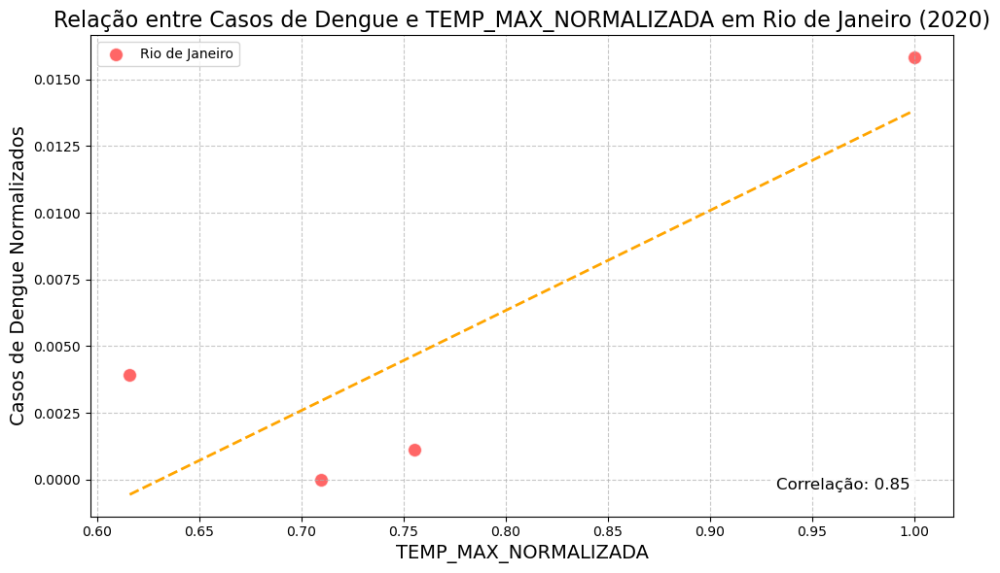

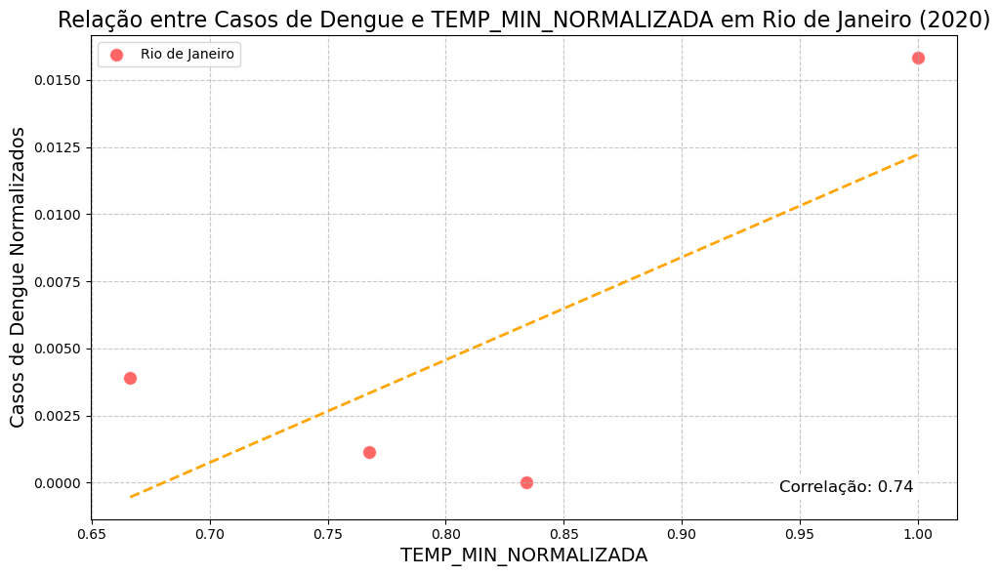

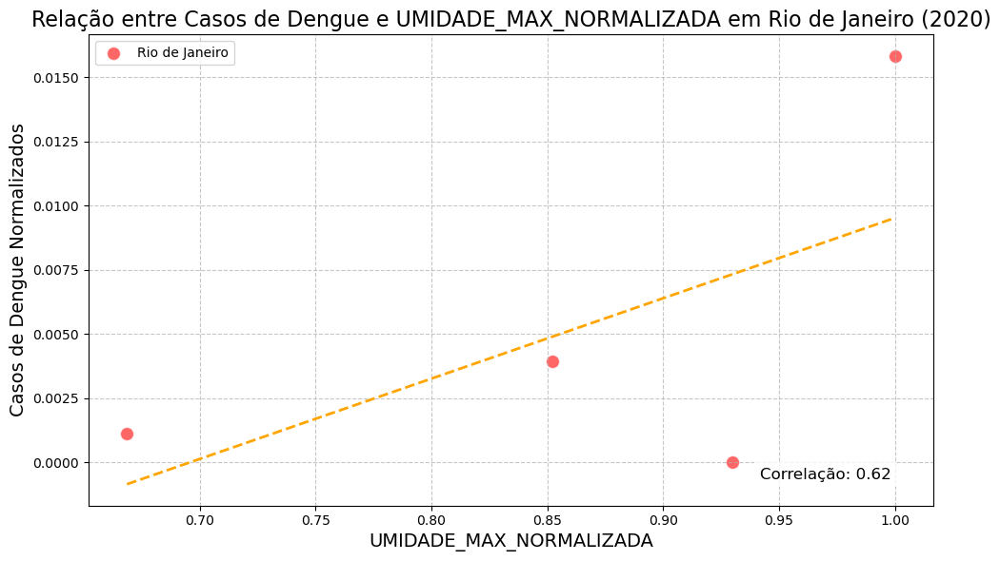

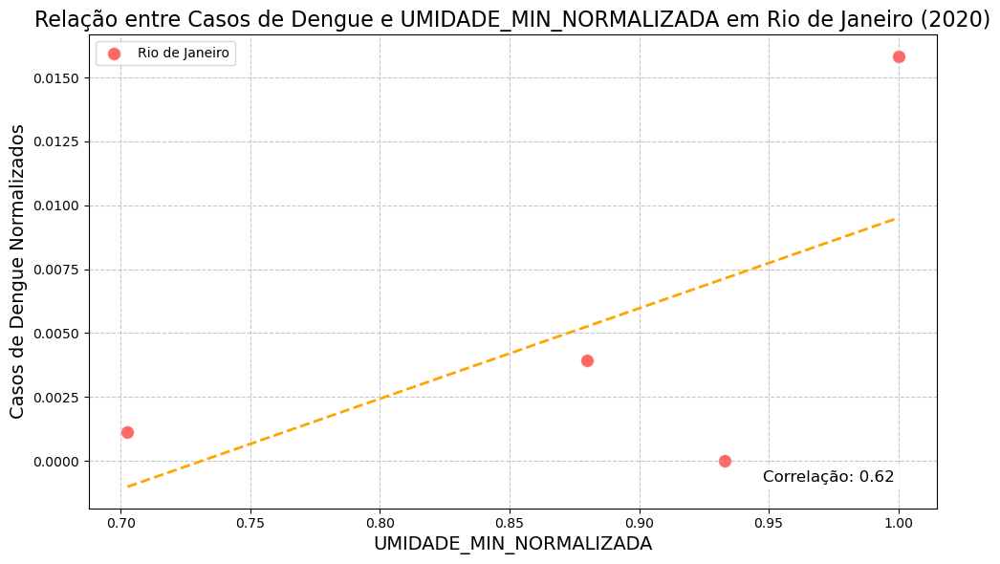

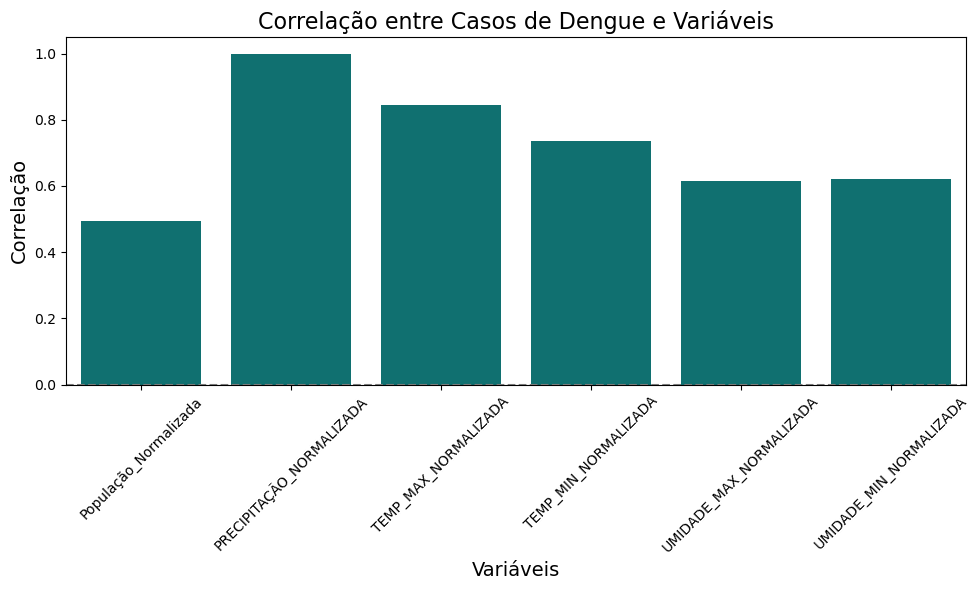

In [590]:
gerar_graficos(df_rio, features, ano, 'Rio de Janeiro')

## **Rio de Janeiro(RJ) e Distrito Federal(DF)**

In [591]:
analise_descritiva(df_relevante, "Rio de Janeiro(RJ) e Distrito Federal(DF)", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados_cem_mil,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000
mean,1349.540000,8804762.860000,0.210000,15.550000,0.120000,0.550000,0.190000,0.220000,0.350000,0.340000
std,1485.310000,8588302.350000,0.210000,10.790000,0.130000,0.140000,0.240000,0.230000,0.210000,0.220000
min,5.000000,435600.000000,0.000000,0.160000,0.000000,0.310000,0.030000,0.050000,0.170000,0.160000
25%,244.000000,3125000.000000,0.070000,10.390000,0.020000,0.460000,0.040000,0.100000,0.260000,0.260000
50%,568.000000,5208900.000000,0.120000,13.590000,0.050000,0.480000,0.040000,0.100000,0.260000,0.260000
75%,2573.500000,12165300.000000,0.290000,16.830000,0.220000,0.630000,0.320000,0.250000,0.380000,0.370000
max,5249.000000,40593200.000000,1.000000,36.690000,0.460000,1.000000,1.000000,1.000000,1.000000,1.000000


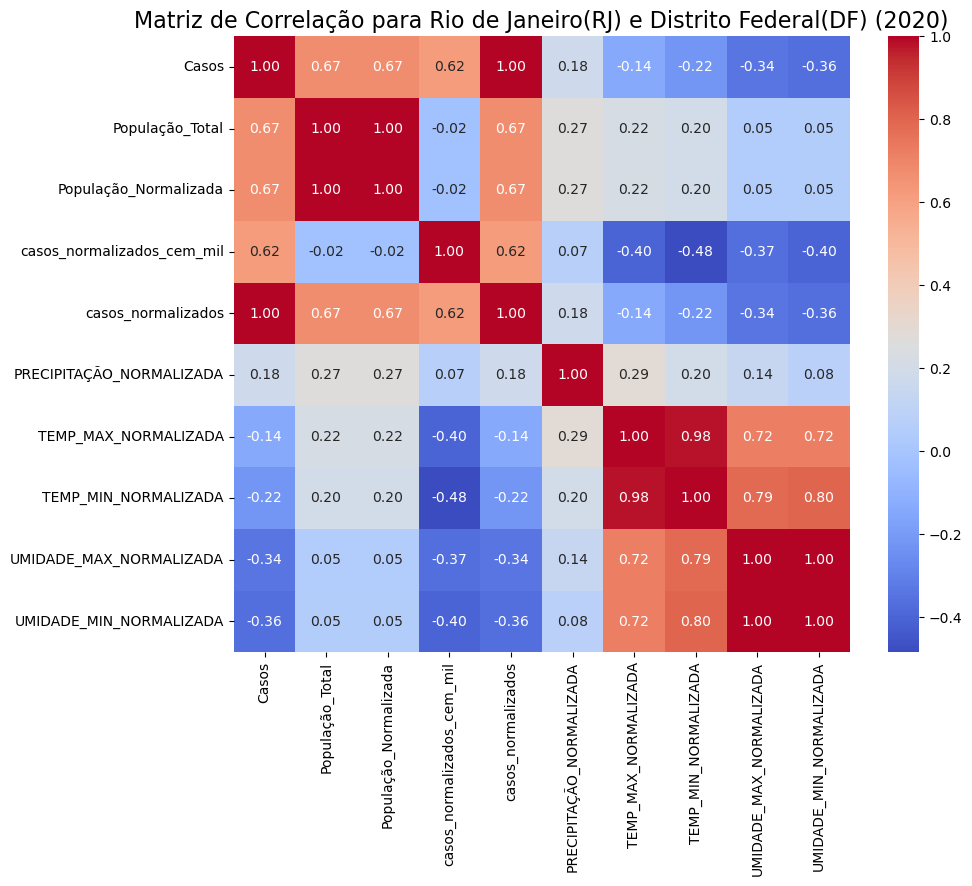

In [592]:
calcular_correlacao(df_relevante, "Rio de Janeiro(RJ) e Distrito Federal(DF)", ano)

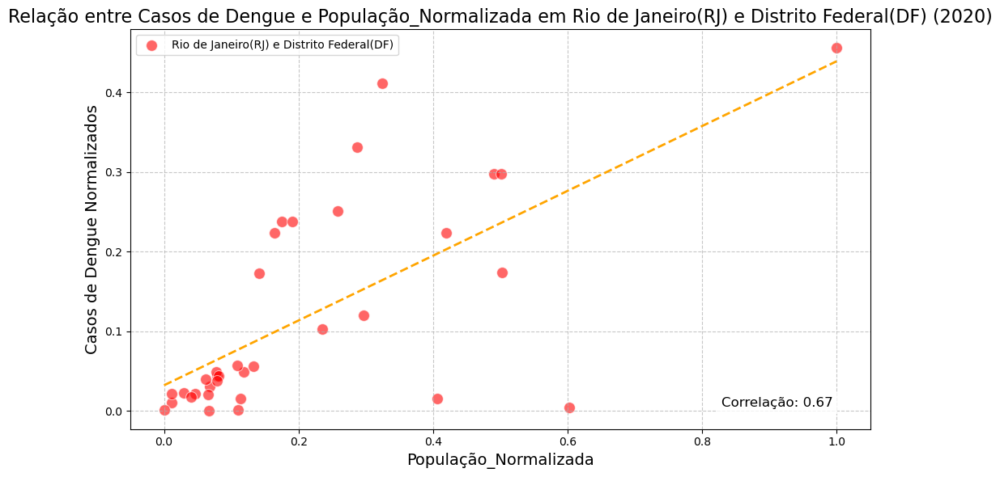

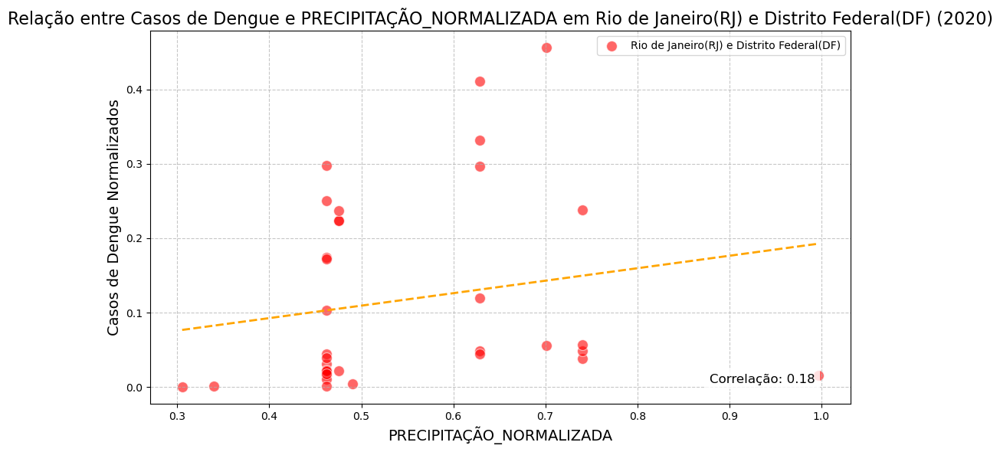

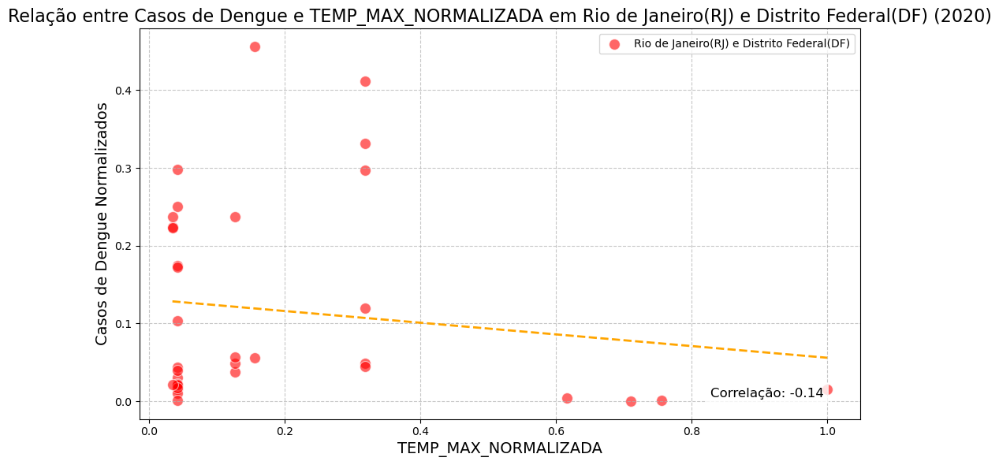

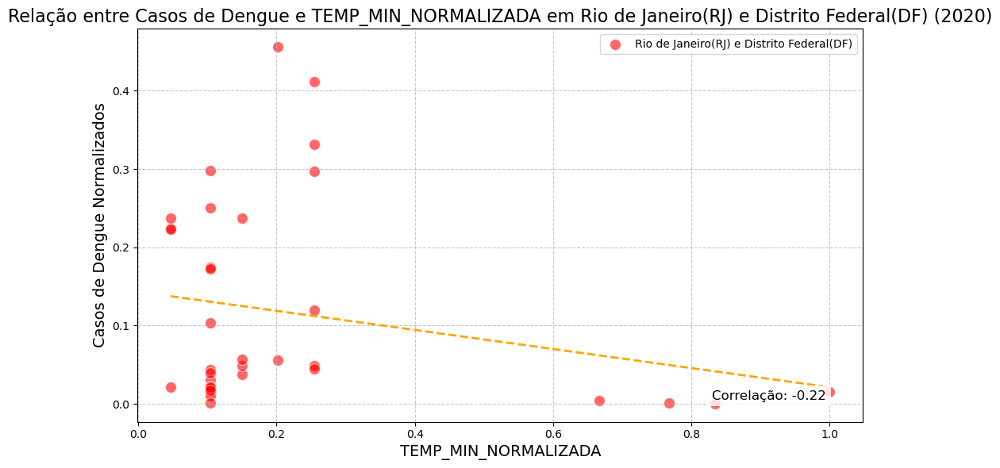

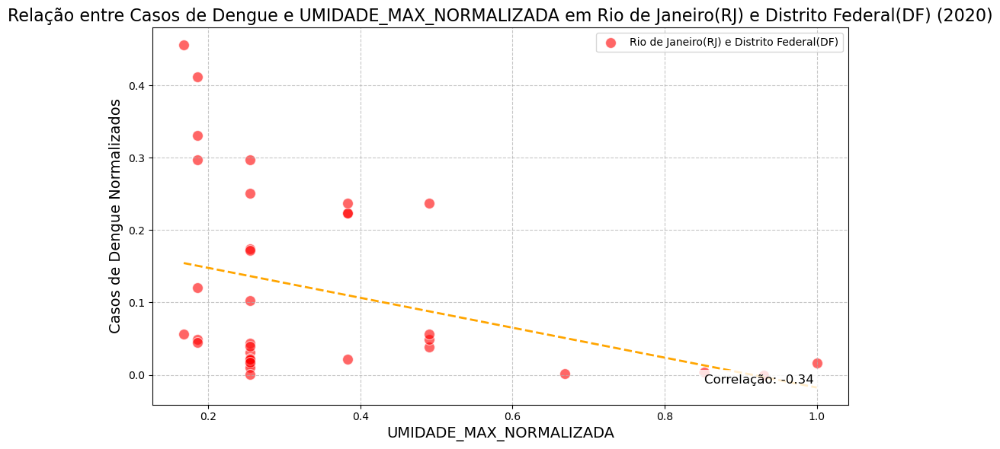

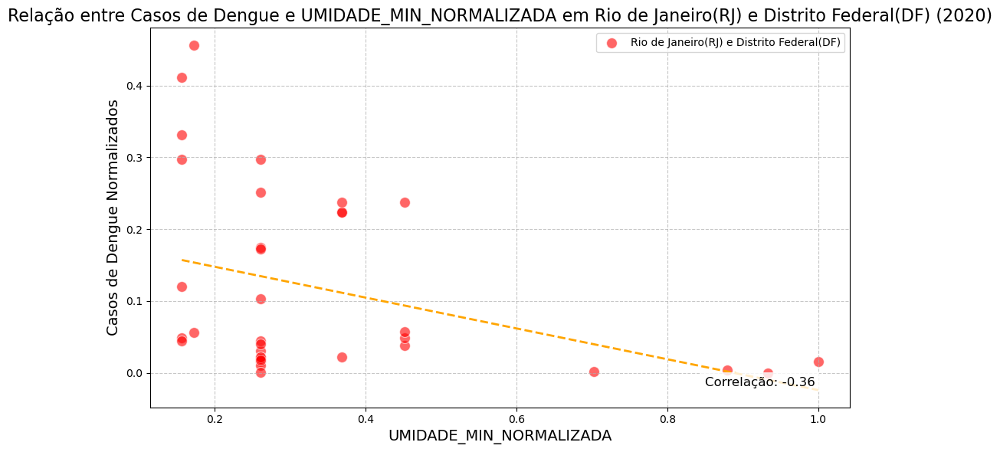

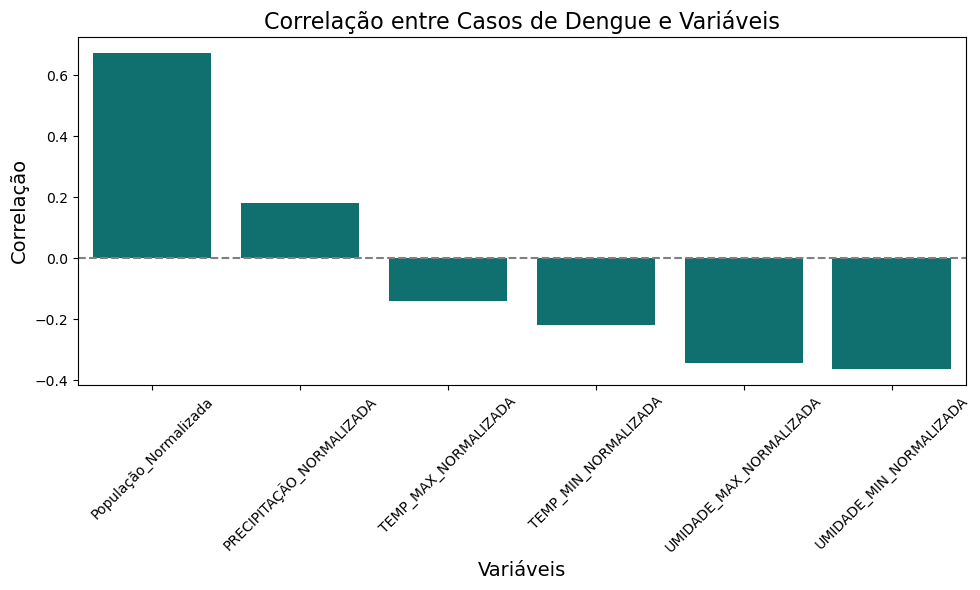

In [593]:
gerar_graficos(df_relevante, features, ano, 'Rio de Janeiro(RJ) e Distrito Federal(DF)')

# **Análise Estátistica de 2021**

In [594]:
    file_path_resultados = f'tabela_saude_com_normalizacao_2021.csv'
    df = pd.read_csv(file_path_resultados)
    ano = '2021'

    df_relevante = df.drop(columns=['COD_CIDADE', 'COD_REG'])

    df_relevante.columns = df_relevante.columns.str.replace(' ', '_').str.replace('á', 'a').str.replace('é', 'e').str.replace('í', 'i').str.replace('ó', 'o').str.replace('ú', 'u')

     # df_rio = df_relevante.iloc[-4:].copy()  # Últimos 4 registros para Rio de Janeiro
    # df_df = df_relevante.iloc[:-4].copy()   # Todos os registros menos os últimos 4

    df_rio = df_relevante.iloc[-4:].copy()  # Últimos 2 registros para Rio de Janeiro
    df_df = df_relevante.iloc[:-4].copy()   # Todos os registros menos os últimos 2

    features = [
        'População_Normalizada',
        'PRECIPITAÇÃO_NORMALIZADA', 
        'TEMP_MAX_NORMALIZADA',
        'TEMP_MIN_NORMALIZADA', 
        'UMIDADE_MAX_NORMALIZADA',
        'UMIDADE_MIN_NORMALIZADA'
    ]

## **Distrito Federal(DF)**

In [595]:
analise_descritiva(df_df, "Distrito Federal", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados_cem_mil,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000
mean,523.610000,8350006.450000,0.200000,6.210000,0.050000,0.560000,0.090000,0.100000,0.200000,0.180000
std,695.890000,8444581.370000,0.210000,5.320000,0.060000,0.120000,0.110000,0.080000,0.080000,0.070000
min,12.000000,435600.000000,0.000000,1.810000,0.000000,0.400000,0.000000,0.000000,0.080000,0.080000
25%,100.500000,3110050.000000,0.070000,2.940000,0.010000,0.410000,0.010000,0.060000,0.150000,0.140000
50%,244.000000,5208900.000000,0.120000,4.040000,0.020000,0.660000,0.010000,0.060000,0.200000,0.190000
75%,655.000000,11376900.000000,0.270000,7.530000,0.060000,0.660000,0.160000,0.180000,0.240000,0.230000
max,3395.000000,40593200.000000,1.000000,22.960000,0.290000,0.670000,0.280000,0.210000,0.330000,0.300000


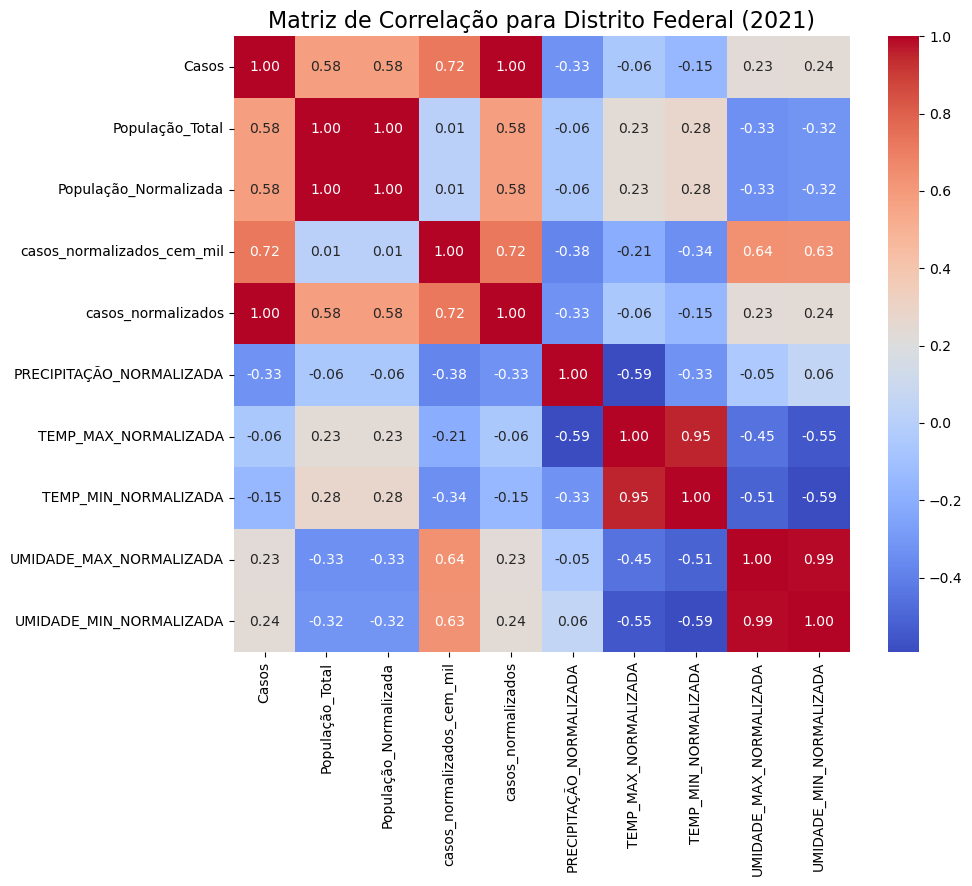

In [596]:
calcular_correlacao(df_df, "Distrito Federal", ano)

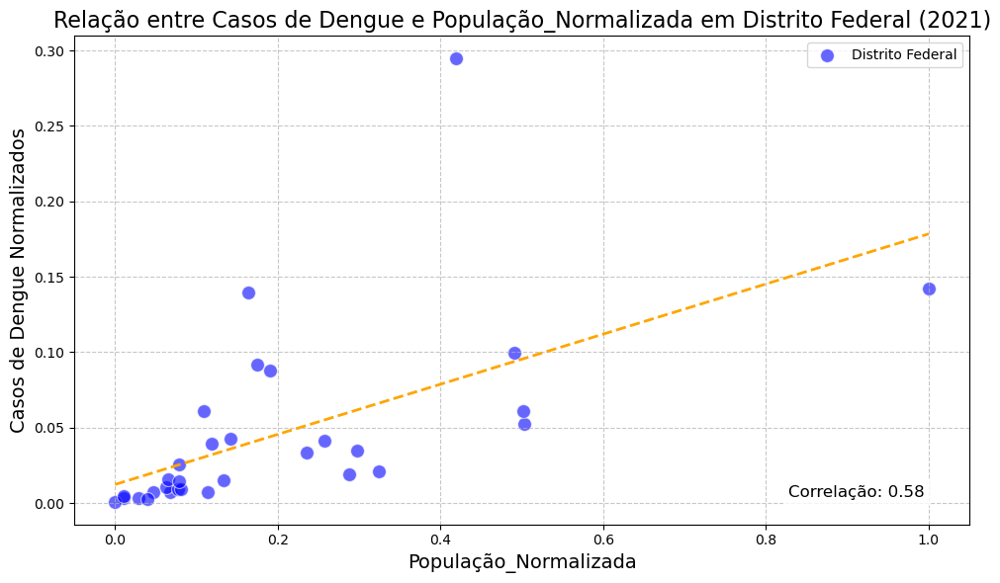

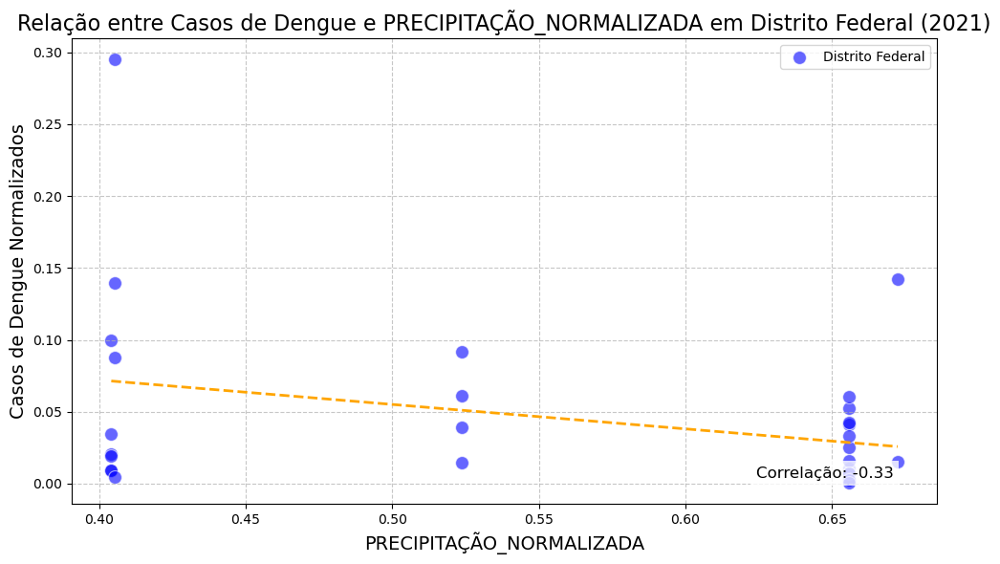

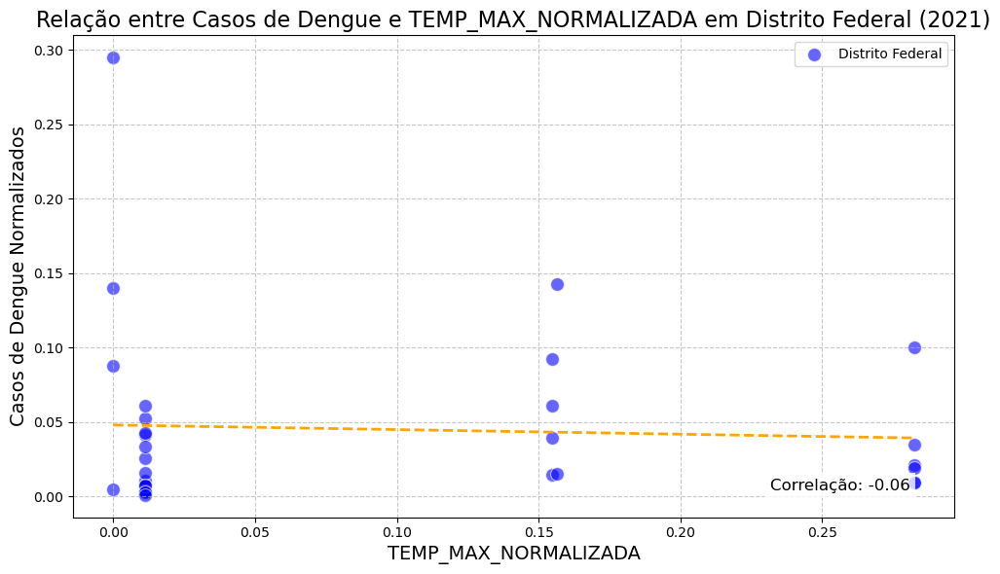

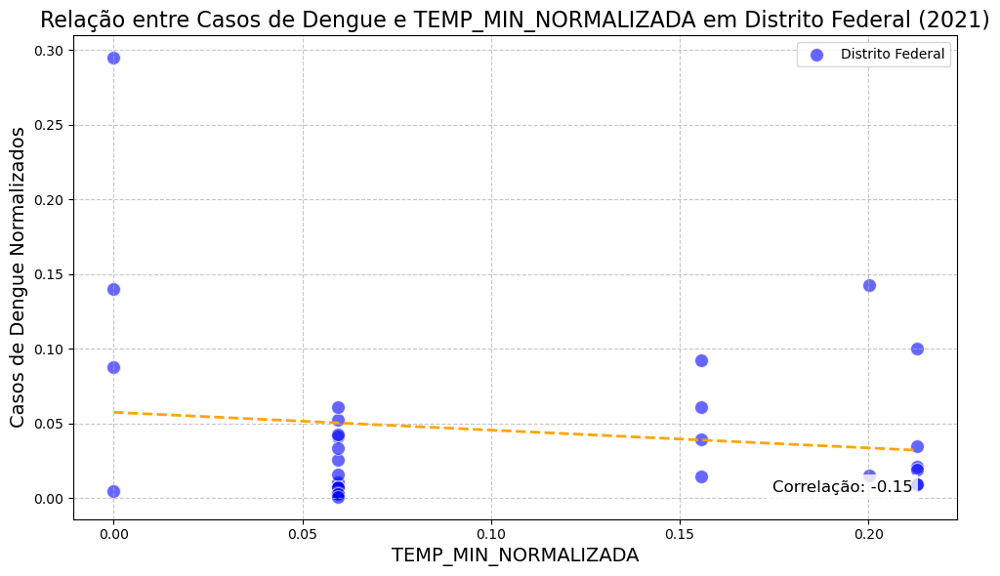

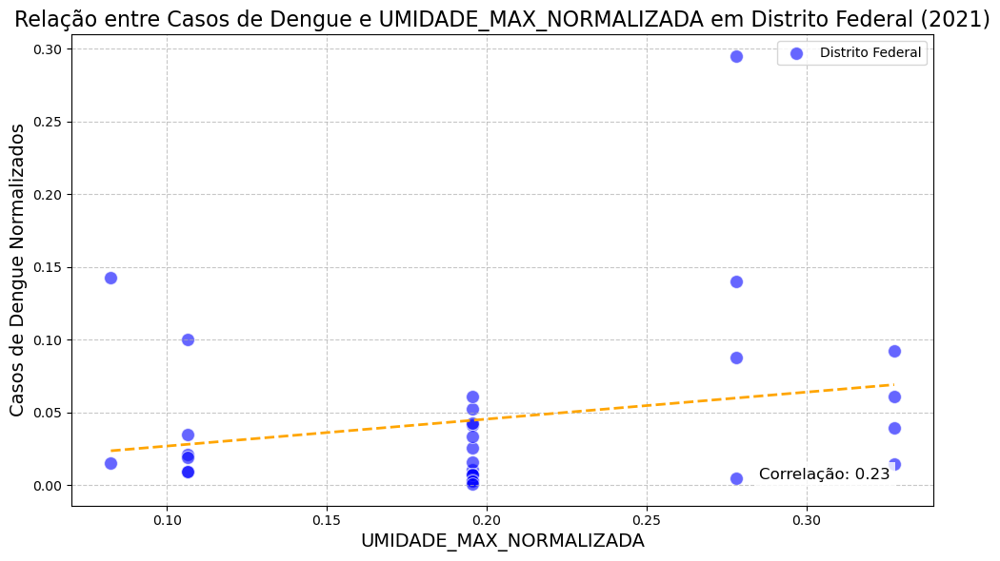

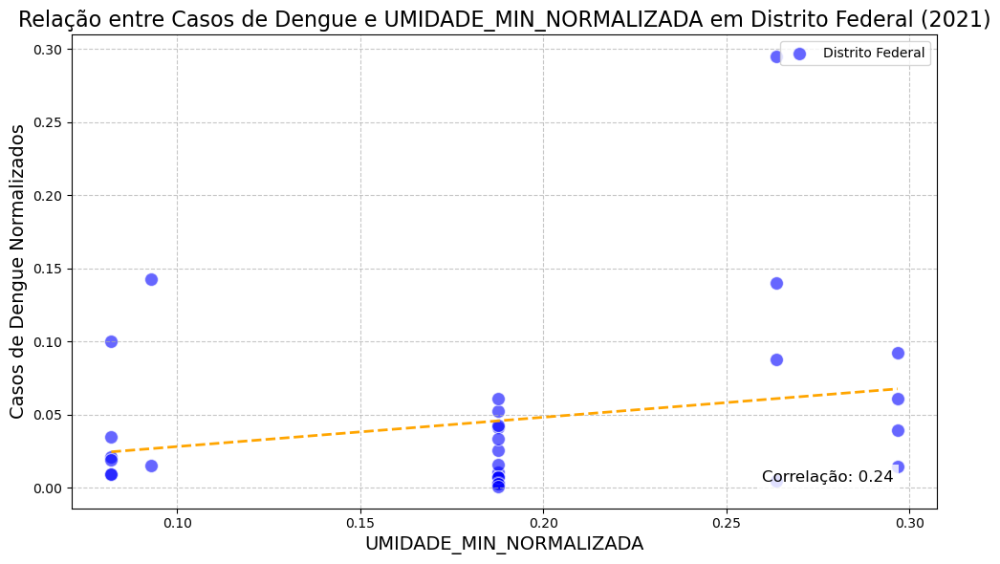

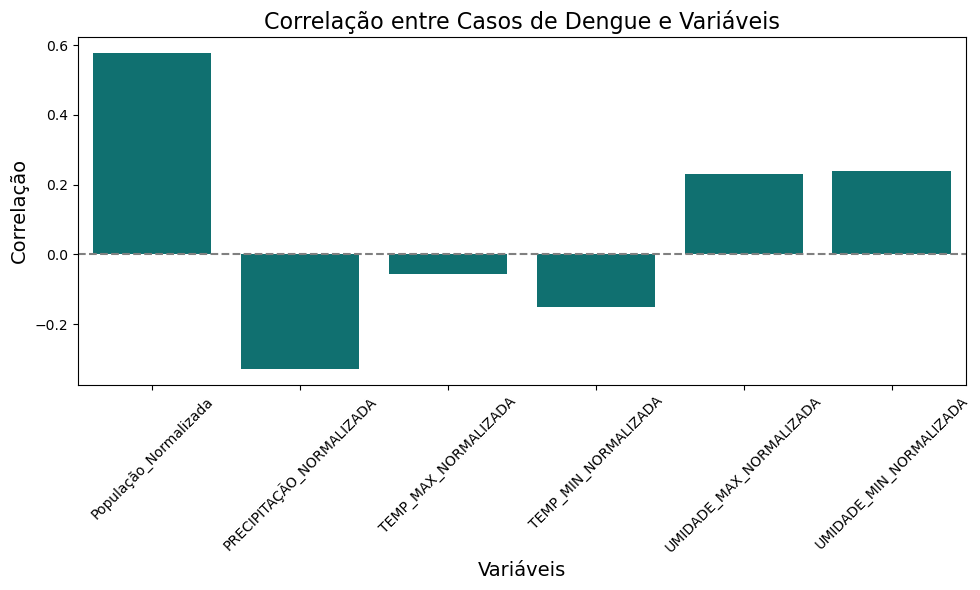

In [597]:
gerar_graficos(df_df, features, ano, 'Distrito Federal')

## **Rio de Janeiro(RJ)**

In [598]:
analise_descritiva(df_rio, "Rio de Janeiro", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados_cem_mil,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000
mean,73.750000,12329125.000000,0.300000,0.840000,0.010000,0.330000,0.600000,0.650000,0.790000,0.790000
std,40.750000,10204244.450000,0.250000,0.750000,0.000000,0.120000,0.080000,0.020000,0.080000,0.080000
min,14.000000,3098600.000000,0.070000,0.340000,0.000000,0.190000,0.500000,0.620000,0.680000,0.710000
25%,65.750000,4401200.000000,0.100000,0.420000,0.010000,0.270000,0.560000,0.640000,0.760000,0.750000
50%,88.500000,10789400.000000,0.260000,0.540000,0.010000,0.330000,0.610000,0.650000,0.810000,0.780000
75%,96.500000,18717325.000000,0.460000,0.950000,0.010000,0.390000,0.640000,0.660000,0.850000,0.820000
max,104.000000,24639100.000000,0.600000,1.940000,0.010000,0.470000,0.680000,0.680000,0.860000,0.890000


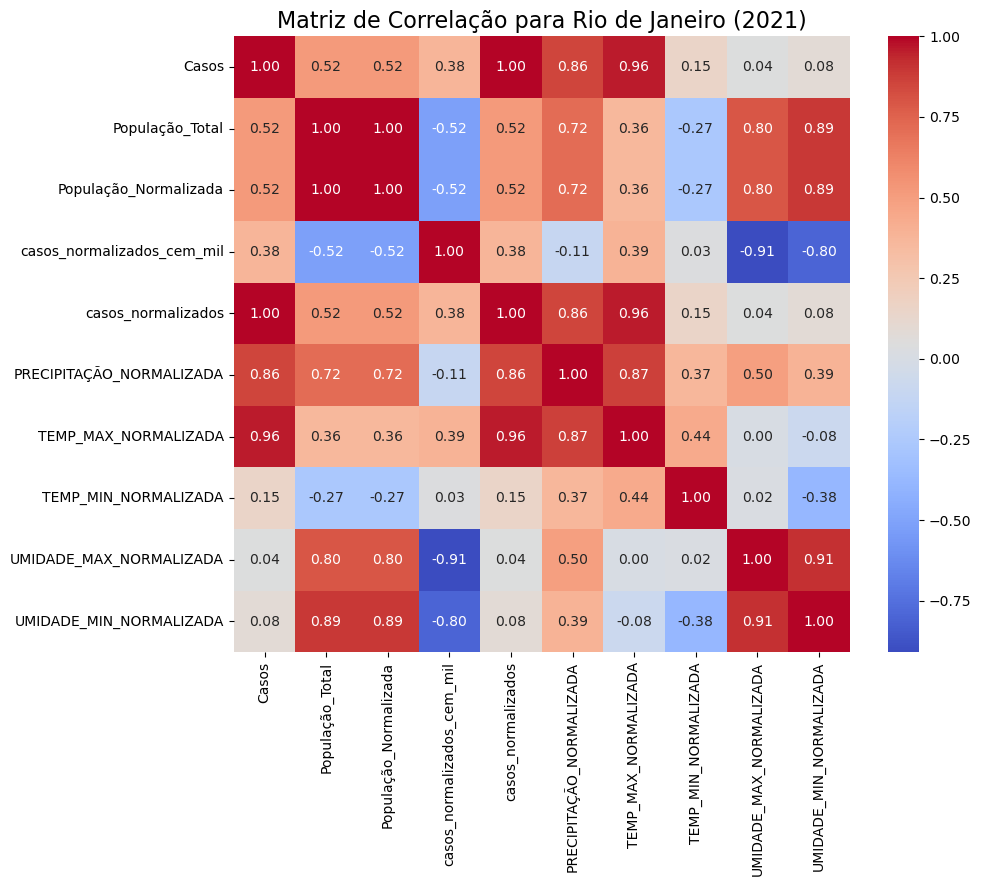

In [599]:
calcular_correlacao(df_rio, "Rio de Janeiro", ano)

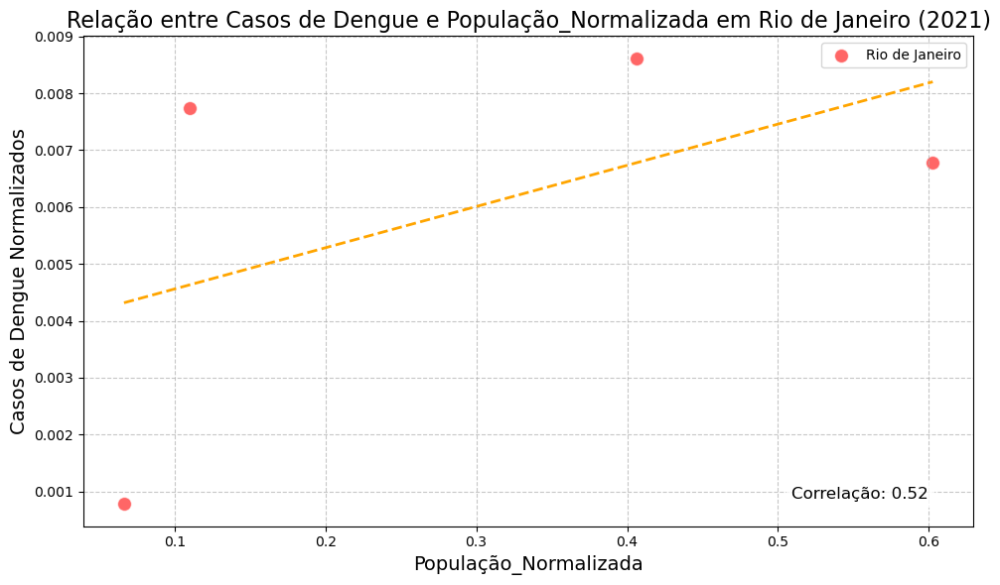

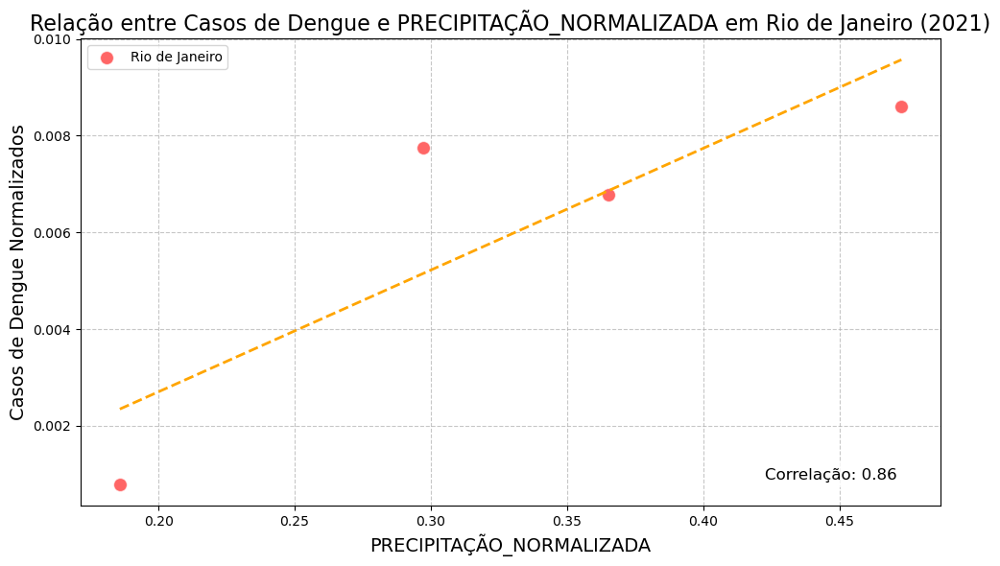

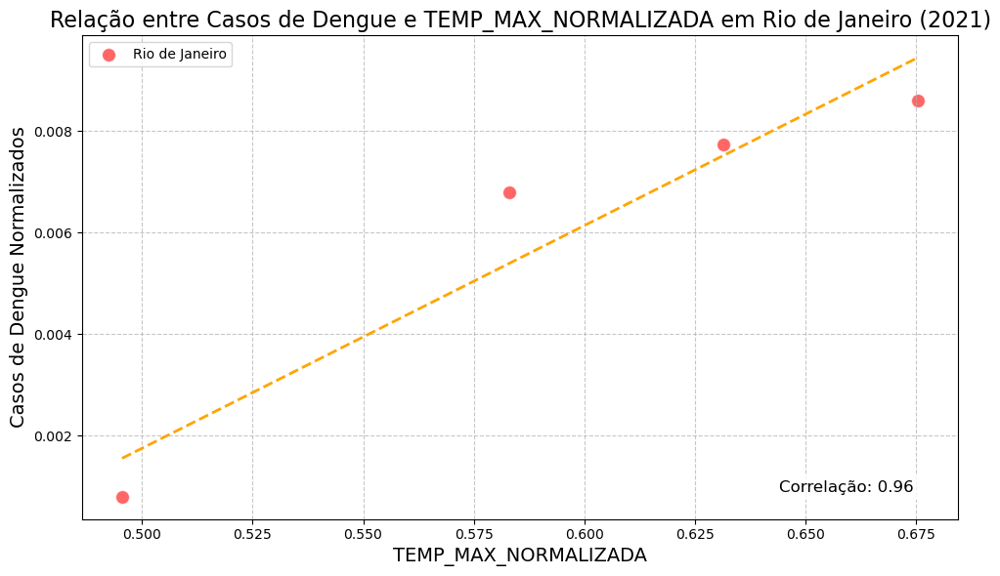

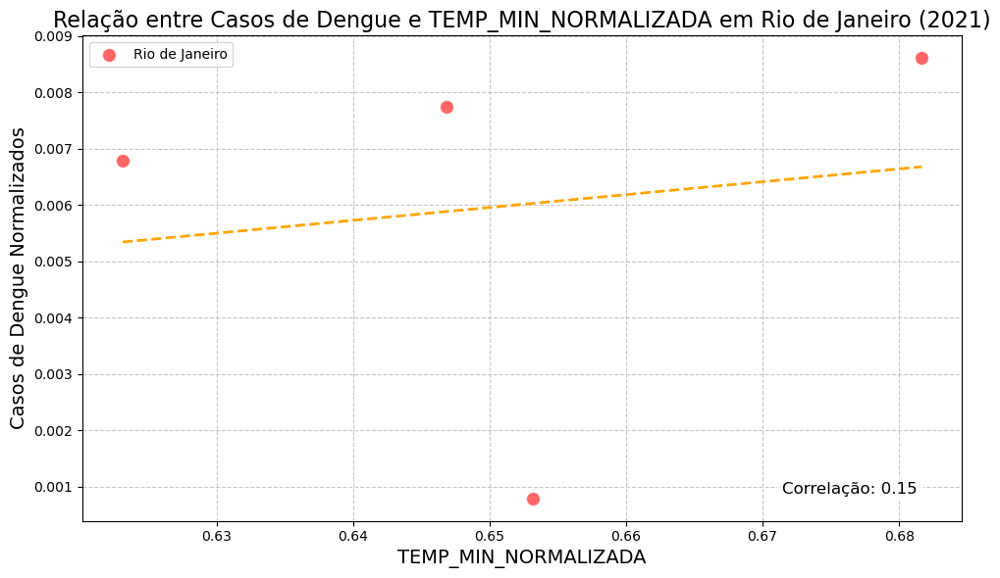

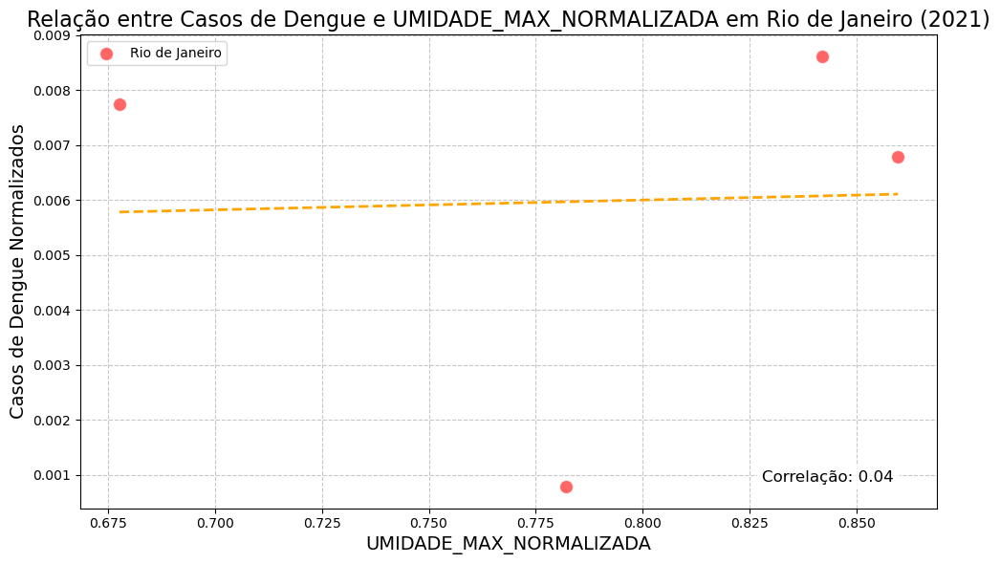

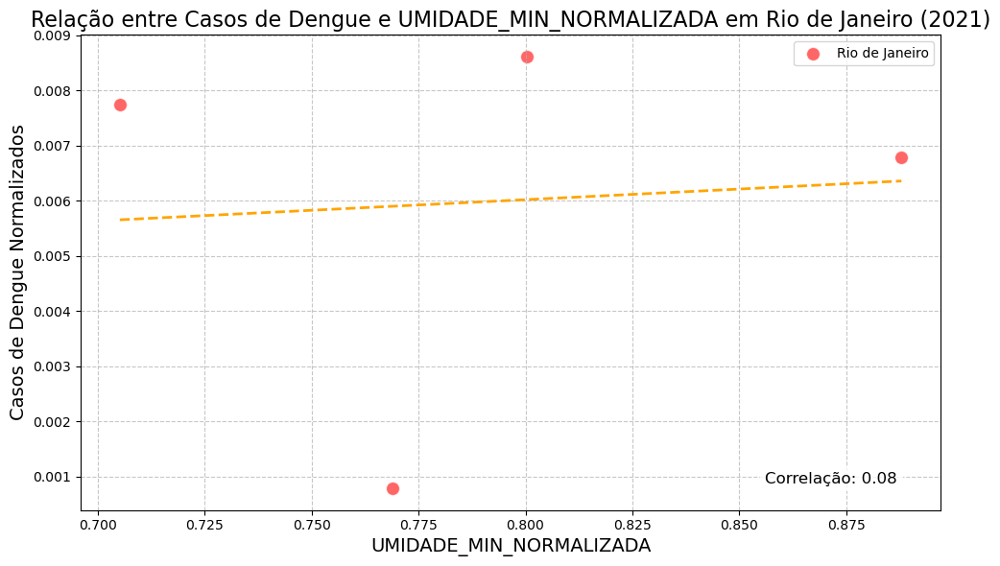

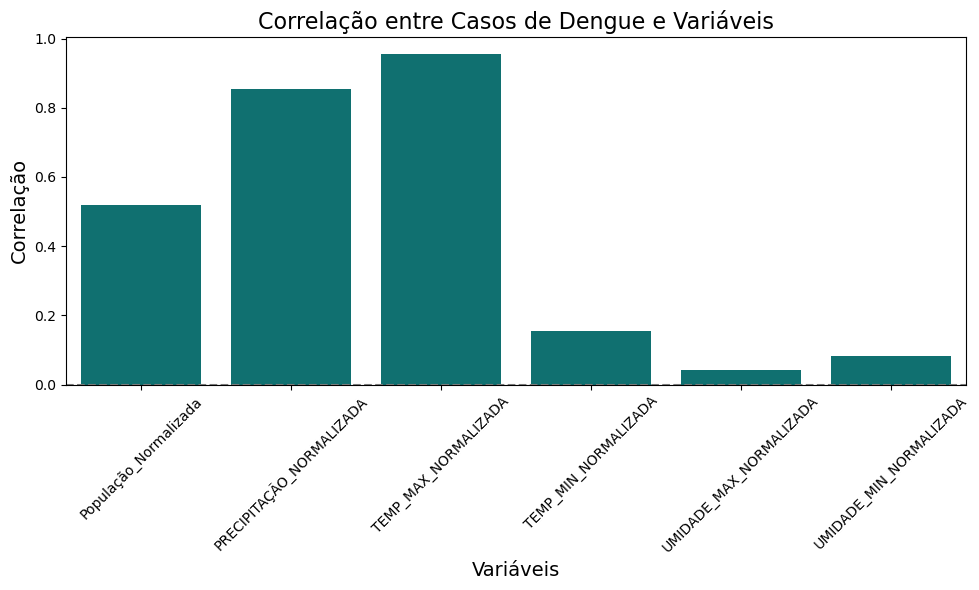

In [600]:
gerar_graficos(df_rio, features, ano, 'Rio de Janeiro')

## **Rio de Janeiro(RJ) e Distrito Federal(DF)**

In [601]:
analise_descritiva(df_relevante, "Rio de Janeiro(RJ) e Distrito Federal(DF)", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados_cem_mil,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000
mean,472.200000,8804762.860000,0.210000,5.600000,0.040000,0.530000,0.150000,0.170000,0.270000,0.250000
std,669.720000,8588302.350000,0.210000,5.290000,0.060000,0.140000,0.200000,0.190000,0.210000,0.210000
min,12.000000,435600.000000,0.000000,0.340000,0.000000,0.190000,0.000000,0.000000,0.080000,0.080000
25%,91.500000,3125000.000000,0.070000,2.720000,0.010000,0.400000,0.010000,0.060000,0.200000,0.190000
50%,188.000000,5208900.000000,0.120000,3.800000,0.020000,0.520000,0.010000,0.060000,0.200000,0.190000
75%,551.000000,12165300.000000,0.290000,6.540000,0.050000,0.660000,0.280000,0.210000,0.280000,0.260000
max,3395.000000,40593200.000000,1.000000,22.960000,0.290000,0.670000,0.680000,0.680000,0.860000,0.890000


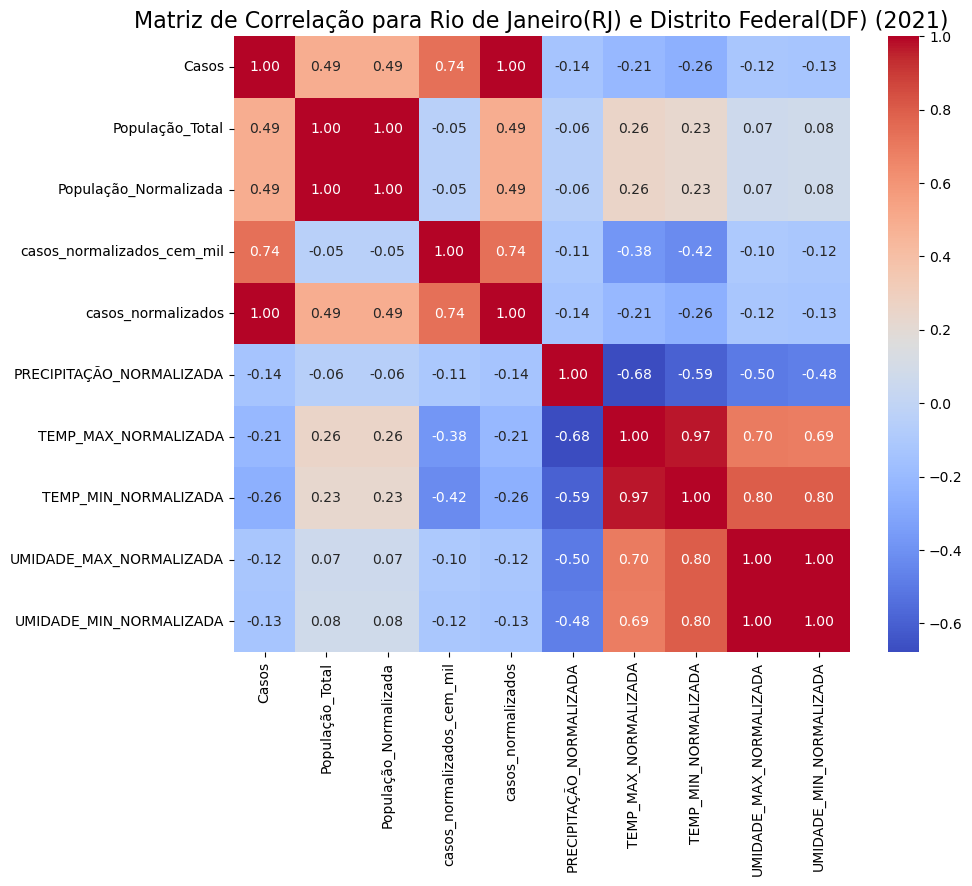

In [602]:
calcular_correlacao(df_relevante, "Rio de Janeiro(RJ) e Distrito Federal(DF)", ano)

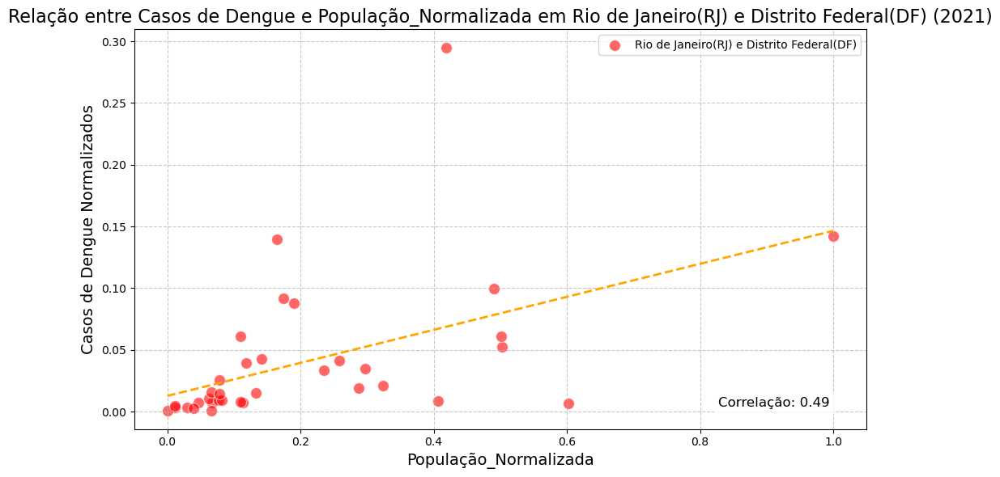

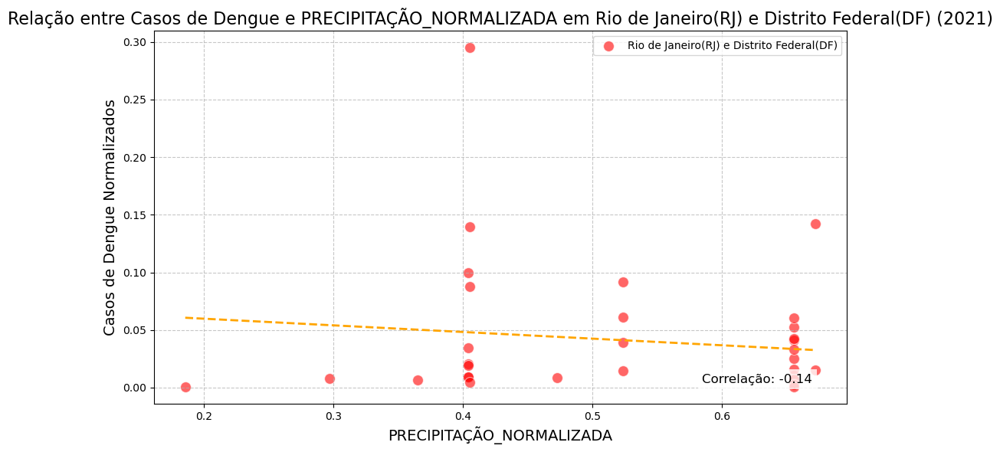

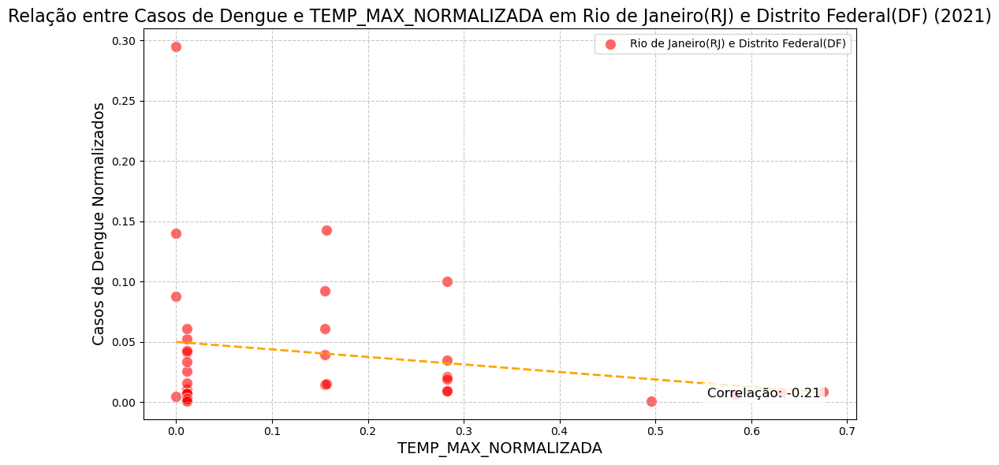

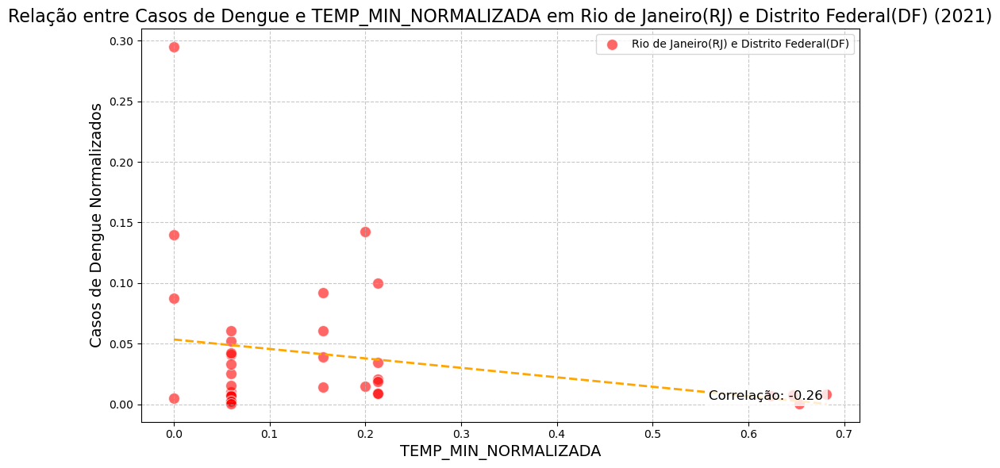

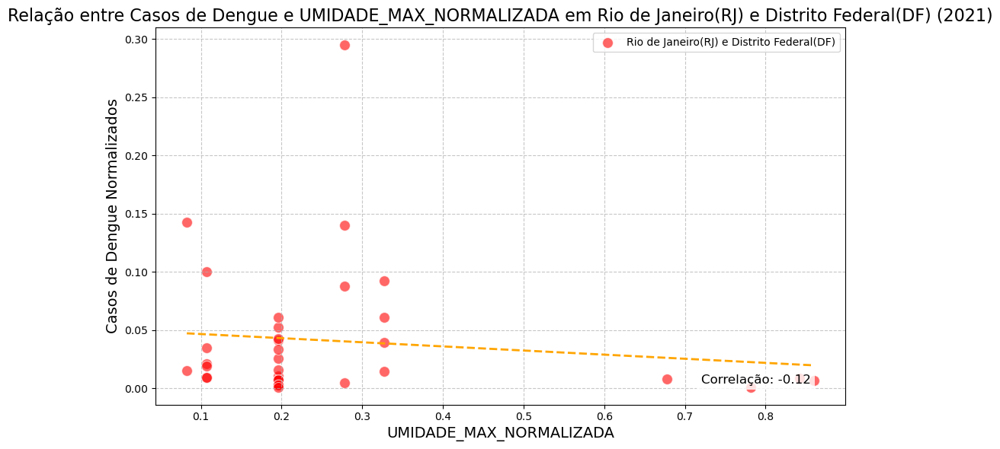

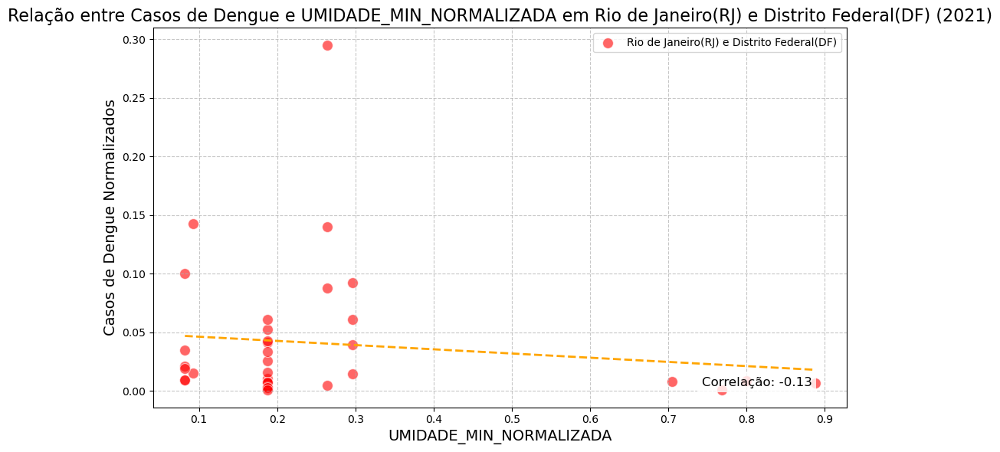

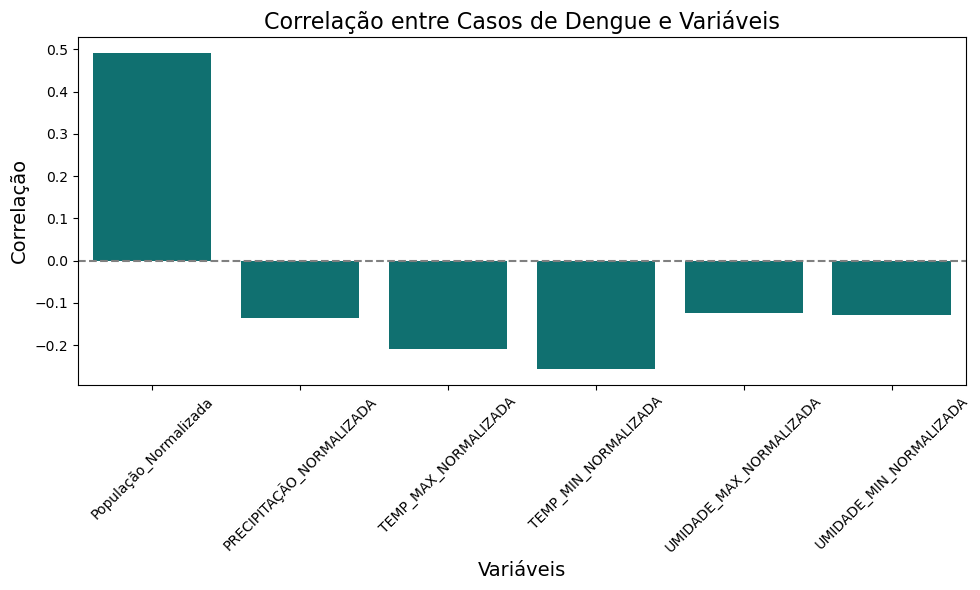

In [603]:
gerar_graficos(df_relevante, features, ano, 'Rio de Janeiro(RJ) e Distrito Federal(DF)')

# **Análise Estátistica de 2022**

In [604]:
    file_path_resultados = f'tabela_saude_com_normalizacao_2022.csv'
    df = pd.read_csv(file_path_resultados)
    ano = '2022'

    df_relevante = df.drop(columns=['COD_CIDADE', 'COD_REG'])

    df_relevante.columns = df_relevante.columns.str.replace(' ', '_').str.replace('á', 'a').str.replace('é', 'e').str.replace('í', 'i').str.replace('ó', 'o').str.replace('ú', 'u')

    # df_rio = df_relevante.iloc[-4:].copy()  # Últimos 4 registros para Rio de Janeiro
    # df_df = df_relevante.iloc[:-4].copy()   # Todos os registros menos os últimos 4

    df_rio = df_relevante.iloc[-4:].copy()  # Últimos 2 registros para Rio de Janeiro
    df_df = df_relevante.iloc[:-4].copy()   # Todos os registros menos os últimos 2

    features = [
        'População_Normalizada',
        'PRECIPITAÇÃO_NORMALIZADA', 
        'TEMP_MAX_NORMALIZADA',
        'TEMP_MIN_NORMALIZADA', 
        'UMIDADE_MAX_NORMALIZADA',
        'UMIDADE_MIN_NORMALIZADA'
    ]

## **Distrito Federal(DF)**

In [605]:
analise_descritiva(df_df, "Distrito Federal", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados_cem_mil,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000
mean,1872.970000,8350006.450000,0.200000,20.750000,0.160000,0.350000,0.100000,0.100000,0.110000,0.110000
std,2355.210000,8444581.370000,0.210000,11.060000,0.200000,0.040000,0.110000,0.070000,0.080000,0.080000
min,11.000000,435600.000000,0.000000,2.530000,0.000000,0.250000,0.010000,0.000000,0.000000,0.000000
25%,516.000000,3110050.000000,0.070000,14.490000,0.040000,0.360000,0.020000,0.060000,0.060000,0.070000
50%,848.000000,5208900.000000,0.120000,18.280000,0.070000,0.370000,0.020000,0.060000,0.100000,0.110000
75%,2316.500000,11376900.000000,0.270000,26.790000,0.200000,0.370000,0.140000,0.160000,0.160000,0.150000
max,11499.000000,40593200.000000,1.000000,45.820000,1.000000,0.410000,0.300000,0.220000,0.250000,0.230000


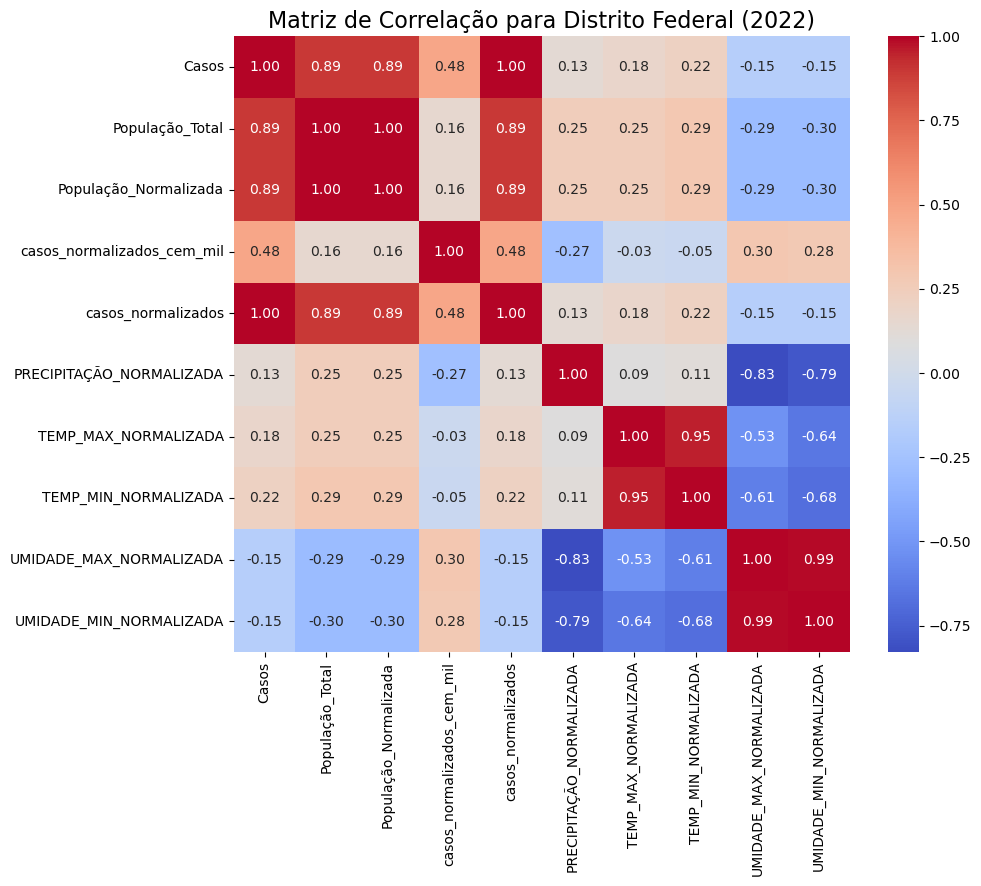

In [606]:
calcular_correlacao(df_df, "Distrito Federal", ano)

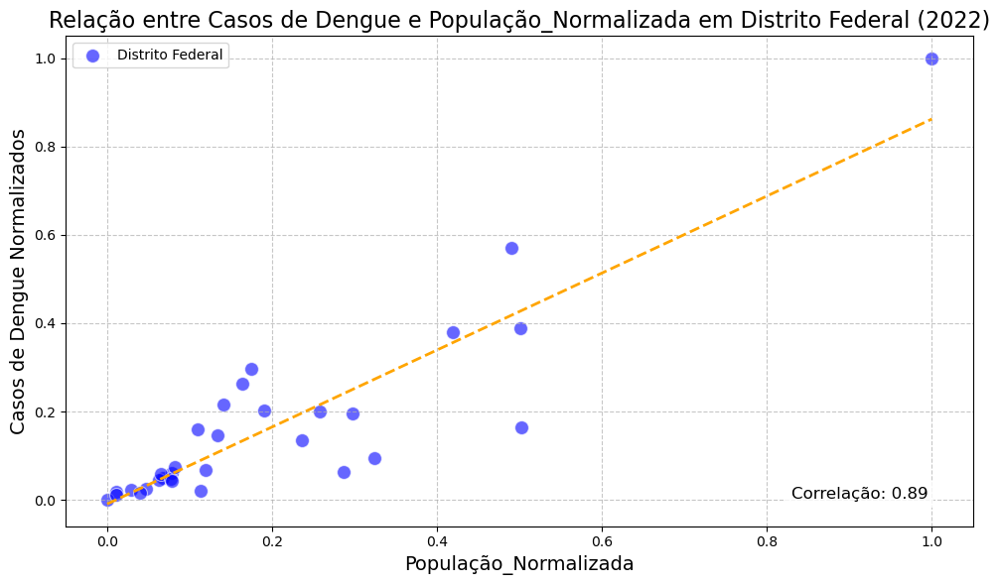

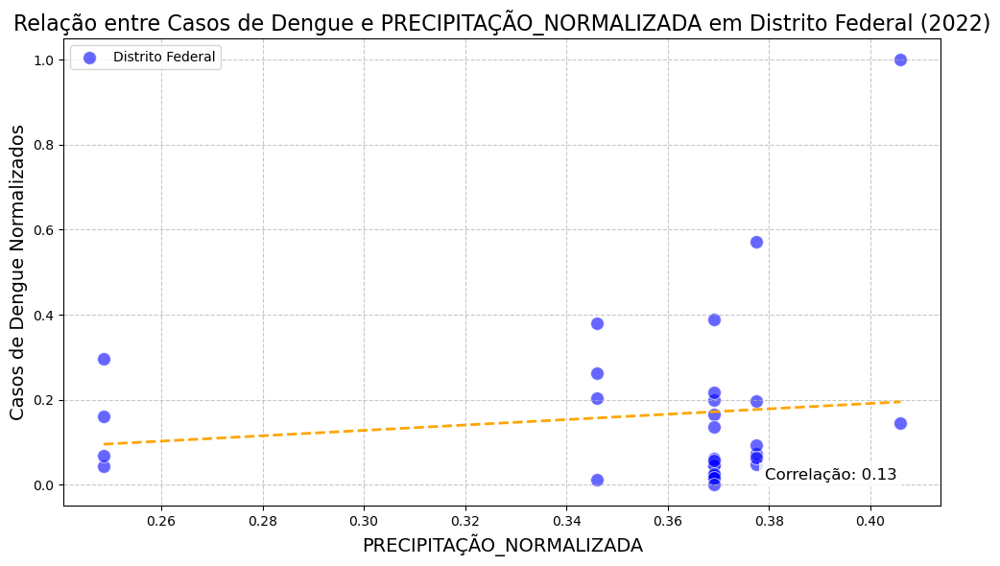

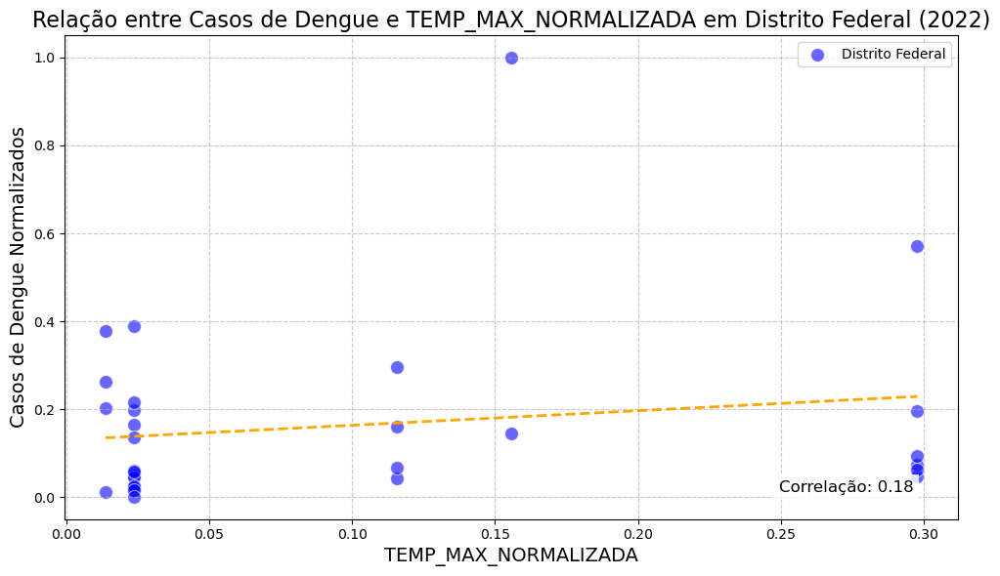

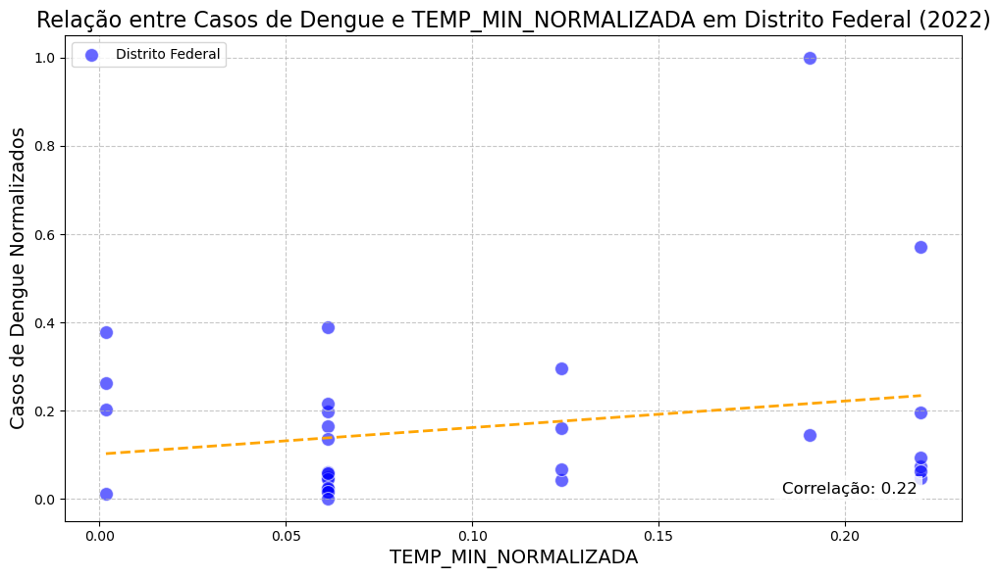

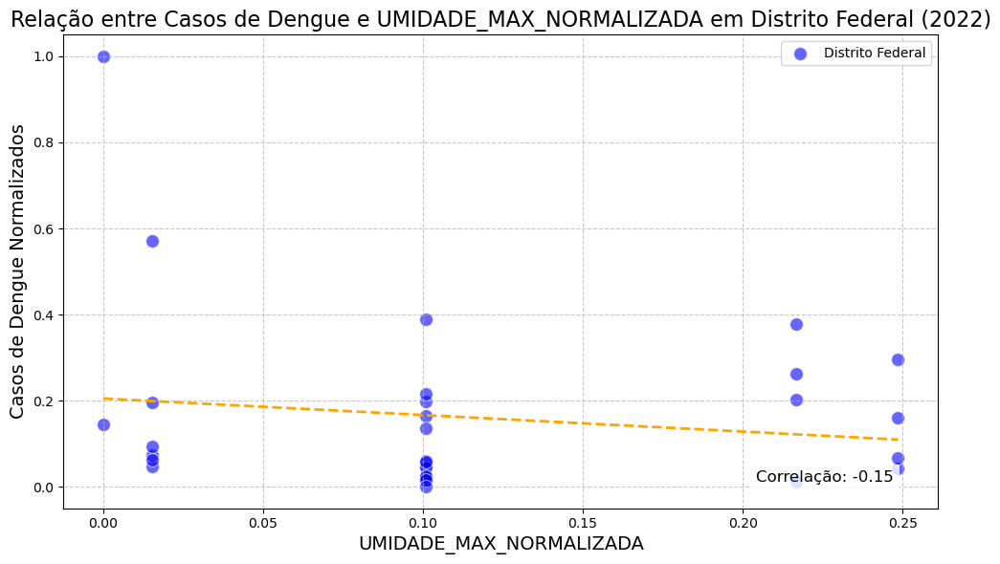

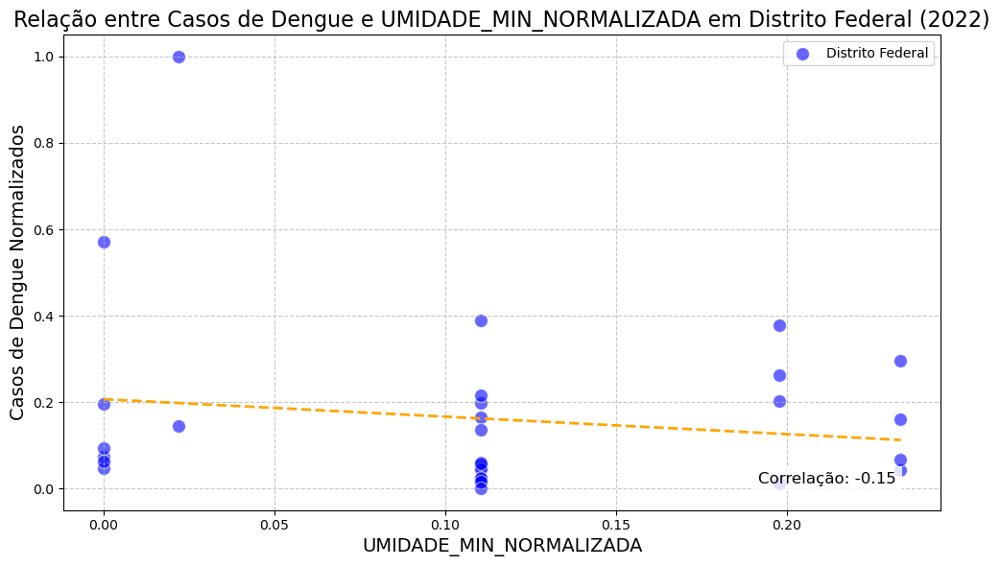

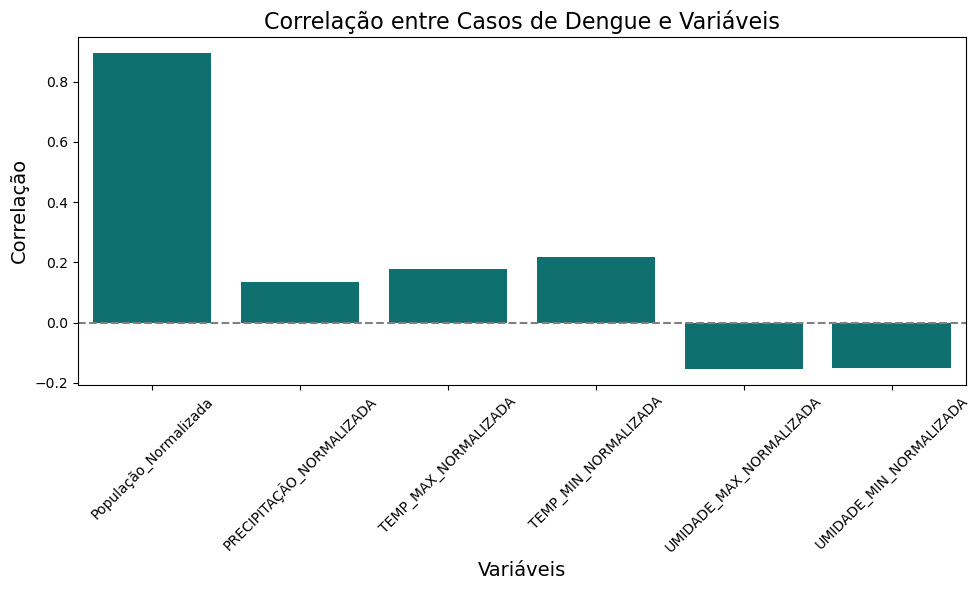

In [607]:
gerar_graficos(df_df, features, ano, 'Distrito Federal')

## **Rio de Janeiro(RJ)**

In [608]:
analise_descritiva(df_rio, "Rio de Janeiro", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados_cem_mil,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000
mean,722.250000,12329125.000000,0.300000,8.210000,0.060000,0.490000,0.570000,0.650000,0.780000,0.810000
std,552.500000,10204244.450000,0.250000,10.370000,0.050000,0.360000,0.130000,0.090000,0.120000,0.100000
min,42.000000,3098600.000000,0.070000,1.360000,0.000000,0.170000,0.420000,0.530000,0.630000,0.660000
25%,388.500000,4401200.000000,0.100000,2.600000,0.030000,0.290000,0.520000,0.620000,0.730000,0.790000
50%,823.000000,10789400.000000,0.260000,3.940000,0.070000,0.390000,0.570000,0.680000,0.790000,0.830000
75%,1156.750000,18717325.000000,0.460000,9.560000,0.100000,0.590000,0.620000,0.710000,0.830000,0.850000
max,1201.000000,24639100.000000,0.600000,23.620000,0.100000,1.000000,0.740000,0.740000,0.910000,0.910000


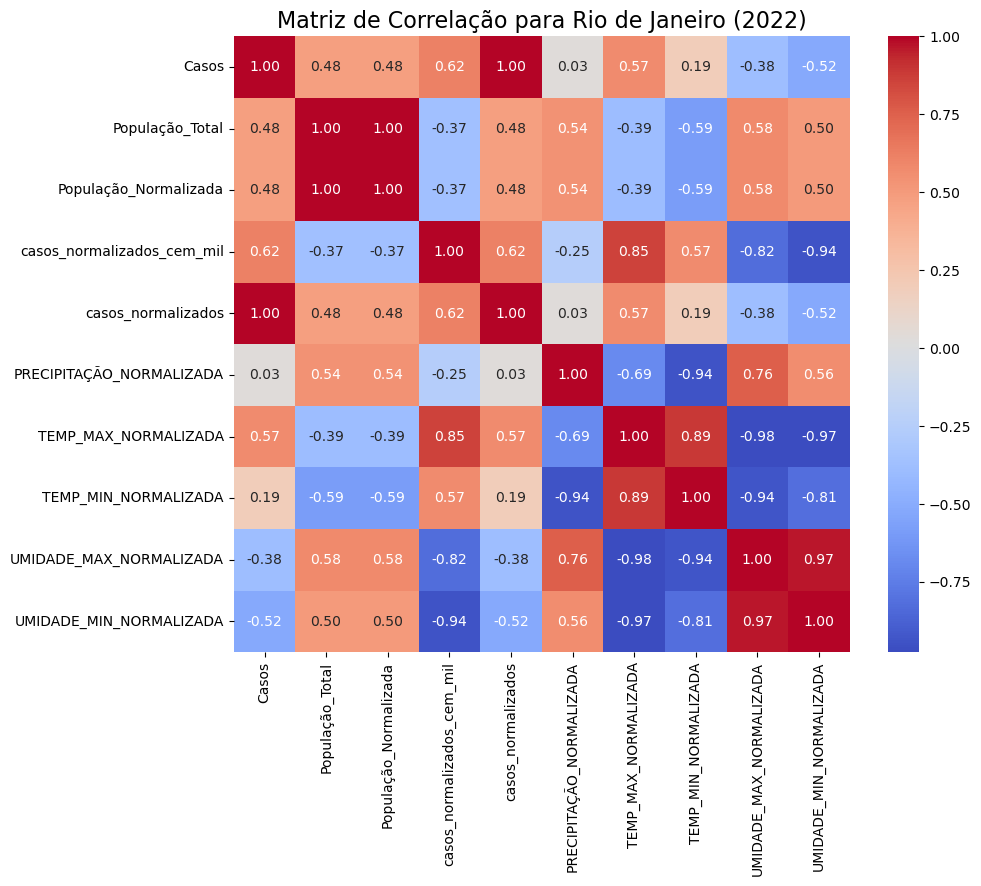

In [609]:
calcular_correlacao(df_rio, "Rio de Janeiro", ano)

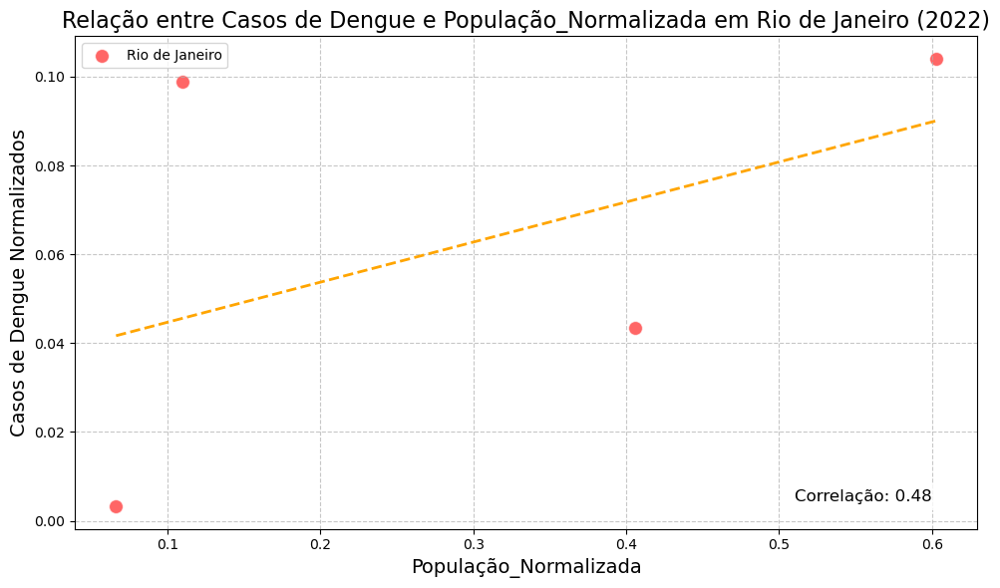

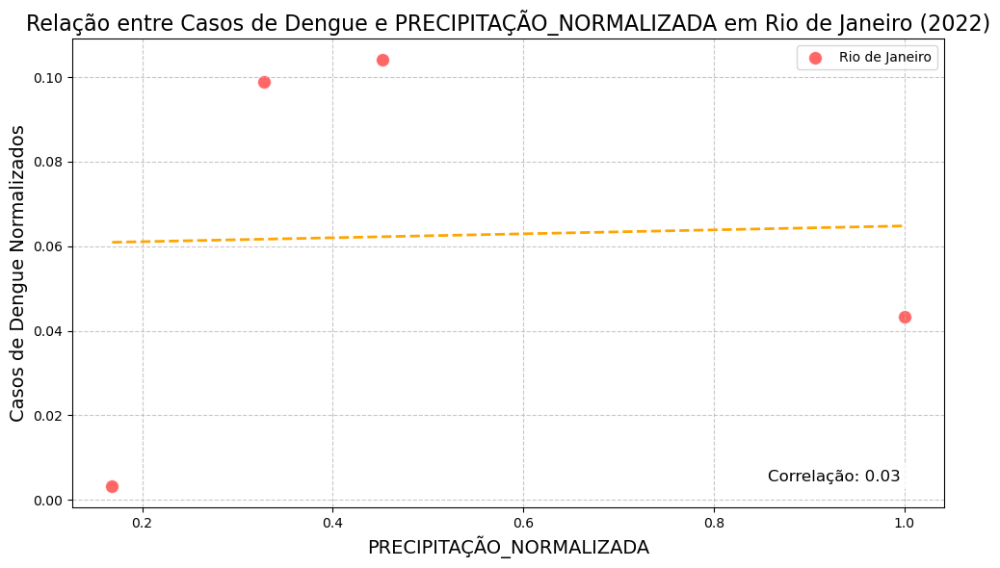

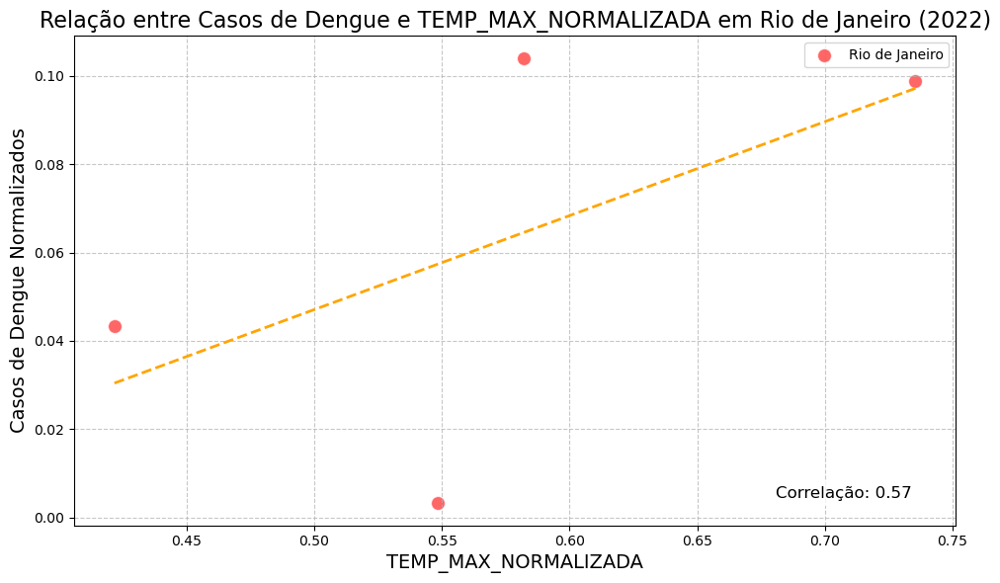

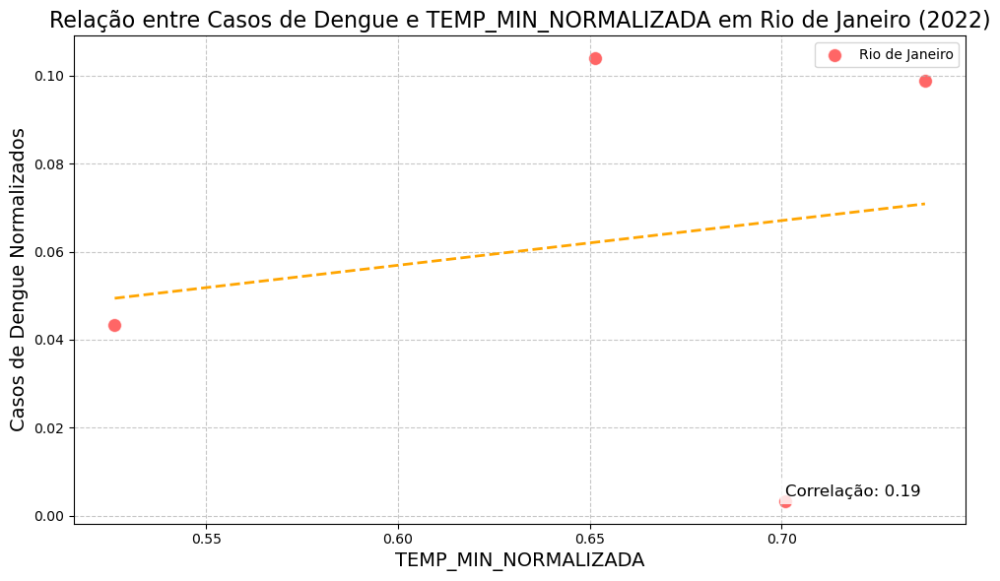

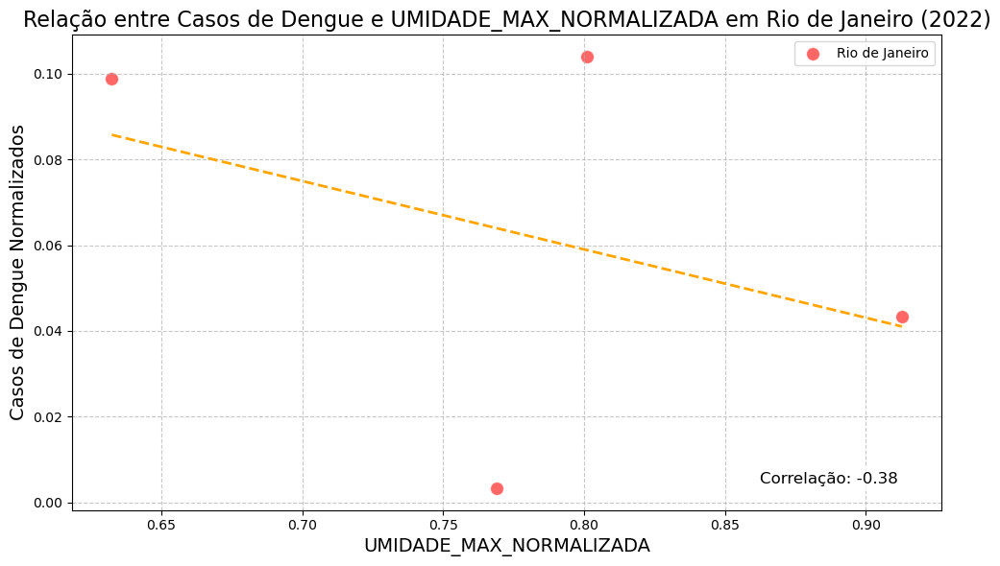

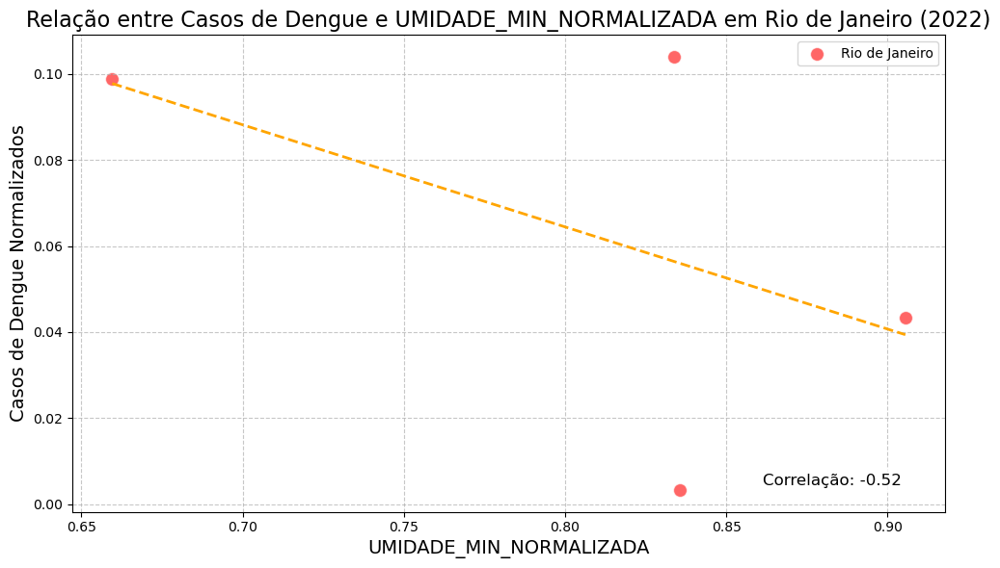

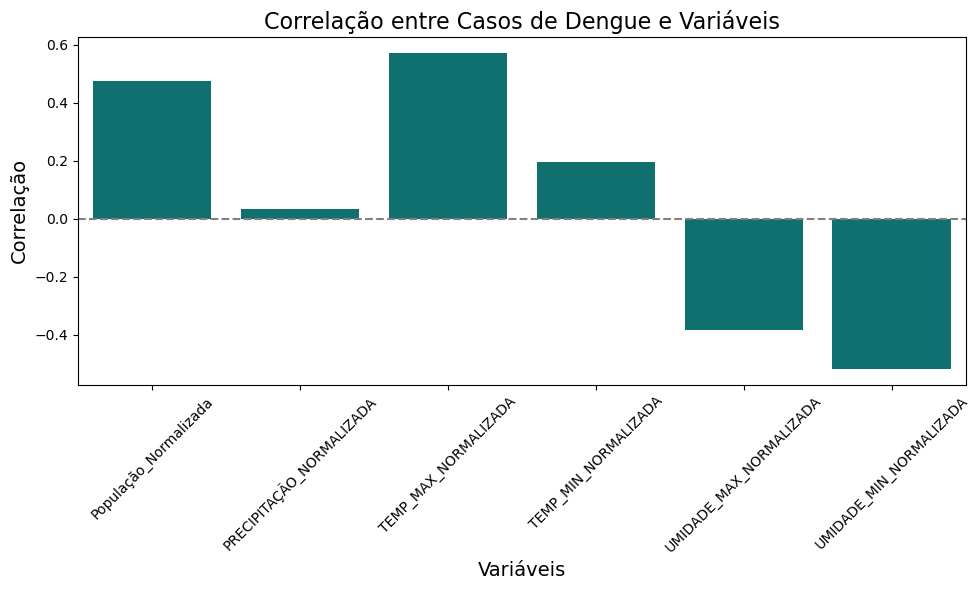

In [610]:
gerar_graficos(df_rio, features, ano, 'Rio de Janeiro')

## **Rio de Janeiro(RJ) e Distrito Federal(DF)**

In [611]:
analise_descritiva(df_relevante, "Rio de Janeiro(RJ) e Distrito Federal(DF)", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados_cem_mil,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000
mean,1741.460000,8804762.860000,0.210000,19.320000,0.150000,0.370000,0.150000,0.160000,0.190000,0.190000
std,2249.300000,8588302.350000,0.210000,11.570000,0.200000,0.120000,0.190000,0.190000,0.230000,0.240000
min,11.000000,435600.000000,0.000000,1.360000,0.000000,0.170000,0.010000,0.000000,0.000000,0.000000
25%,503.500000,3125000.000000,0.070000,11.230000,0.040000,0.350000,0.020000,0.060000,0.100000,0.110000
50%,848.000000,5208900.000000,0.120000,18.090000,0.070000,0.370000,0.020000,0.060000,0.100000,0.110000
75%,2278.000000,12165300.000000,0.290000,24.430000,0.200000,0.380000,0.300000,0.220000,0.220000,0.200000
max,11499.000000,40593200.000000,1.000000,45.820000,1.000000,1.000000,0.740000,0.740000,0.910000,0.910000


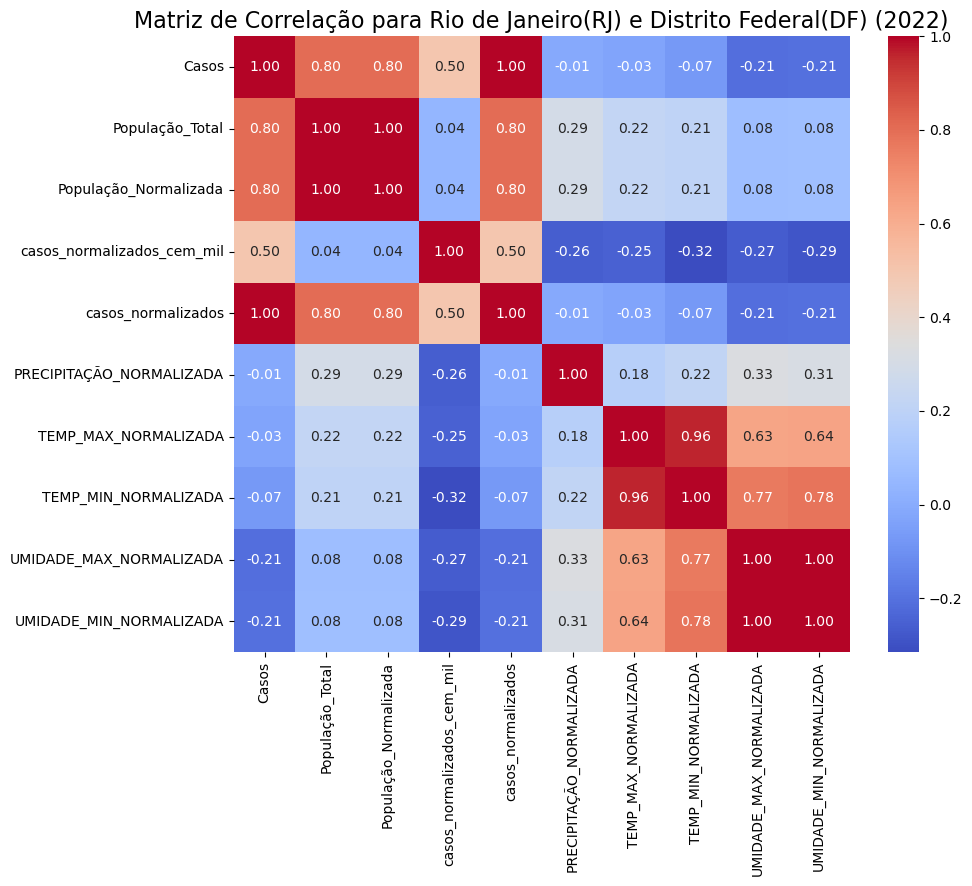

In [612]:
calcular_correlacao(df_relevante, "Rio de Janeiro(RJ) e Distrito Federal(DF)", ano)

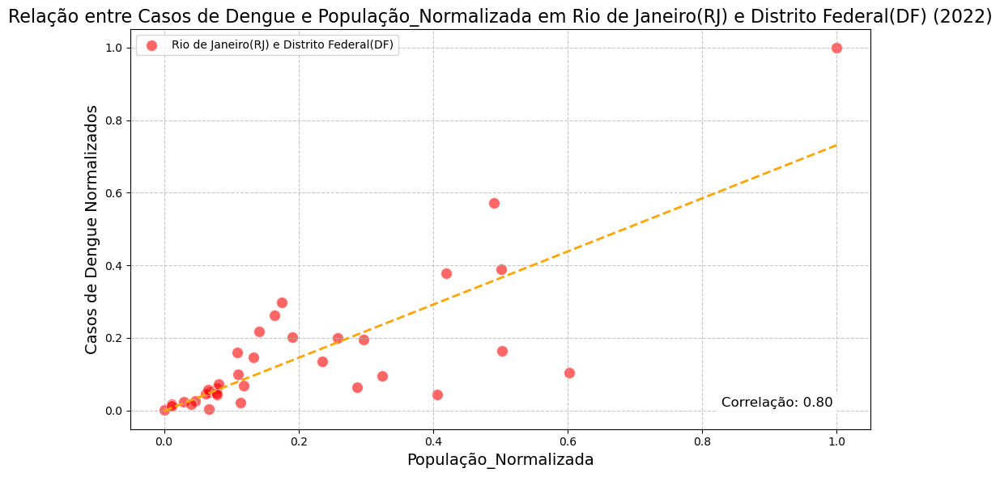

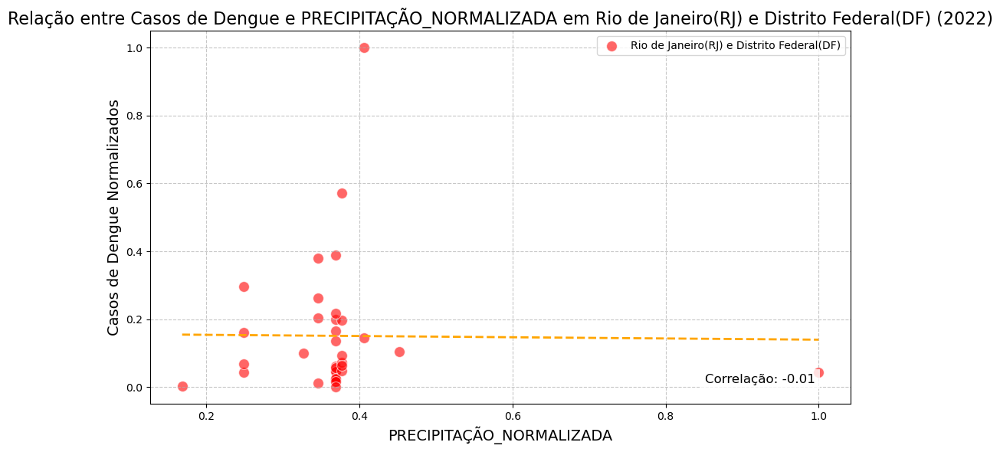

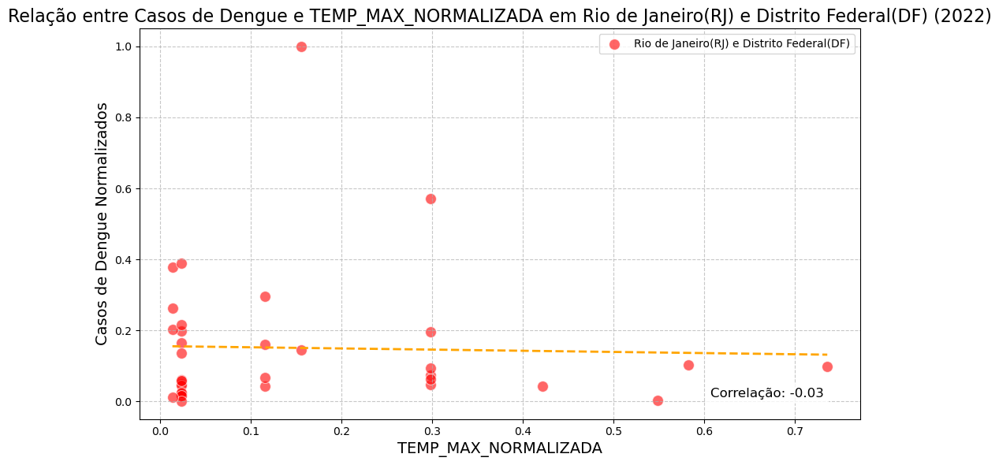

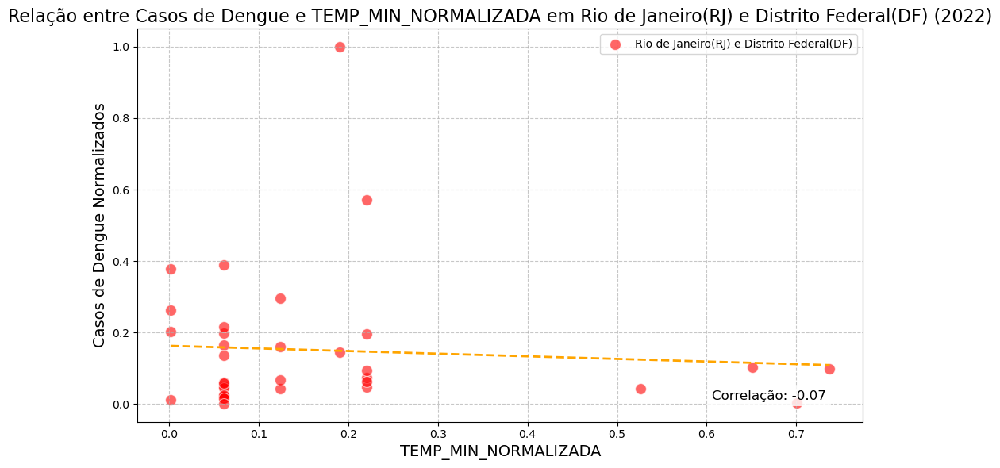

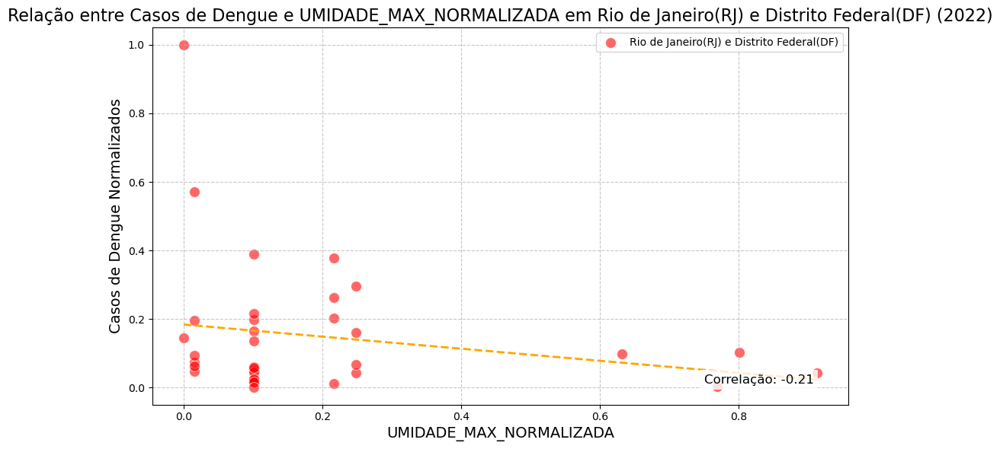

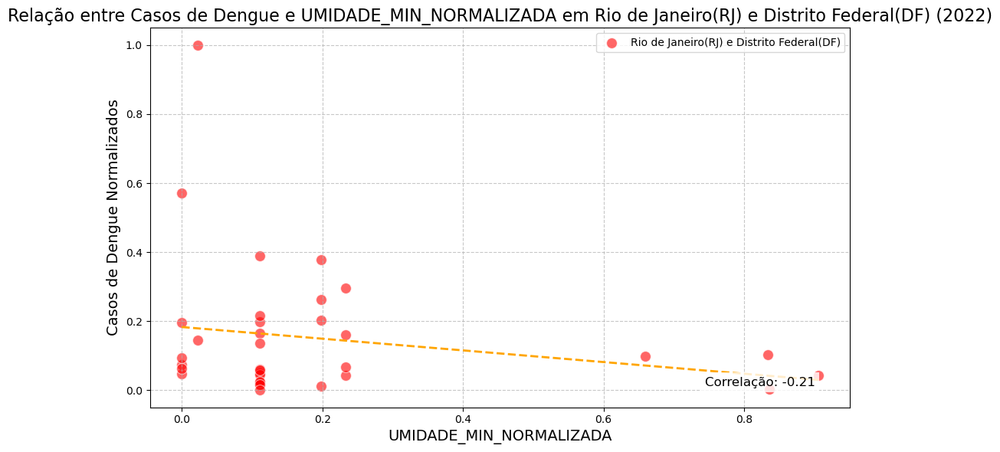

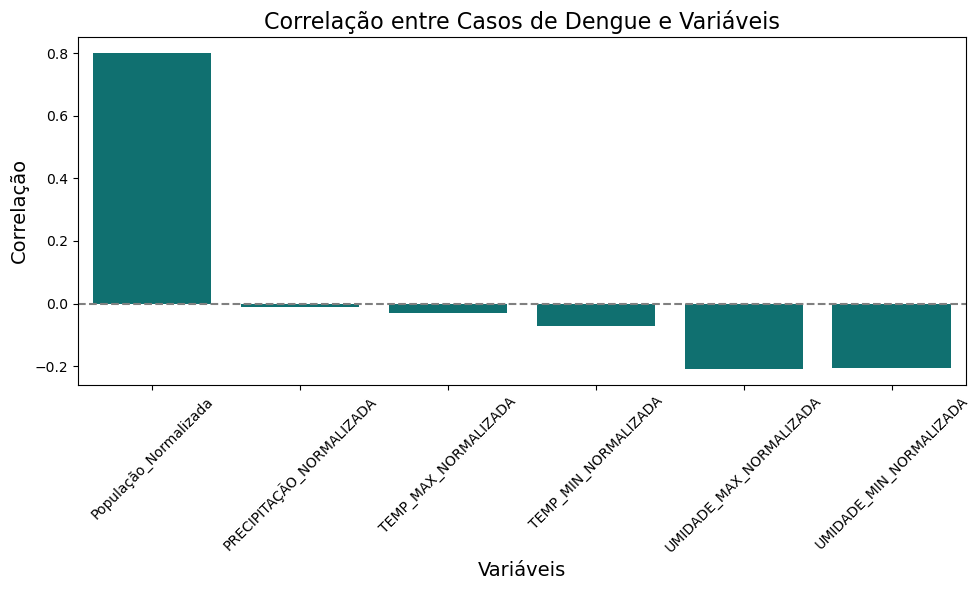

In [613]:
gerar_graficos(df_relevante, features, ano, 'Rio de Janeiro(RJ) e Distrito Federal(DF)')

# **Análise Estátistica de 2023**

In [614]:
    file_path_resultados = f'tabela_saude_com_normalizacao_2023.csv'
    df = pd.read_csv(file_path_resultados)
    ano = '2023'

    df_relevante = df.drop(columns=['COD_CIDADE', 'COD_REG'])

    df_relevante.columns = df_relevante.columns.str.replace(' ', '_').str.replace('á', 'a').str.replace('é', 'e').str.replace('í', 'i').str.replace('ó', 'o').str.replace('ú', 'u')

     # df_rio = df_relevante.iloc[-4:].copy()  # Últimos 4 registros para Rio de Janeiro
    # df_df = df_relevante.iloc[:-4].copy()   # Todos os registros menos os últimos 4

    df_rio = df_relevante.iloc[-4:].copy()  # Últimos 2 registros para Rio de Janeiro
    df_df = df_relevante.iloc[:-4].copy()   # Todos os registros menos os últimos 2

    features = [
        'População_Normalizada',
        'PRECIPITAÇÃO_NORMALIZADA', 
        'TEMP_MAX_NORMALIZADA',
        'TEMP_MIN_NORMALIZADA', 
        'UMIDADE_MAX_NORMALIZADA',
        'UMIDADE_MIN_NORMALIZADA'
    ]

## **Distrito Federal(DF)**

In [615]:
analise_descritiva(df_df, "Distrito Federal", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados_cem_mil,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000
mean,1059.680000,8350006.450000,0.200000,12.110000,0.090000,0.250000,0.350000,0.290000,0.170000,0.140000
std,1201.750000,8444581.370000,0.210000,9.150000,0.100000,0.050000,0.090000,0.060000,0.070000,0.070000
min,8.000000,435600.000000,0.000000,1.840000,0.000000,0.190000,0.270000,0.250000,0.020000,0.020000
25%,211.000000,3110050.000000,0.070000,6.310000,0.020000,0.210000,0.270000,0.250000,0.130000,0.100000
50%,725.000000,5208900.000000,0.120000,8.620000,0.060000,0.210000,0.340000,0.250000,0.180000,0.150000
75%,1396.500000,11376900.000000,0.270000,15.240000,0.120000,0.290000,0.410000,0.360000,0.190000,0.160000
max,5280.000000,40593200.000000,1.000000,43.900000,0.460000,0.370000,0.500000,0.380000,0.280000,0.250000


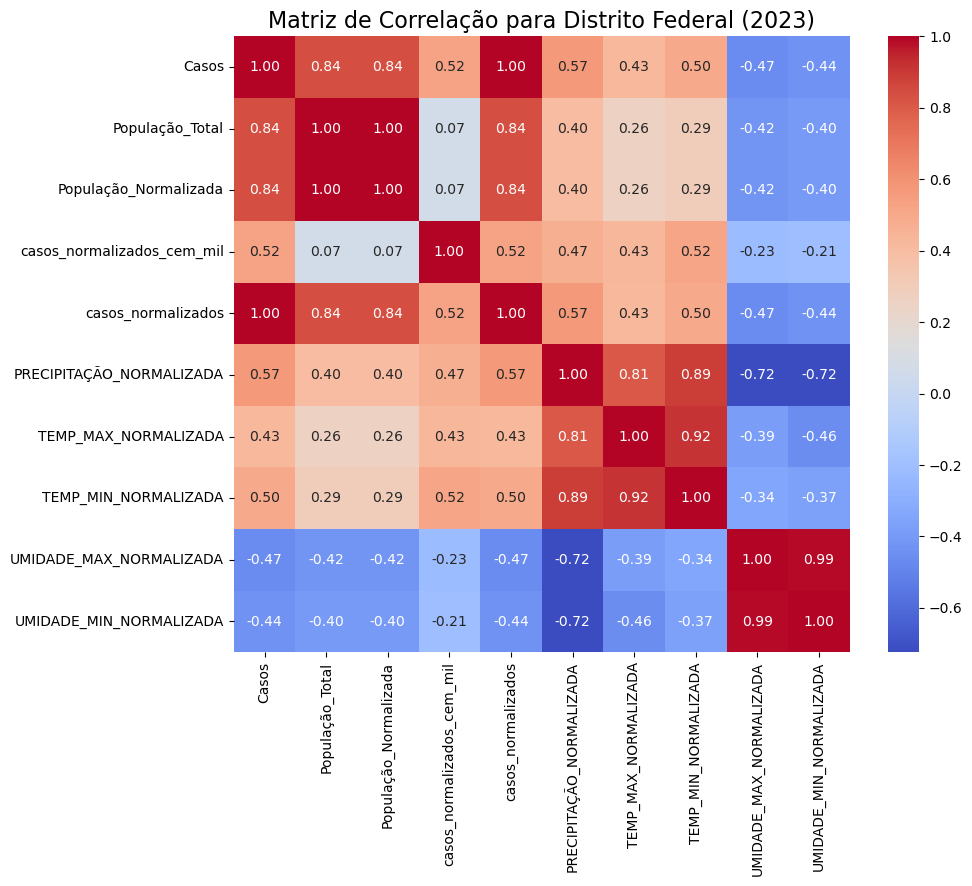

In [616]:
calcular_correlacao(df_df, "Distrito Federal", ano)

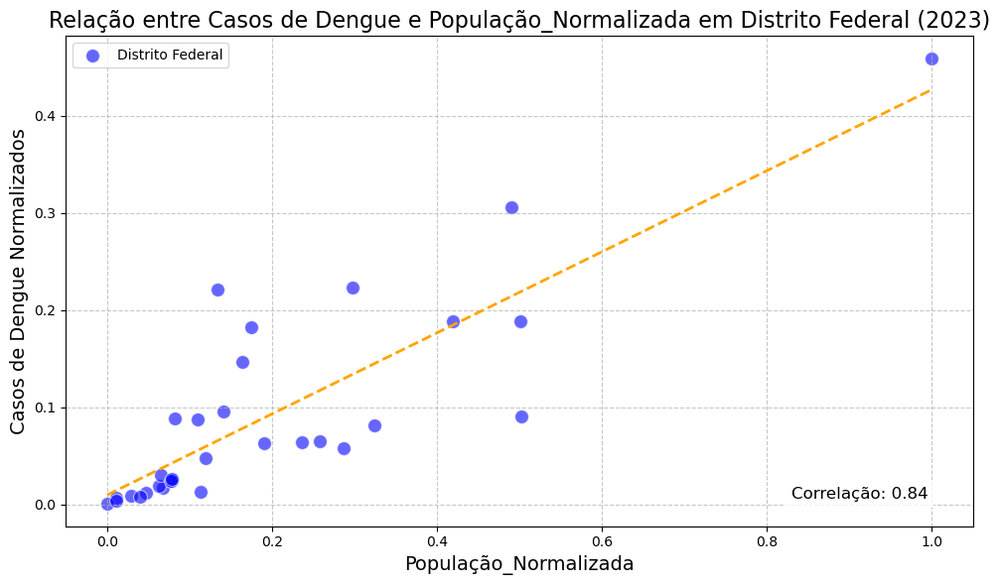

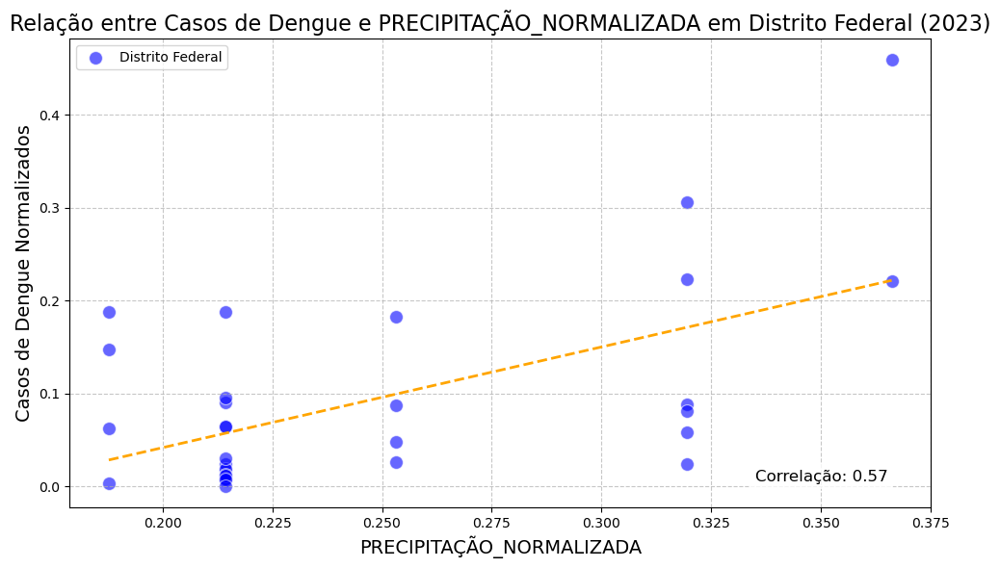

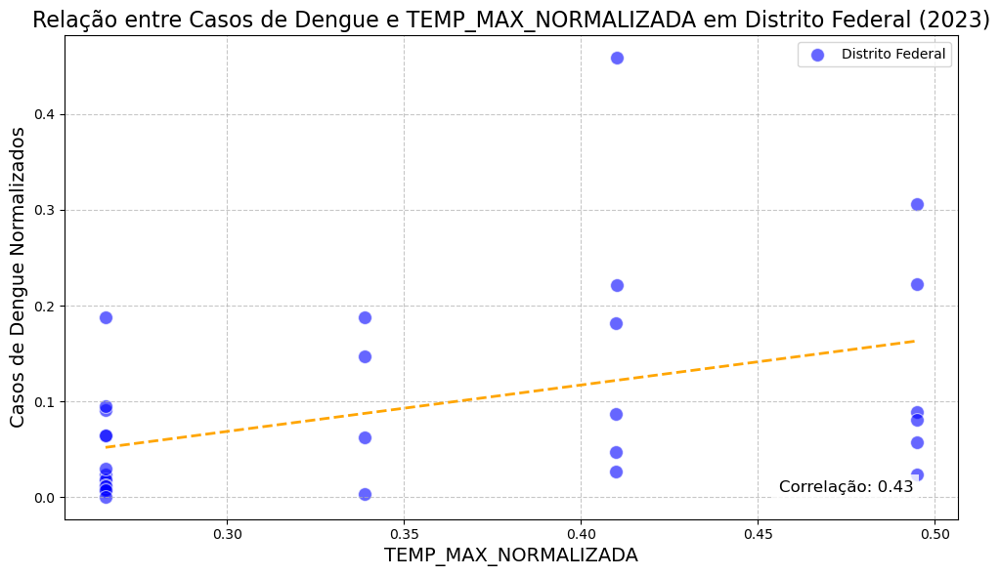

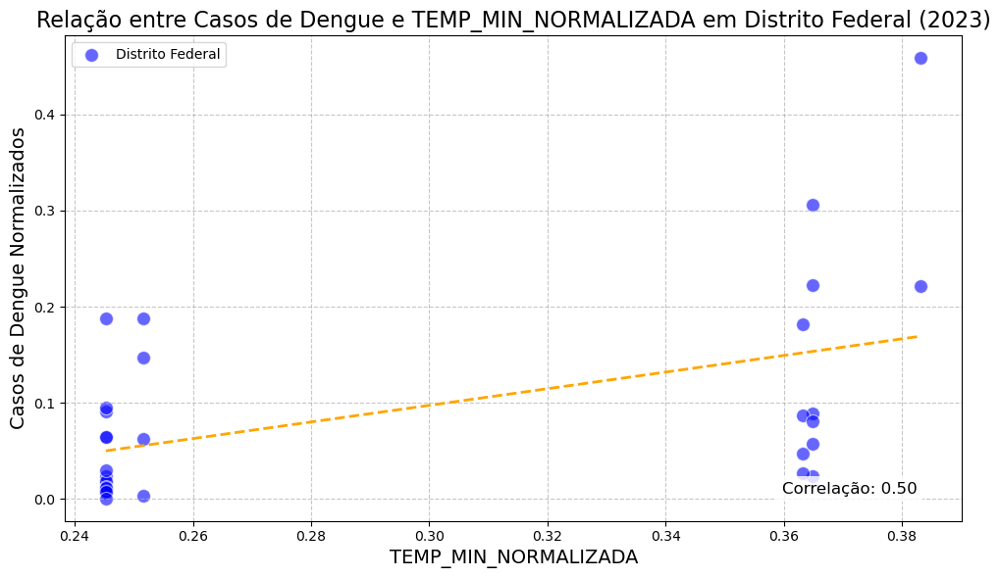

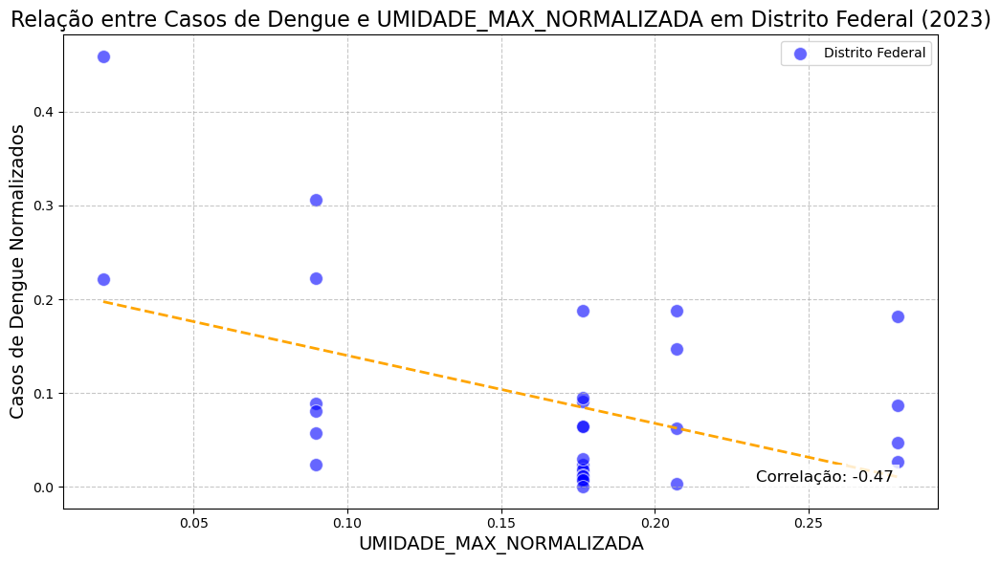

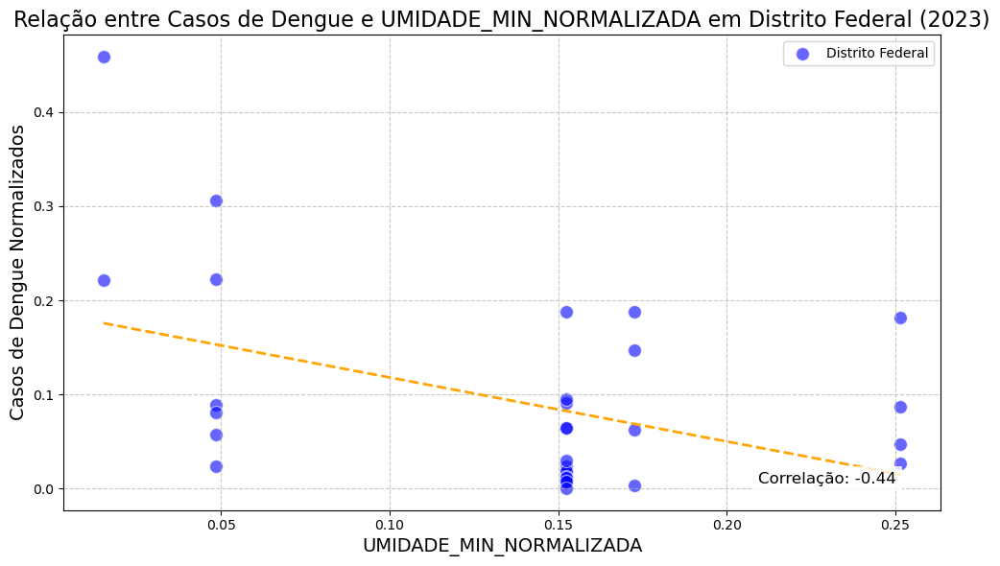

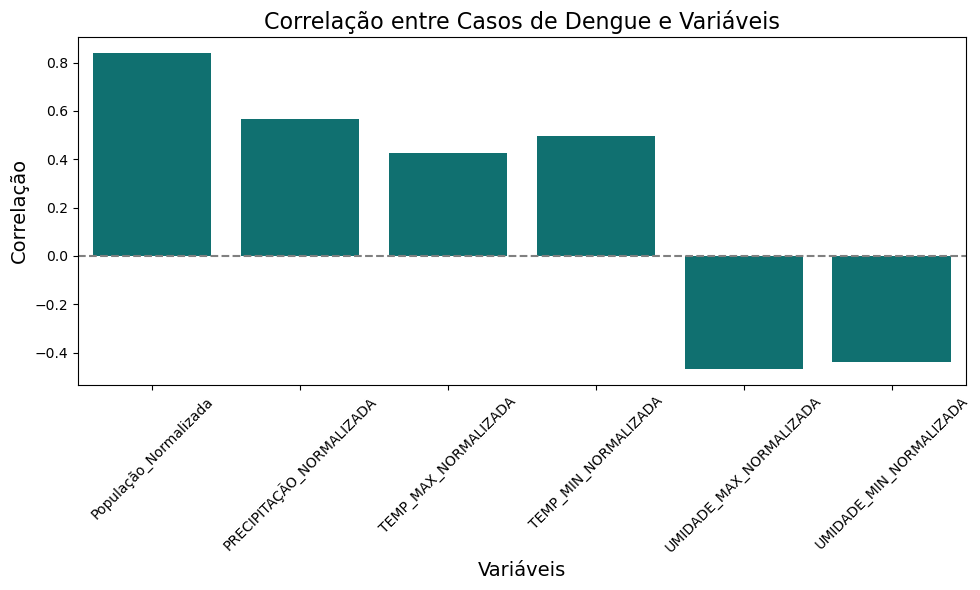

In [617]:
gerar_graficos(df_df, features, ano, 'Distrito Federal')

## **Rio de Janeiro(RJ)**

In [618]:
analise_descritiva(df_rio, "Rio de Janeiro", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados_cem_mil,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000
mean,3071.500000,12329125.000000,0.300000,49.460000,0.270000,0.270000,0.790000,0.830000,0.770000,0.800000
std,3745.480000,10204244.450000,0.250000,81.820000,0.330000,0.310000,0.110000,0.080000,0.100000,0.090000
min,134.000000,3098600.000000,0.070000,2.450000,0.010000,0.000000,0.690000,0.730000,0.640000,0.670000
25%,486.500000,4401200.000000,0.100000,3.860000,0.040000,0.100000,0.720000,0.790000,0.720000,0.780000
50%,1926.000000,10789400.000000,0.260000,11.860000,0.170000,0.190000,0.760000,0.830000,0.780000,0.830000
75%,4511.000000,18717325.000000,0.460000,57.460000,0.390000,0.360000,0.830000,0.860000,0.830000,0.850000
max,8300.000000,24639100.000000,0.600000,171.650000,0.720000,0.700000,0.940000,0.920000,0.870000,0.860000


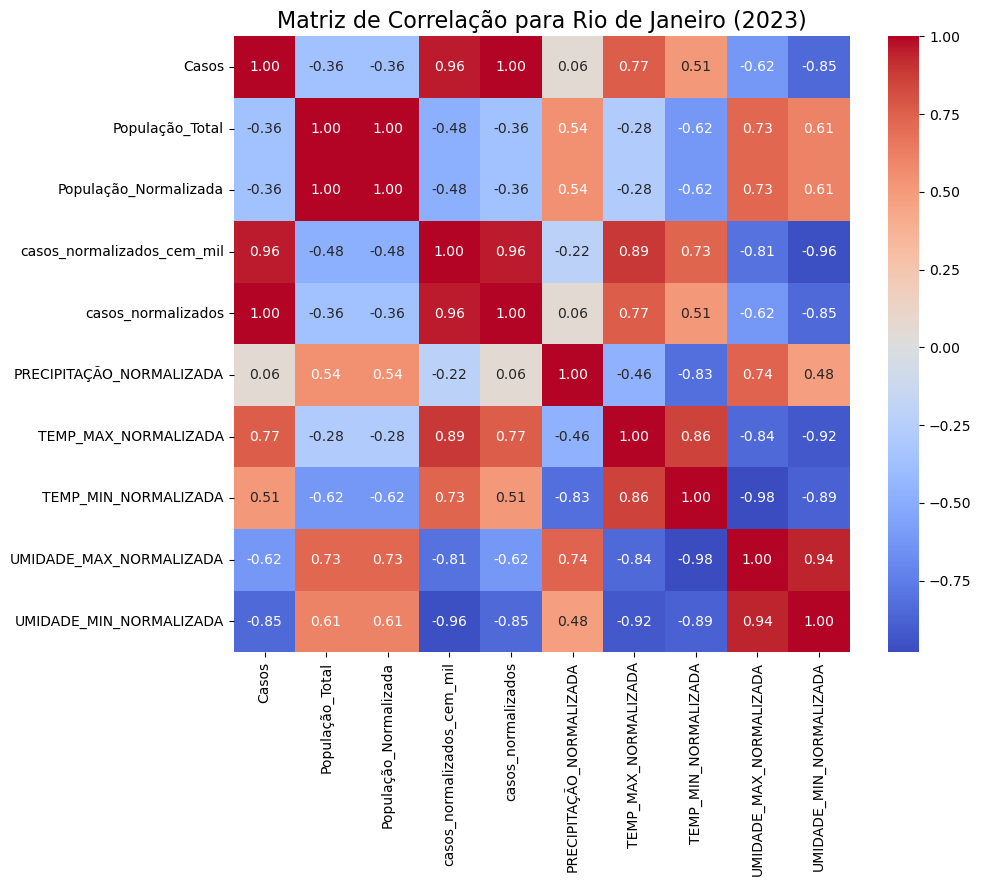

In [619]:
calcular_correlacao(df_rio, "Rio de Janeiro", ano)

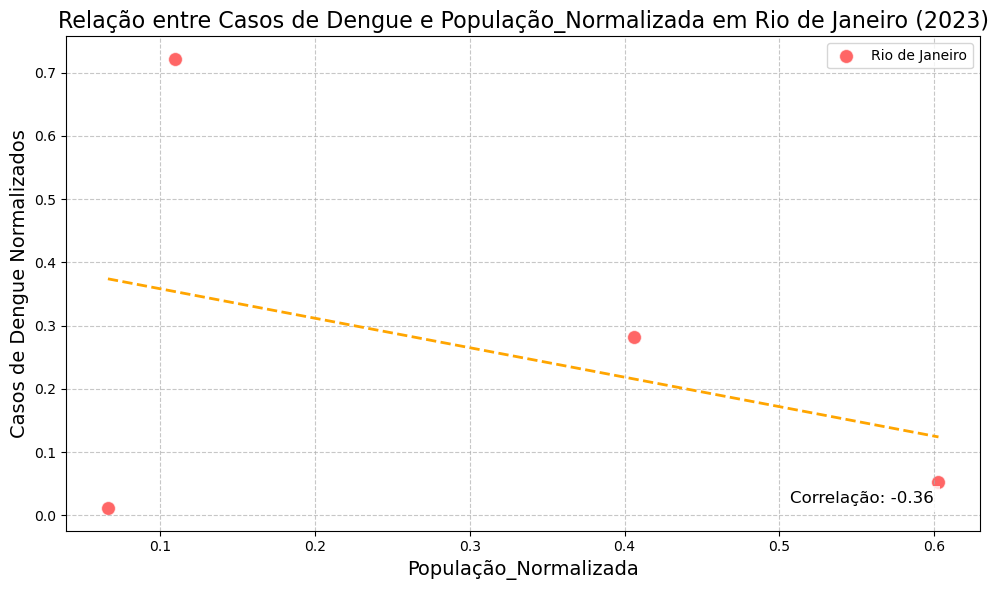

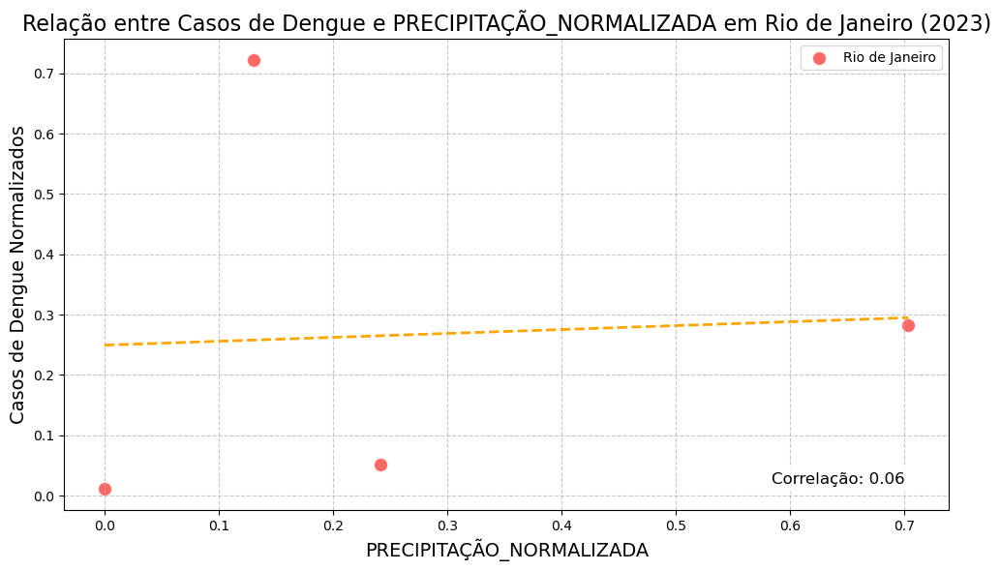

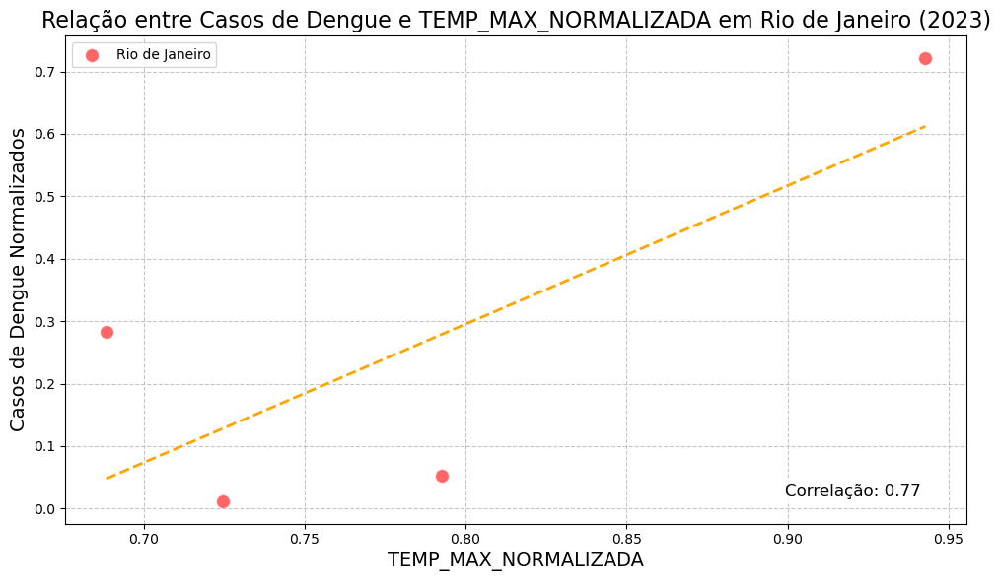

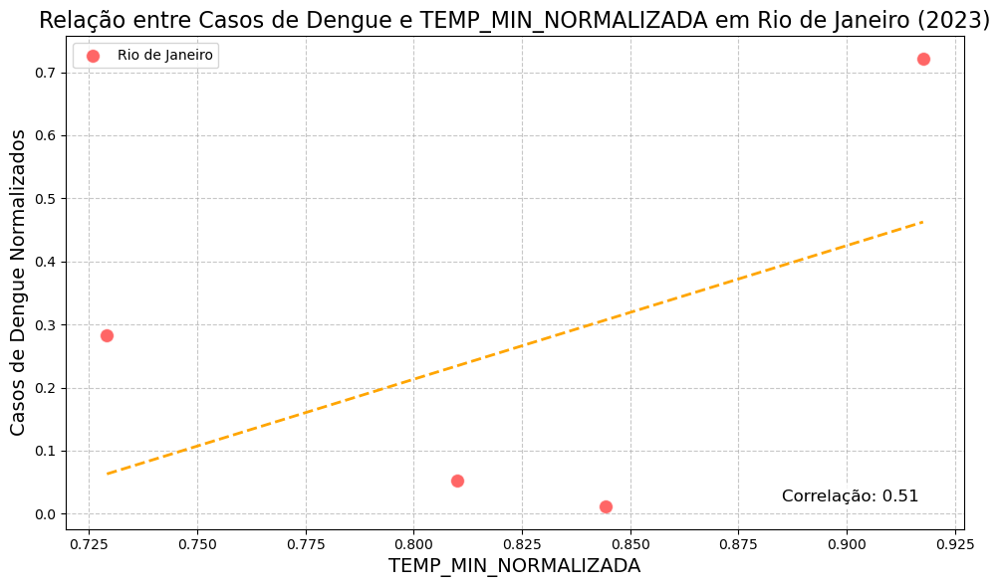

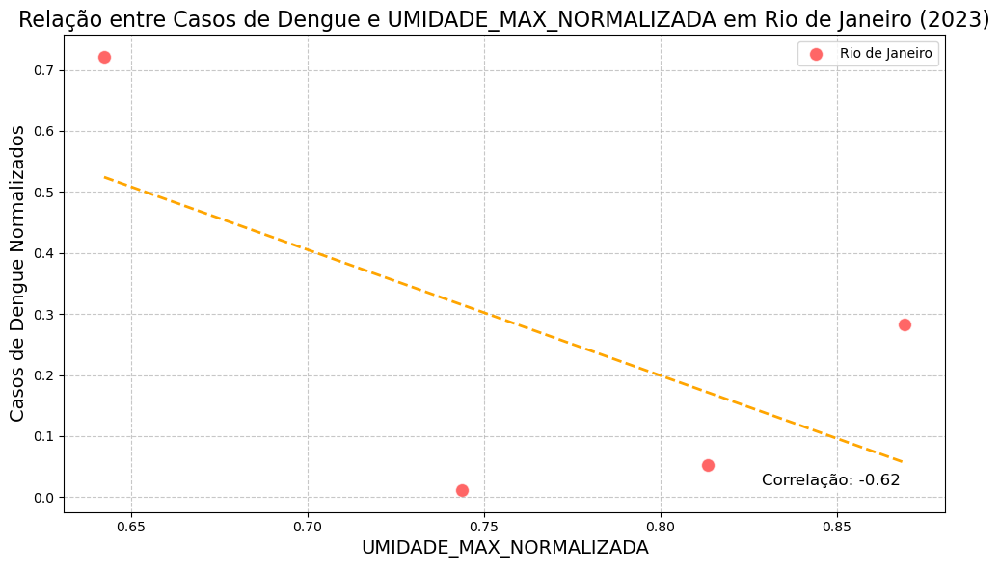

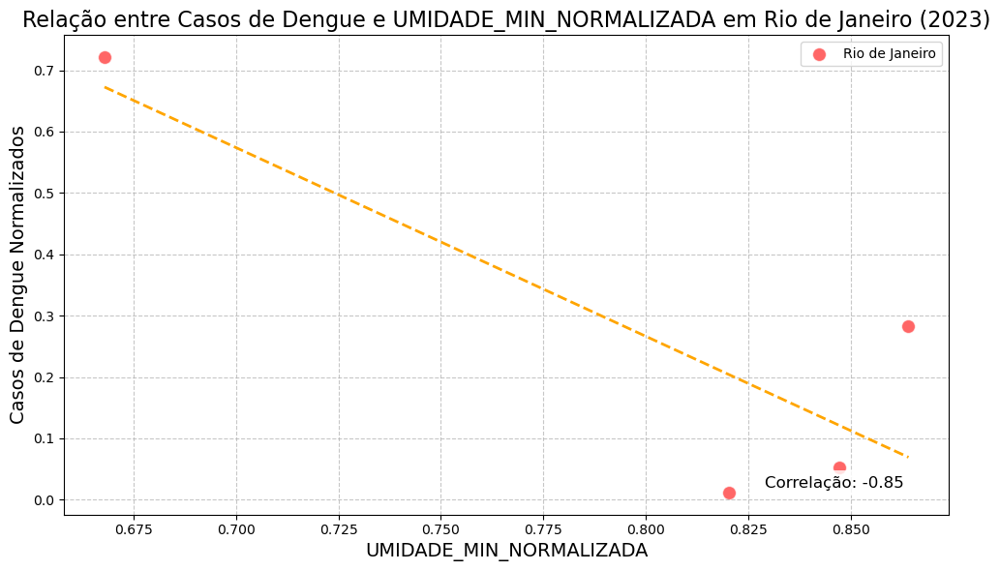

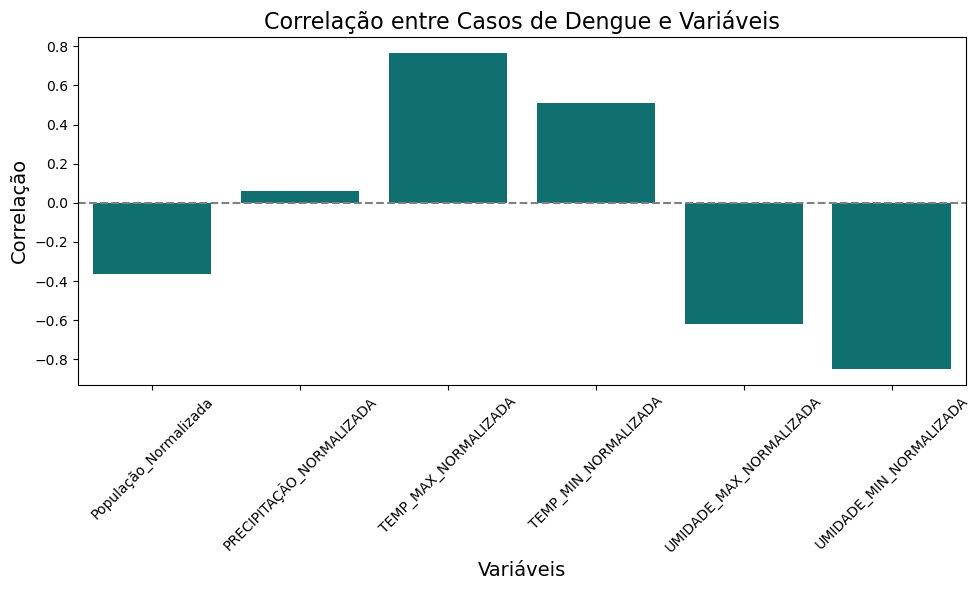

In [620]:
gerar_graficos(df_rio, features, ano, 'Rio de Janeiro')

## **Rio de Janeiro(RJ) e Distrito Federal(DF)**

In [621]:
analise_descritiva(df_relevante, "Rio de Janeiro(RJ) e Distrito Federal(DF)", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados_cem_mil,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000
mean,1289.600000,8804762.860000,0.210000,16.380000,0.110000,0.250000,0.400000,0.350000,0.240000,0.210000
std,1712.860000,8588302.350000,0.210000,28.460000,0.150000,0.100000,0.170000,0.180000,0.210000,0.220000
min,8.000000,435600.000000,0.000000,1.840000,0.000000,0.000000,0.270000,0.250000,0.020000,0.020000
25%,211.000000,3125000.000000,0.070000,6.240000,0.020000,0.210000,0.270000,0.250000,0.180000,0.150000
50%,725.000000,5208900.000000,0.120000,8.620000,0.060000,0.210000,0.340000,0.250000,0.180000,0.150000
75%,1896.500000,12165300.000000,0.290000,17.740000,0.160000,0.290000,0.500000,0.360000,0.210000,0.170000
max,8300.000000,40593200.000000,1.000000,171.650000,0.720000,0.700000,0.940000,0.920000,0.870000,0.860000


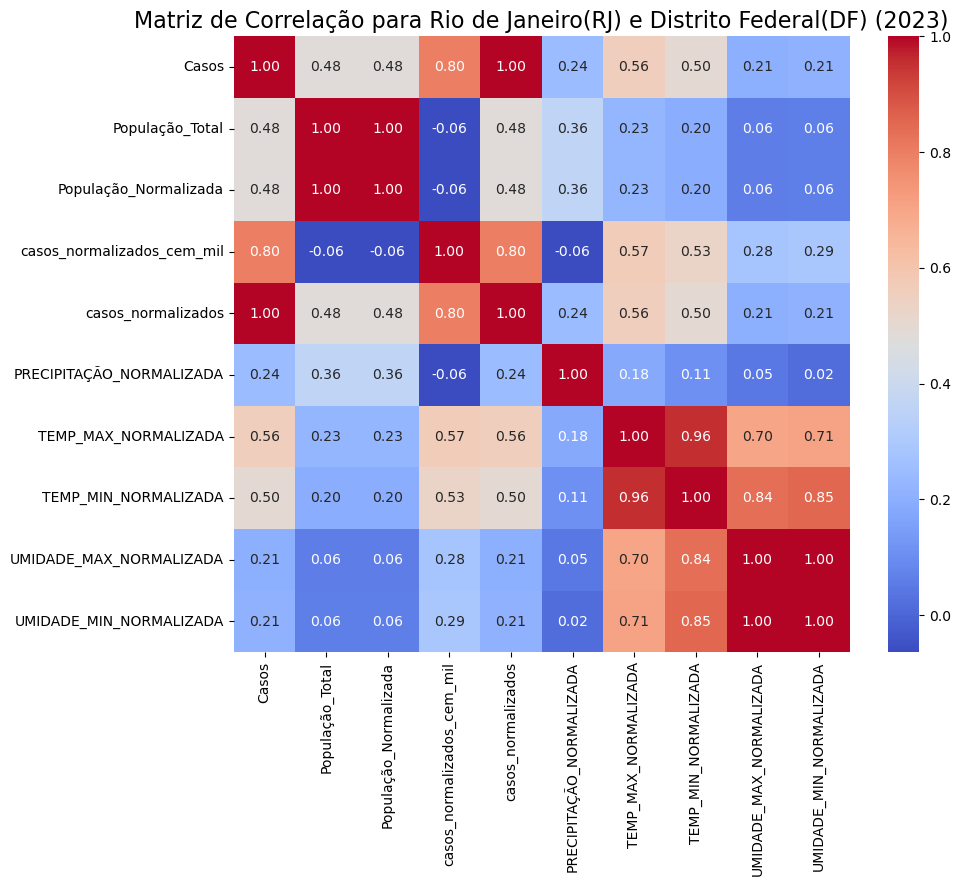

In [622]:
calcular_correlacao(df_relevante, "Rio de Janeiro(RJ) e Distrito Federal(DF)", ano)

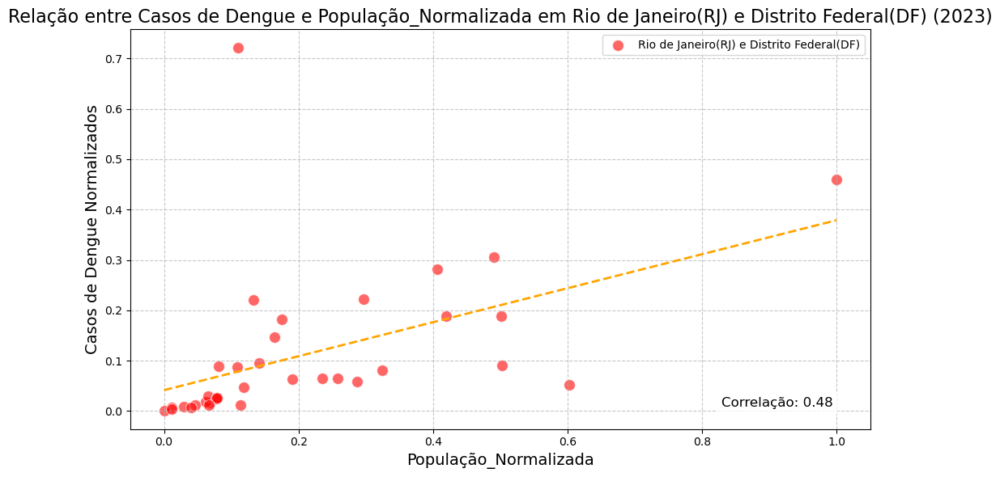

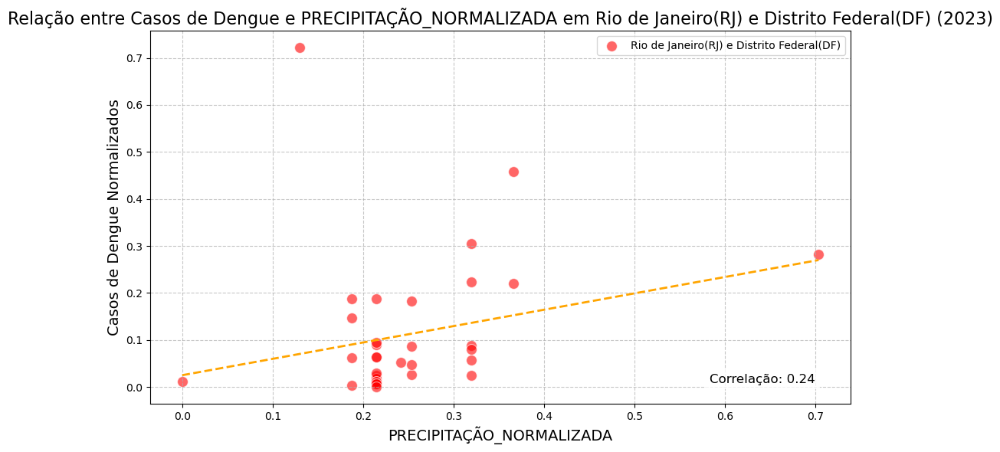

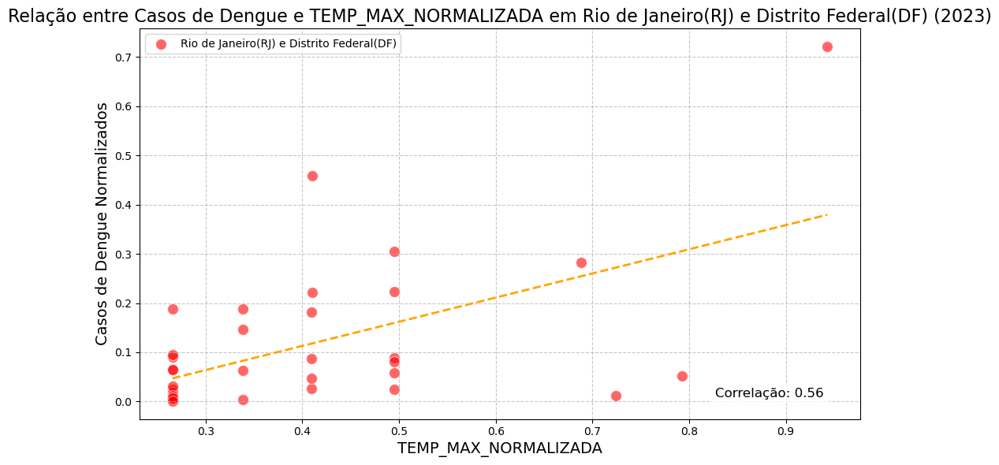

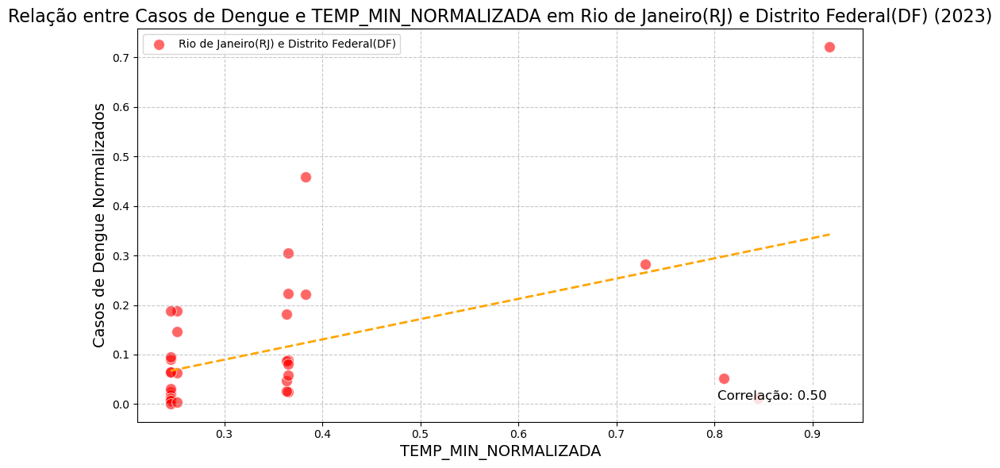

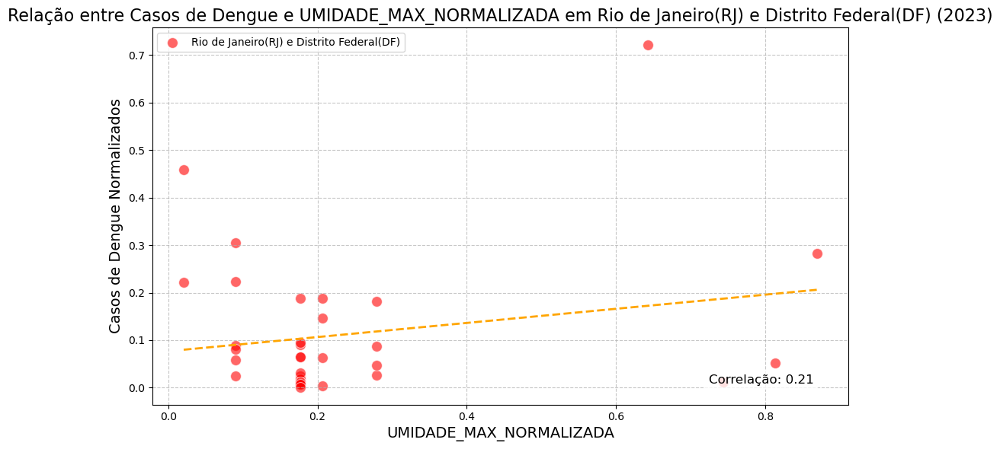

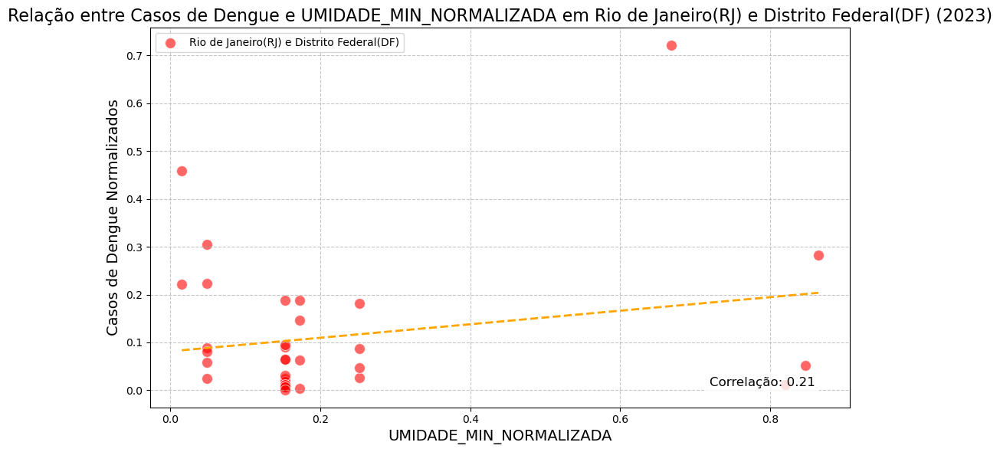

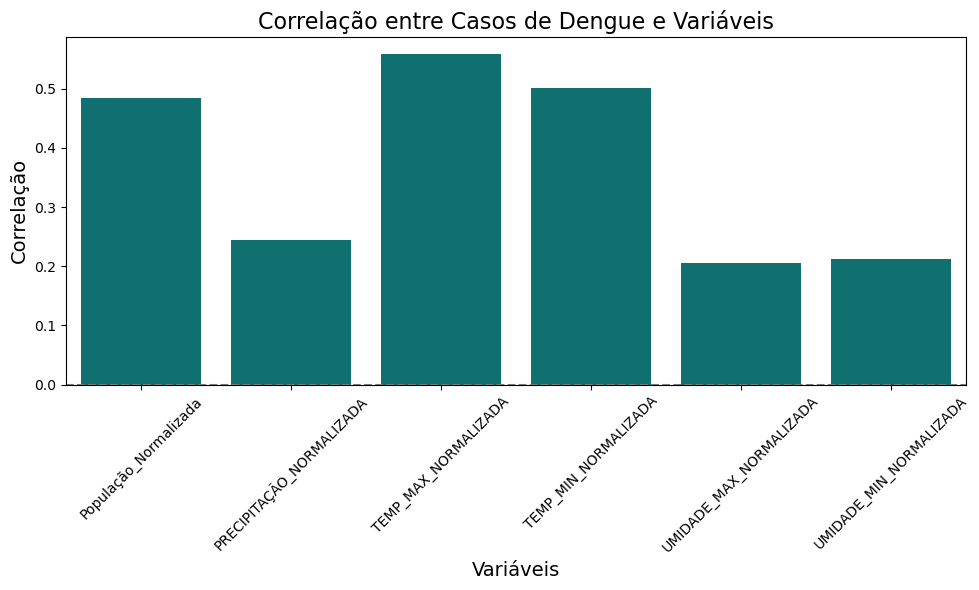

In [623]:
gerar_graficos(df_relevante, features, ano, 'Rio de Janeiro(RJ) e Distrito Federal(DF)')

# **Análise Estátistica: Casos vs Features(2019 a 2023)**


**Função para plotar gráfico de dispersão (scatter plot) comparando casos de dengue normalizados
    com uma variável normalizada.**

    Parâmetros:
    - df_consolidado: DataFrame consolidado contendo os dados de dengue e variáveis normalizadas.
    - x_variable: A coluna do DataFrame a ser usada no eixo x (exemplo: 'TEMP_MAX_NORMALIZADA').
    - x_label: Rótulo do eixo x para o gráfico.
    - title: Título do gráfico.
   

In [624]:
def plot_dengue_vs_variable(df_consolidado, x_variable, x_label, title):
    correlation = df_consolidado[x_variable].corr(df_consolidado['casos_normalizados'])

    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=df_consolidado, x=x_variable, y='casos_normalizados', hue='Ano', palette='viridis', alpha=0.6)

    sns.regplot(data=df_consolidado, x=x_variable, y='casos_normalizados', scatter=False, color='red', 
                line_kws={"linestyle": "--", "linewidth": 1})

    plt.title(f"{title} (Correlação: {correlation:.2f})")
    plt.xlabel(x_label)
    plt.ylabel('Casos de Dengue')
    
    plt.legend(title='Ano', loc='center left', bbox_to_anchor=(1, 0.5))

    plt.tight_layout()
    plt.show()


## **Gráfico de Casos de Dengue vs. Precipitação**

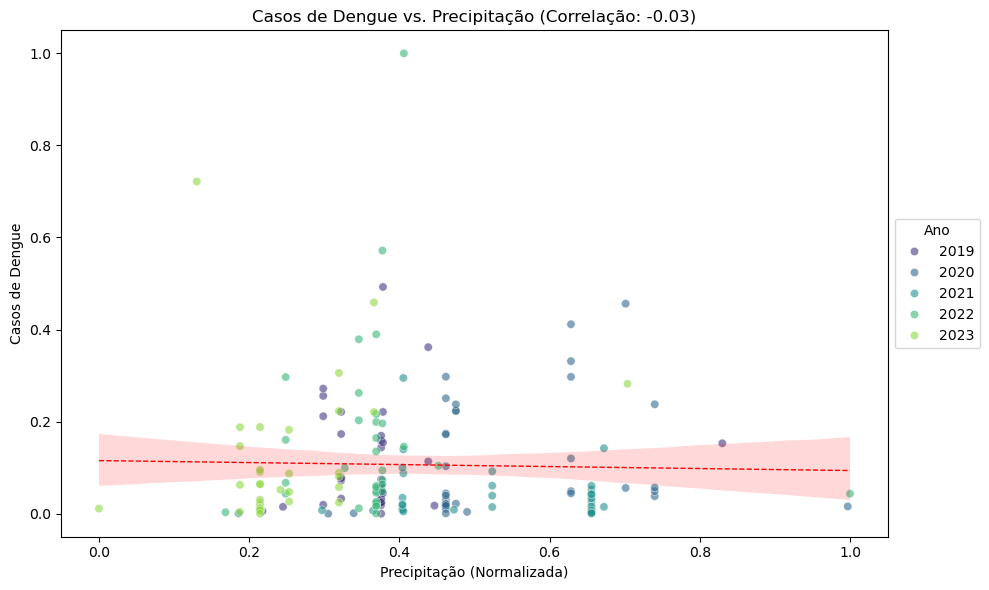

In [625]:
plot_dengue_vs_variable(pd.concat(tabelas_dengue), 'PRECIPITAÇÃO_NORMALIZADA', 'Precipitação (Normalizada)', 'Casos de Dengue vs. Precipitação')

## **Gráfico de Casos de Dengue vs. Temperatura Máxima**

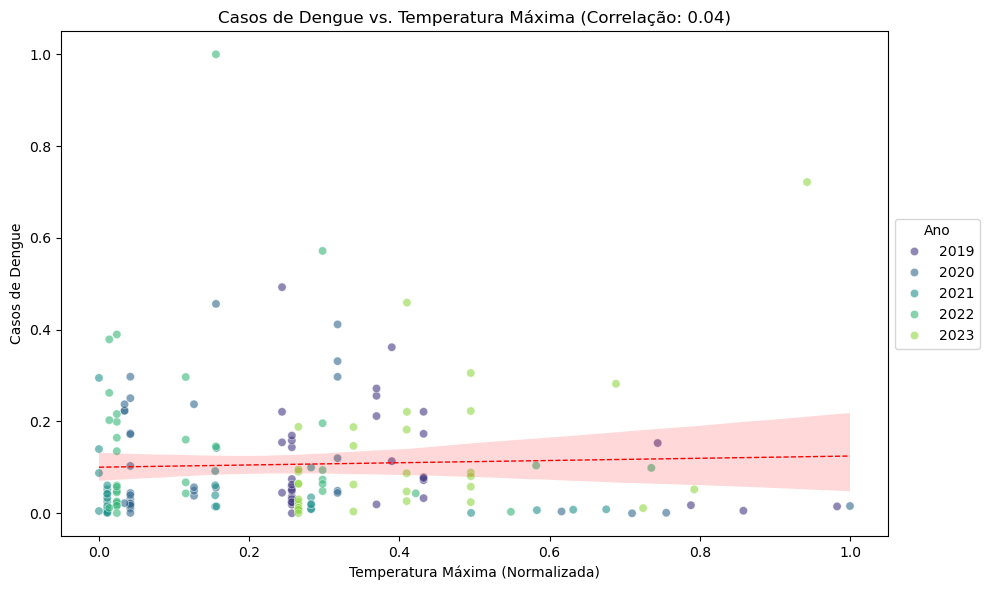

In [626]:
plot_dengue_vs_variable(pd.concat(tabelas_dengue), 'TEMP_MAX_NORMALIZADA', 'Temperatura Máxima (Normalizada)', 'Casos de Dengue vs. Temperatura Máxima')


## **Gráfico de Casos de Dengue vs. Temperatura Mínima**

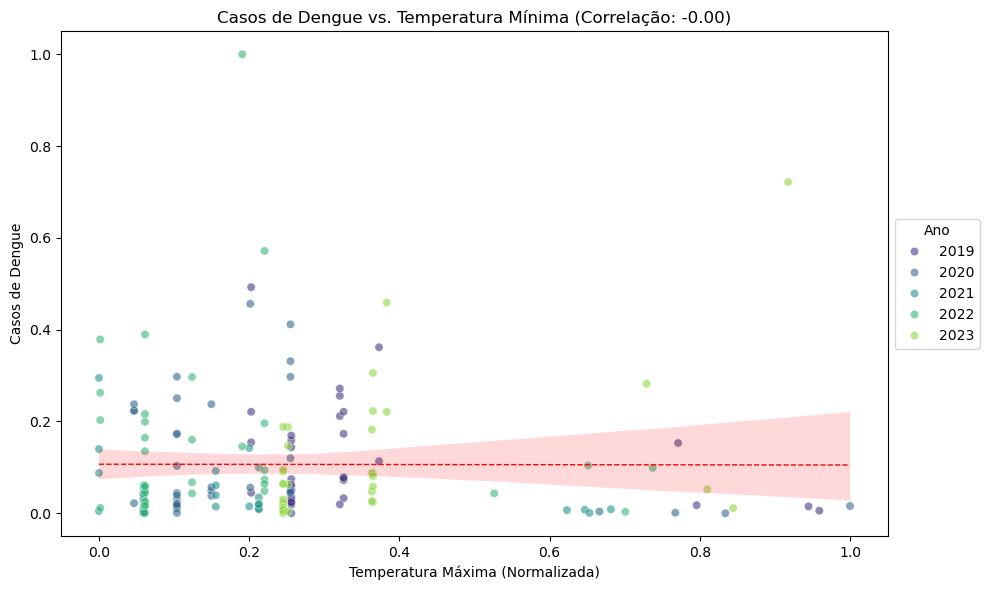

In [627]:
plot_dengue_vs_variable(pd.concat(tabelas_dengue), 'TEMP_MIN_NORMALIZADA', 'Temperatura Máxima (Normalizada)', 'Casos de Dengue vs. Temperatura Mínima')


## **Gráfico de Casos de Dengue vs. Umidade Mínima**

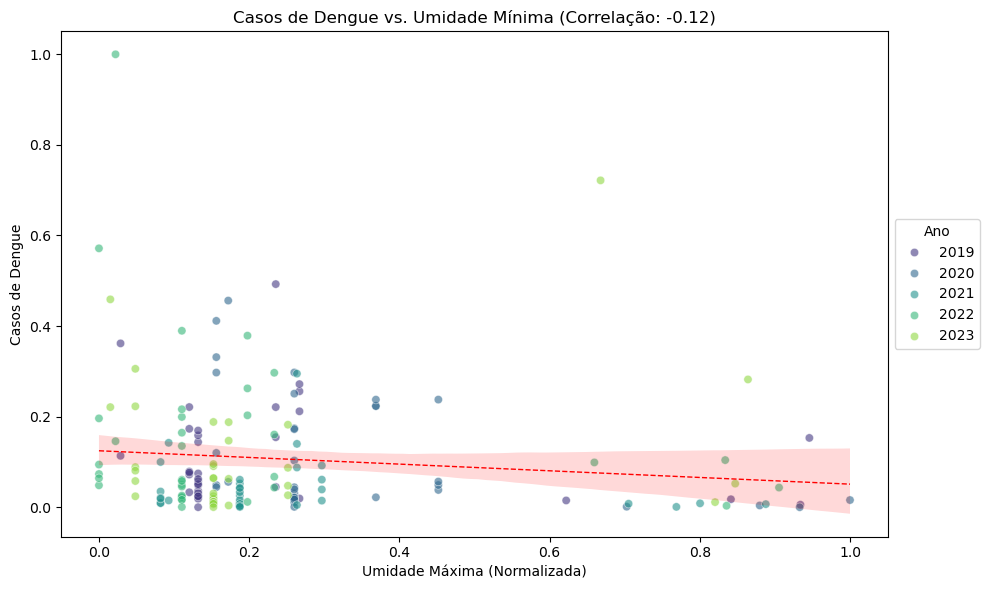

In [628]:
plot_dengue_vs_variable(pd.concat(tabelas_dengue), 'UMIDADE_MIN_NORMALIZADA', 'Umidade Máxima (Normalizada)', 'Casos de Dengue vs. Umidade Mínima')


## **Gráfico de Casos de Dengue vs. Umidade Máxima**

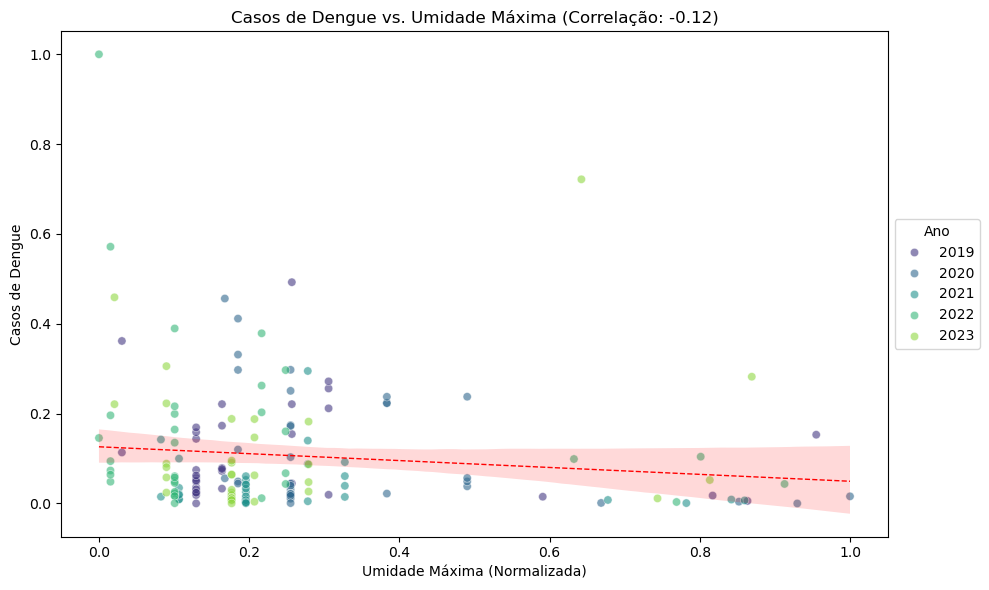

In [629]:
plot_dengue_vs_variable(pd.concat(tabelas_dengue), 'UMIDADE_MAX_NORMALIZADA', 'Umidade Máxima (Normalizada)', 'Casos de Dengue vs. Umidade Máxima')


## **Gráfico de Casos de Dengue vs. População**

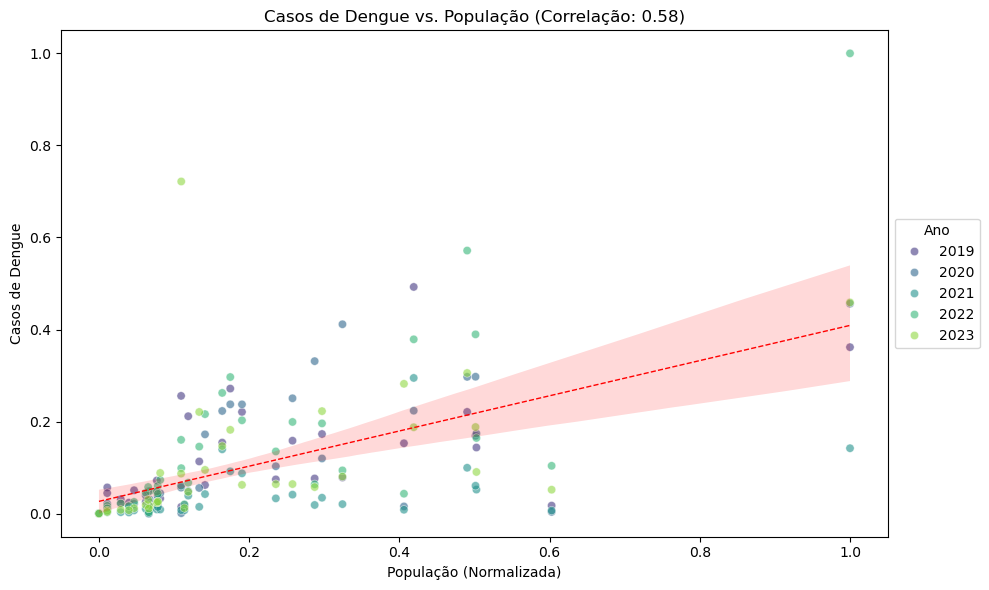

In [630]:
plot_dengue_vs_variable(pd.concat(tabelas_dengue), 'População_Normalizada', 'População (Normalizada)', 'Casos de Dengue vs. População')


# **Testes de Fisher e Análise de contingência**

## **2019**

In [631]:
init(autoreset=True)

caminho_csv = 'tabela_saude_com_normalizacao_2019.csv'  
dados = pd.read_csv(caminho_csv)

def criar_tabela_contingencia(df, feature):
    df['Casos_Categorizados'] = df['casos_normalizados'].apply(lambda x: 'Alto' if x > df['casos_normalizados'].median() else 'Baixo')
    df['Feature_Categorizada'] = df[feature].apply(lambda x: 'Alto' if x > df[feature].median() else 'Baixo')
    tabela = pd.crosstab(df['Casos_Categorizados'], df['Feature_Categorizada'])
    return tabela

features = [
        'PRECIPITAÇÃO NORMALIZADA', 
        'TEMP MAX NORMALIZADA',
        'TEMP MIN NORMALIZADA', 
        'UMIDADE MAX NORMALIZADA',
        'UMIDADE MIN NORMALIZADA',
        'População Normalizada'
]

resultados = {}

for feature in features:
    tabela = criar_tabela_contingencia(dados, feature)
    print(f"\n{'=' * 50}\nTabela de Contingência para '{feature}':\n{'=' * 50}")
    
    print(tabulate(tabela, headers="keys", tablefmt="fancy_grid", stralign="center"))
    
    if tabela.shape == (2, 2):
        _, p_value = fisher_exact(tabela)
        resultados[feature] = p_value
    else:
        print(f"A tabela para {feature} não é 2x2. Não foi possível realizar o teste de Fisher.")
        print("Dimensões da tabela:", tabela.shape) 

resultados_df = pd.DataFrame.from_dict(resultados, orient='index', columns=['Valor-p']).reset_index()
resultados_df.columns = ['Feature', 'Valor-p']
resultados_df['Significativo'] = resultados_df['Valor-p'].apply(lambda x: f"{Fore.GREEN}✔️{Style.RESET_ALL}" if x < 0.05 else f"{Fore.RED}❌{Style.RESET_ALL}")
resultados_df['Valor-p'] = resultados_df['Valor-p'].apply(lambda x: f"{x:.4f}")

print("\nResultados do teste de Fisher:\n")
print(tabulate(resultados_df, headers=["Feature", "Valor-p", "Significativo"], tablefmt="fancy_grid", stralign="center"))

print("\nInterpretação dos resultados detalhada:")
for _, row in resultados_df.iterrows():
    if row['Significativo'] == f"{Fore.GREEN}✔️{Style.RESET_ALL}":
        print(f"{Fore.GREEN}✔️ A relação entre 'casos_normalizados' e '{row['Feature']}' é estatisticamente significativa (p < 0.05).{Style.RESET_ALL}")
        print(f"{Fore.GREEN}Isso indica que a categoria 'Alto' ou 'Baixo' de '{row['Feature']}' tem uma distribuição não aleatória em relação aos casos de dengue, sugerindo uma possível associação.{Style.RESET_ALL}")
    else:
        print(f"{Fore.RED}❌ A relação entre 'casos_normalizados' e '{row['Feature']}' não é estatisticamente significativa (p >= 0.05).{Style.RESET_ALL}")
        print(f"{Fore.RED}Essa falta de significância sugere que as categorias de '{row['Feature']}' ('Alto' ou 'Baixo') podem não estar relacionadas diretamente aos casos de dengue.{Style.RESET_ALL}")


Tabela de Contingência para 'PRECIPITAÇÃO NORMALIZADA':
╒═══════════════════════╤════════╤═════════╕
│  Casos_Categorizados  │   Alto │   Baixo │
╞═══════════════════════╪════════╪═════════╡
│         Alto          │      6 │      11 │
├───────────────────────┼────────┼─────────┤
│         Baixo         │      2 │      16 │
╘═══════════════════════╧════════╧═════════╛

Tabela de Contingência para 'TEMP MAX NORMALIZADA':
╒═══════════════════════╤════════╤═════════╕
│  Casos_Categorizados  │   Alto │   Baixo │
╞═══════════════════════╪════════╪═════════╡
│         Alto          │     10 │       7 │
├───────────────────────┼────────┼─────────┤
│         Baixo         │      6 │      12 │
╘═══════════════════════╧════════╧═════════╛

Tabela de Contingência para 'TEMP MIN NORMALIZADA':
╒═══════════════════════╤════════╤═════════╕
│  Casos_Categorizados  │   Alto │   Baixo │
╞═══════════════════════╪════════╪═════════╡
│         Alto          │     10 │       7 │
├───────────────────────┼──

## **2020**

In [632]:
init(autoreset=True)

caminho_csv = 'tabela_saude_com_normalizacao_2020.csv'  
dados = pd.read_csv(caminho_csv)

def criar_tabela_contingencia(df, feature):
    df['Casos_Categorizados'] = df['casos_normalizados'].apply(lambda x: 'Alto' if x > df['casos_normalizados'].median() else 'Baixo')
    df['Feature_Categorizada'] = df[feature].apply(lambda x: 'Alto' if x > df[feature].median() else 'Baixo')
    tabela = pd.crosstab(df['Casos_Categorizados'], df['Feature_Categorizada'])
    return tabela

features = [
        'PRECIPITAÇÃO NORMALIZADA', 
        'TEMP MAX NORMALIZADA',
        'TEMP MIN NORMALIZADA', 
        'UMIDADE MAX NORMALIZADA',
        'UMIDADE MIN NORMALIZADA',
        'População Normalizada'
]

resultados = {}

for feature in features:
    tabela = criar_tabela_contingencia(dados, feature)
    print(f"\n{'=' * 50}\nTabela de Contingência para '{feature}':\n{'=' * 50}")
    
    print(tabulate(tabela, headers="keys", tablefmt="fancy_grid", stralign="center"))
    
    if tabela.shape == (2, 2):
        _, p_value = fisher_exact(tabela)
        resultados[feature] = p_value
    else:
        print(f"A tabela para {feature} não é 2x2. Não foi possível realizar o teste de Fisher.")
        print("Dimensões da tabela:", tabela.shape) 

resultados_df = pd.DataFrame.from_dict(resultados, orient='index', columns=['Valor-p']).reset_index()
resultados_df.columns = ['Feature', 'Valor-p']
resultados_df['Significativo'] = resultados_df['Valor-p'].apply(lambda x: f"{Fore.GREEN}✔️{Style.RESET_ALL}" if x < 0.05 else f"{Fore.RED}❌{Style.RESET_ALL}")
resultados_df['Valor-p'] = resultados_df['Valor-p'].apply(lambda x: f"{x:.4f}")

print("\nResultados do teste de Fisher:\n")
print(tabulate(resultados_df, headers=["Feature", "Valor-p", "Significativo"], tablefmt="fancy_grid", stralign="center"))

print("\nInterpretação dos resultados detalhada:")
for _, row in resultados_df.iterrows():
    if row['Significativo'] == f"{Fore.GREEN}✔️{Style.RESET_ALL}":
        print(f"{Fore.GREEN}✔️ A relação entre 'casos_normalizados' e '{row['Feature']}' é estatisticamente significativa (p < 0.05).{Style.RESET_ALL}")
        print(f"{Fore.GREEN}Isso indica que a categoria 'Alto' ou 'Baixo' de '{row['Feature']}' tem uma distribuição não aleatória em relação aos casos de dengue, sugerindo uma possível associação.{Style.RESET_ALL}")
    else:
        print(f"{Fore.RED}❌ A relação entre 'casos_normalizados' e '{row['Feature']}' não é estatisticamente significativa (p >= 0.05).{Style.RESET_ALL}")
        print(f"{Fore.RED}Essa falta de significância sugere que as categorias de '{row['Feature']}' ('Alto' ou 'Baixo') podem não estar relacionadas diretamente aos casos de dengue.{Style.RESET_ALL}")


Tabela de Contingência para 'PRECIPITAÇÃO NORMALIZADA':
╒═══════════════════════╤════════╤═════════╕
│  Casos_Categorizados  │   Alto │   Baixo │
╞═══════════════════════╪════════╪═════════╡
│         Alto          │      8 │       8 │
├───────────────────────┼────────┼─────────┤
│         Baixo         │      6 │      13 │
╘═══════════════════════╧════════╧═════════╛

Tabela de Contingência para 'TEMP MAX NORMALIZADA':
╒═══════════════════════╤════════╤═════════╕
│  Casos_Categorizados  │   Alto │   Baixo │
╞═══════════════════════╪════════╪═════════╡
│         Alto          │      8 │       8 │
├───────────────────────┼────────┼─────────┤
│         Baixo         │      8 │      11 │
╘═══════════════════════╧════════╧═════════╛

Tabela de Contingência para 'TEMP MIN NORMALIZADA':
╒═══════════════════════╤════════╤═════════╕
│  Casos_Categorizados  │   Alto │   Baixo │
╞═══════════════════════╪════════╪═════════╡
│         Alto          │      8 │       8 │
├───────────────────────┼──

## **2021**

In [633]:
init(autoreset=True)

caminho_csv = 'tabela_saude_com_normalizacao_2021.csv'  
dados = pd.read_csv(caminho_csv)

def criar_tabela_contingencia(df, feature):
    df['Casos_Categorizados'] = df['casos_normalizados'].apply(lambda x: 'Alto' if x > df['casos_normalizados'].median() else 'Baixo')
    df['Feature_Categorizada'] = df[feature].apply(lambda x: 'Alto' if x > df[feature].median() else 'Baixo')
    tabela = pd.crosstab(df['Casos_Categorizados'], df['Feature_Categorizada'])
    return tabela

features = [
        'PRECIPITAÇÃO NORMALIZADA', 
        'TEMP MAX NORMALIZADA',
        'TEMP MIN NORMALIZADA', 
        'UMIDADE MAX NORMALIZADA',
        'UMIDADE MIN NORMALIZADA',
        'População Normalizada'
]

resultados = {}

for feature in features:
    tabela = criar_tabela_contingencia(dados, feature)
    print(f"\n{'=' * 50}\nTabela de Contingência para '{feature}':\n{'=' * 50}")
    
    print(tabulate(tabela, headers="keys", tablefmt="fancy_grid", stralign="center"))
    
    if tabela.shape == (2, 2):
        _, p_value = fisher_exact(tabela)
        resultados[feature] = p_value
    else:
        print(f"A tabela para {feature} não é 2x2. Não foi possível realizar o teste de Fisher.")
        print("Dimensões da tabela:", tabela.shape) 

resultados_df = pd.DataFrame.from_dict(resultados, orient='index', columns=['Valor-p']).reset_index()
resultados_df.columns = ['Feature', 'Valor-p']
resultados_df['Significativo'] = resultados_df['Valor-p'].apply(lambda x: f"{Fore.GREEN}✔️{Style.RESET_ALL}" if x < 0.05 else f"{Fore.RED}❌{Style.RESET_ALL}")
resultados_df['Valor-p'] = resultados_df['Valor-p'].apply(lambda x: f"{x:.4f}")

print("\nResultados do teste de Fisher:\n")
print(tabulate(resultados_df, headers=["Feature", "Valor-p", "Significativo"], tablefmt="fancy_grid", stralign="center"))

print("\nInterpretação dos resultados detalhada:")
for _, row in resultados_df.iterrows():
    if row['Significativo'] == f"{Fore.GREEN}✔️{Style.RESET_ALL}":
        print(f"{Fore.GREEN}✔️ A relação entre 'casos_normalizados' e '{row['Feature']}' é estatisticamente significativa (p < 0.05).{Style.RESET_ALL}")
        print(f"{Fore.GREEN}Isso indica que a categoria 'Alto' ou 'Baixo' de '{row['Feature']}' tem uma distribuição não aleatória em relação aos casos de dengue, sugerindo uma possível associação.{Style.RESET_ALL}")
    else:
        print(f"{Fore.RED}❌ A relação entre 'casos_normalizados' e '{row['Feature']}' não é estatisticamente significativa (p >= 0.05).{Style.RESET_ALL}")
        print(f"{Fore.RED}Essa falta de significância sugere que as categorias de '{row['Feature']}' ('Alto' ou 'Baixo') podem não estar relacionadas diretamente aos casos de dengue.{Style.RESET_ALL}")


Tabela de Contingência para 'PRECIPITAÇÃO NORMALIZADA':
╒═══════════════════════╤════════╤═════════╕
│  Casos_Categorizados  │   Alto │   Baixo │
╞═══════════════════════╪════════╪═════════╡
│         Alto          │      7 │      10 │
├───────────────────────┼────────┼─────────┤
│         Baixo         │     10 │       8 │
╘═══════════════════════╧════════╧═════════╛

Tabela de Contingência para 'TEMP MAX NORMALIZADA':
╒═══════════════════════╤════════╤═════════╕
│  Casos_Categorizados  │   Alto │   Baixo │
╞═══════════════════════╪════════╪═════════╡
│         Alto          │      8 │       9 │
├───────────────────────┼────────┼─────────┤
│         Baixo         │      8 │      10 │
╘═══════════════════════╧════════╧═════════╛

Tabela de Contingência para 'TEMP MIN NORMALIZADA':
╒═══════════════════════╤════════╤═════════╕
│  Casos_Categorizados  │   Alto │   Baixo │
╞═══════════════════════╪════════╪═════════╡
│         Alto          │      8 │       9 │
├───────────────────────┼──

## **2022**

In [634]:
init(autoreset=True)

caminho_csv = 'tabela_saude_com_normalizacao_2022.csv'  
dados = pd.read_csv(caminho_csv)

def criar_tabela_contingencia(df, feature):
    df['Casos_Categorizados'] = df['casos_normalizados'].apply(lambda x: 'Alto' if x > df['casos_normalizados'].median() else 'Baixo')
    df['Feature_Categorizada'] = df[feature].apply(lambda x: 'Alto' if x > df[feature].median() else 'Baixo')
    tabela = pd.crosstab(df['Casos_Categorizados'], df['Feature_Categorizada'])
    return tabela

features = [
        'PRECIPITAÇÃO NORMALIZADA', 
        'TEMP MAX NORMALIZADA',
        'TEMP MIN NORMALIZADA', 
        'UMIDADE MAX NORMALIZADA',
        'UMIDADE MIN NORMALIZADA',
        'População Normalizada'
]

resultados = {}

for feature in features:
    tabela = criar_tabela_contingencia(dados, feature)
    print(f"\n{'=' * 50}\nTabela de Contingência para '{feature}':\n{'=' * 50}")
    
    print(tabulate(tabela, headers="keys", tablefmt="fancy_grid", stralign="center"))
    
    if tabela.shape == (2, 2):
        _, p_value = fisher_exact(tabela)
        resultados[feature] = p_value
    else:
        print(f"A tabela para {feature} não é 2x2. Não foi possível realizar o teste de Fisher.")
        print("Dimensões da tabela:", tabela.shape) 

resultados_df = pd.DataFrame.from_dict(resultados, orient='index', columns=['Valor-p']).reset_index()
resultados_df.columns = ['Feature', 'Valor-p']
resultados_df['Significativo'] = resultados_df['Valor-p'].apply(lambda x: f"{Fore.GREEN}✔️{Style.RESET_ALL}" if x < 0.05 else f"{Fore.RED}❌{Style.RESET_ALL}")
resultados_df['Valor-p'] = resultados_df['Valor-p'].apply(lambda x: f"{x:.4f}")

print("\nResultados do teste de Fisher:\n")
print(tabulate(resultados_df, headers=["Feature", "Valor-p", "Significativo"], tablefmt="fancy_grid", stralign="center"))

print("\nInterpretação dos resultados detalhada:")
for _, row in resultados_df.iterrows():
    if row['Significativo'] == f"{Fore.GREEN}✔️{Style.RESET_ALL}":
        print(f"{Fore.GREEN}✔️ A relação entre 'casos_normalizados' e '{row['Feature']}' é estatisticamente significativa (p < 0.05).{Style.RESET_ALL}")
        print(f"{Fore.GREEN}Isso indica que a categoria 'Alto' ou 'Baixo' de '{row['Feature']}' tem uma distribuição não aleatória em relação aos casos de dengue, sugerindo uma possível associação.{Style.RESET_ALL}")
    else:
        print(f"{Fore.RED}❌ A relação entre 'casos_normalizados' e '{row['Feature']}' não é estatisticamente significativa (p >= 0.05).{Style.RESET_ALL}")
        print(f"{Fore.RED}Essa falta de significância sugere que as categorias de '{row['Feature']}' ('Alto' ou 'Baixo') podem não estar relacionadas diretamente aos casos de dengue.{Style.RESET_ALL}")


Tabela de Contingência para 'PRECIPITAÇÃO NORMALIZADA':
╒═══════════════════════╤════════╤═════════╕
│  Casos_Categorizados  │   Alto │   Baixo │
╞═══════════════════════╪════════╪═════════╡
│         Alto          │      6 │      11 │
├───────────────────────┼────────┼─────────┤
│         Baixo         │      4 │      14 │
╘═══════════════════════╧════════╧═════════╛

Tabela de Contingência para 'TEMP MAX NORMALIZADA':
╒═══════════════════════╤════════╤═════════╕
│  Casos_Categorizados  │   Alto │   Baixo │
╞═══════════════════════╪════════╪═════════╡
│         Alto          │      9 │       8 │
├───────────────────────┼────────┼─────────┤
│         Baixo         │      7 │      11 │
╘═══════════════════════╧════════╧═════════╛

Tabela de Contingência para 'TEMP MIN NORMALIZADA':
╒═══════════════════════╤════════╤═════════╕
│  Casos_Categorizados  │   Alto │   Baixo │
╞═══════════════════════╪════════╪═════════╡
│         Alto          │      9 │       8 │
├───────────────────────┼──

## **2023**

In [635]:
init(autoreset=True)

caminho_csv = 'tabela_saude_com_normalizacao_2023.csv'  
dados = pd.read_csv(caminho_csv)

def criar_tabela_contingencia(df, feature):
    df['Casos_Categorizados'] = df['casos_normalizados'].apply(lambda x: 'Alto' if x > df['casos_normalizados'].median() else 'Baixo')
    df['Feature_Categorizada'] = df[feature].apply(lambda x: 'Alto' if x > df[feature].median() else 'Baixo')
    tabela = pd.crosstab(df['Casos_Categorizados'], df['Feature_Categorizada'])
    return tabela

features = [
        'PRECIPITAÇÃO NORMALIZADA', 
        'TEMP MAX NORMALIZADA',
        'TEMP MIN NORMALIZADA', 
        'UMIDADE MAX NORMALIZADA',
        'UMIDADE MIN NORMALIZADA',
        'População Normalizada'
    ]

resultados = {}

for feature in features:
    tabela = criar_tabela_contingencia(dados, feature)
    print(f"\n{'=' * 50}\nTabela de Contingência para '{feature}':\n{'=' * 50}")
    
    print(tabulate(tabela, headers="keys", tablefmt="fancy_grid", stralign="center"))
    
    if tabela.shape == (2, 2):
        _, p_value = fisher_exact(tabela)
        resultados[feature] = p_value
    else:
        print(f"A tabela para {feature} não é 2x2. Não foi possível realizar o teste de Fisher.")
        print("Dimensões da tabela:", tabela.shape) 

resultados_df = pd.DataFrame.from_dict(resultados, orient='index', columns=['Valor-p']).reset_index()
resultados_df.columns = ['Feature', 'Valor-p']
resultados_df['Significativo'] = resultados_df['Valor-p'].apply(lambda x: f"{Fore.GREEN}✔️{Style.RESET_ALL}" if x < 0.05 else f"{Fore.RED}❌{Style.RESET_ALL}")
resultados_df['Valor-p'] = resultados_df['Valor-p'].apply(lambda x: f"{x:.4f}")

print("\nResultados do teste de Fisher:\n")
print(tabulate(resultados_df, headers=["Feature", "Valor-p", "Significativo"], tablefmt="fancy_grid", stralign="center"))

print("\nInterpretação dos resultados detalhada:")
for _, row in resultados_df.iterrows():
    if row['Significativo'] == f"{Fore.GREEN}✔️{Style.RESET_ALL}":
        print(f"{Fore.GREEN}✔️ A relação entre 'casos_normalizados' e '{row['Feature']}' é estatisticamente significativa (p < 0.05).{Style.RESET_ALL}")
        print(f"{Fore.GREEN}Isso indica que a categoria 'Alto' ou 'Baixo' de '{row['Feature']}' tem uma distribuição não aleatória em relação aos casos de dengue, sugerindo uma possível associação.{Style.RESET_ALL}")
    else:
        print(f"{Fore.RED}❌ A relação entre 'casos_normalizados' e '{row['Feature']}' não é estatisticamente significativa (p >= 0.05).{Style.RESET_ALL}")
        print(f"{Fore.RED}Essa falta de significância sugere que as categorias de '{row['Feature']}' ('Alto' ou 'Baixo') podem não estar relacionadas diretamente aos casos de dengue.{Style.RESET_ALL}")


Tabela de Contingência para 'PRECIPITAÇÃO NORMALIZADA':
╒═══════════════════════╤════════╤═════════╕
│  Casos_Categorizados  │   Alto │   Baixo │
╞═══════════════════════╪════════╪═════════╡
│         Alto          │      9 │       8 │
├───────────────────────┼────────┼─────────┤
│         Baixo         │      5 │      13 │
╘═══════════════════════╧════════╧═════════╛

Tabela de Contingência para 'TEMP MAX NORMALIZADA':
╒═══════════════════════╤════════╤═════════╕
│  Casos_Categorizados  │   Alto │   Baixo │
╞═══════════════════════╪════════╪═════════╡
│         Alto          │     10 │       7 │
├───────────────────────┼────────┼─────────┤
│         Baixo         │      6 │      12 │
╘═══════════════════════╧════════╧═════════╛

Tabela de Contingência para 'TEMP MIN NORMALIZADA':
╒═══════════════════════╤════════╤═════════╕
│  Casos_Categorizados  │   Alto │   Baixo │
╞═══════════════════════╪════════╪═════════╡
│         Alto          │     10 │       7 │
├───────────────────────┼──

## **2019 a 2023**

In [636]:
resultado = pd.concat(tabelas_dengue)
resultado.to_csv('resultado_dengue.csv', index=False)
init(autoreset=True)
caminho_csv = 'resultado_dengue.csv'  
dados = pd.read_csv(caminho_csv)


### **Função para Criar Tabela de Contingência**

In [637]:
def criar_tabela_contingencia(df, feature):
    df['Casos_Categorizados'] = df['casos_normalizados'].apply(lambda x: 'Alto' if x > df['casos_normalizados'].median() else 'Baixo')
    df['Feature_Categorizada'] = df[feature].apply(lambda x: 'Alto' if x > df[feature].median() else 'Baixo')
    tabela = pd.crosstab(df['Casos_Categorizados'], df['Feature_Categorizada'])
    return tabela

### **Lista de Features para Análise**

In [638]:
features = [
    'PRECIPITAÇÃO_NORMALIZADA',
    'TEMP_MAX_NORMALIZADA',
    'TEMP_MIN_NORMALIZADA',
    'UMIDADE_MAX_NORMALIZADA',
    'UMIDADE_MIN_NORMALIZADA',
    'População_Normalizada'
    
]

### **Dicionário para Armazenar Resultados**

In [639]:
resultados = {}

for feature in features:
    tabela = criar_tabela_contingencia(dados, feature)
    print(f"\n{'=' * 50}\nTabela de Contingência para '{feature}':\n{'=' * 50}")
    
    print(tabulate(tabela, headers="keys", tablefmt="fancy_grid", stralign="center"))

    if tabela.shape == (2, 2):
        _, p_value = fisher_exact(tabela)
        resultados[feature] = p_value
    else:
        print(f"A tabela para {feature} não é 2x2. Não foi possível realizar o teste de Fisher.")
        print("Dimensões da tabela:", tabela.shape) 



Tabela de Contingência para 'PRECIPITAÇÃO_NORMALIZADA':
╒═══════════════════════╤════════╤═════════╕
│  Casos_Categorizados  │   Alto │   Baixo │
╞═══════════════════════╪════════╪═════════╡
│         Alto          │     40 │      47 │
├───────────────────────┼────────┼─────────┤
│         Baixo         │     44 │      44 │
╘═══════════════════════╧════════╧═════════╛

Tabela de Contingência para 'TEMP_MAX_NORMALIZADA':
╒═══════════════════════╤════════╤═════════╕
│  Casos_Categorizados  │   Alto │   Baixo │
╞═══════════════════════╪════════╪═════════╡
│         Alto          │     43 │      44 │
├───────────────────────┼────────┼─────────┤
│         Baixo         │     38 │      50 │
╘═══════════════════════╧════════╧═════════╛

Tabela de Contingência para 'TEMP_MIN_NORMALIZADA':
╒═══════════════════════╤════════╤═════════╕
│  Casos_Categorizados  │   Alto │   Baixo │
╞═══════════════════════╪════════╪═════════╡
│         Alto          │     43 │      44 │
├───────────────────────┼──

### **Resultados do Teste de Fisher**

In [640]:
resultados_df = pd.DataFrame.from_dict(resultados, orient='index', columns=['Valor-p']).reset_index()
resultados_df.columns = ['Feature', 'Valor-p']
resultados_df['Significativo'] = resultados_df['Valor-p'].apply(lambda x: f"{Fore.GREEN}✔️{Style.RESET_ALL}" if x < 0.05 else f"{Fore.RED}❌{Style.RESET_ALL}")
resultados_df['Valor-p'] = resultados_df['Valor-p'].apply(lambda x: f"{x:.4f}")

print("\nResultados do teste de Fisher:\n")
print(tabulate(resultados_df, headers=["Feature", "Valor-p", "Significativo"], tablefmt="fancy_grid", stralign="center"))



Resultados do teste de Fisher:

╒════╤══════════════════════════╤═══════════╤═════════════════╕
│    │         Feature          │   Valor-p │  Significativo  │
╞════╪══════════════════════════╪═══════════╪═════════════════╡
│  0 │ PRECIPITAÇÃO_NORMALIZADA │    0.6509 │       ❌        │
├────┼──────────────────────────┼───────────┼─────────────────┤
│  1 │   TEMP_MAX_NORMALIZADA   │    0.45   │       ❌        │
├────┼──────────────────────────┼───────────┼─────────────────┤
│  2 │   TEMP_MIN_NORMALIZADA   │    0.763  │       ❌        │
├────┼──────────────────────────┼───────────┼─────────────────┤
│  3 │ UMIDADE_MAX_NORMALIZADA  │    0.8791 │       ❌        │
├────┼──────────────────────────┼───────────┼─────────────────┤
│  4 │ UMIDADE_MIN_NORMALIZADA  │    0.0969 │       ❌        │
├────┼──────────────────────────┼───────────┼─────────────────┤
│  5 │  População_Normalizada   │    0      │       ✔️        │
╘════╧══════════════════════════╧═══════════╧═════════════════╛


### **Interpretação Detalhada dos Resultados**

In [641]:
print("\nInterpretação dos resultados detalhada:")
for _, row in resultados_df.iterrows():
    if row['Significativo'] == f"{Fore.GREEN}✔️{Style.RESET_ALL}":
        print(f"{Fore.GREEN}✔️ A relação entre 'casos_normalizados' e '{row['Feature']}' é estatisticamente significativa (p < 0.05).{Style.RESET_ALL}")
        print(f"{Fore.GREEN}Isso indica que a categoria 'Alto' ou 'Baixo' de '{row['Feature']}' tem uma distribuição não aleatória em relação aos casos de dengue, sugerindo uma possível associação.{Style.RESET_ALL}")
    else:
        print(f"{Fore.RED}❌ A relação entre 'casos_normalizados' e '{row['Feature']}' não é estatisticamente significativa (p >= 0.05).{Style.RESET_ALL}")
        print(f"{Fore.RED}Essa falta de significância sugere que as categorias de '{row['Feature']}' ('Alto' ou 'Baixo') podem não estar relacionadas diretamente aos casos de dengue.{Style.RESET_ALL}")



Interpretação dos resultados detalhada:
❌ A relação entre 'casos_normalizados' e 'PRECIPITAÇÃO_NORMALIZADA' não é estatisticamente significativa (p >= 0.05).
Essa falta de significância sugere que as categorias de 'PRECIPITAÇÃO_NORMALIZADA' ('Alto' ou 'Baixo') podem não estar relacionadas diretamente aos casos de dengue.
❌ A relação entre 'casos_normalizados' e 'TEMP_MAX_NORMALIZADA' não é estatisticamente significativa (p >= 0.05).
Essa falta de significância sugere que as categorias de 'TEMP_MAX_NORMALIZADA' ('Alto' ou 'Baixo') podem não estar relacionadas diretamente aos casos de dengue.
❌ A relação entre 'casos_normalizados' e 'TEMP_MIN_NORMALIZADA' não é estatisticamente significativa (p >= 0.05).
Essa falta de significância sugere que as categorias de 'TEMP_MIN_NORMALIZADA' ('Alto' ou 'Baixo') podem não estar relacionadas diretamente aos casos de dengue.
❌ A relação entre 'casos_normalizados' e 'UMIDADE_MAX_NORMALIZADA' não é estatisticamente significativa (p >= 0.05).
Essa falt